# Tensorflow 2.0 필수 라이브러리 및 오류해결

In [ ]:
# tensorflow-gpu gpu 메모리 부족 해결코드
from tensorflow.compat.v1 import ConfigProto

from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()

config.gpu_options.allow_growth = True

session = InteractiveSession(config=config)

In [2]:
import numpy as np
import tensorflow as tf
print(tf.__version__)

2.4.1


In [ ]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


In [4]:
tf.config.list_physical_devices('GPU')
tf.test.is_gpu_available()

True

# Chapter 1 tensorflow 2.0 시작하기

In [ ]:
rand = tf.random.normal([4],0,1)
print(rand)

tf.Tensor([-0.27794364 -0.2886678  -0.09243643 -0.7156889 ], shape=(4,), dtype=float32)


In [ ]:
# 시그모이드 함수 구현
import math
def sigmoid(x):
    return 1 / (1+math.exp(-x))

In [ ]:
x=1; y=0
w = tf.random.normal([1],0,1)
output = sigmoid(x*w)
print(output)

0.877097329376089


In [ ]:
x=0; y=1

In [ ]:
b=tf.random.normal([1],0,1)

In [ ]:
for i in range(1000):
    output=sigmoid(x*w+1*b)
    error=y-output
    w=w+x*0.1*error
    b= b+1*0.1*error
    
    if i % 100 == 99:
        print(i,error,output)

99 0.10375725104710065 0.8962427489528993
199 0.05279605051011038 0.9472039494898896
299 0.035047096178722814 0.9649529038212772
399 0.026146832333819536 0.9738531676661805
499 0.020822983668229655 0.9791770163317703
599 0.01728801229835475 0.9827119877016453
699 0.01477286847252246 0.9852271315274775
799 0.012893159780322794 0.9871068402196772
899 0.011435753715546282 0.9885642462844537
999 0.010273056744165454 0.9897269432558345


In [ ]:
# AND 게이트 학습
import numpy as np
x=np.array([[1,1],[1,0],[0,1],[0,0]])
y=np.array([[1],[0],[0],[0]])
w=tf.random.normal([2],0,1)
b=tf.random.normal([1],0,1)
b_x = 1

for i in range(2000):
    error_sum=0
    for j in range(4):
        output=sigmoid(np.sum(x[j]*w)+b_x*b)
        error = y[j][0] - output
        w=w+x[j]*0.1*error
        b=b+b_x*0.1*error
        error_sum+=error
        
    if i % 200 ==199:
        print(i,error_sum)

199 -0.10128447518067475
399 -0.06240381922075877
599 -0.04496346125119559
799 -0.035044316258209654
999 -0.028662506265802787
1199 -0.024220586609005328
1399 -0.020955198193838814
1599 -0.018456644563333638
1799 -0.016484790712491468
1999 -0.014888897734003622


In [ ]:
#네트워크 평가
for i in range(4):
    print('X:',x[i],"Y: ",y[i],'Output: ',sigmoid(np.sum(x[i]*w)+b))

X: [1 1] Y:  [1] Output:  0.9652422173116615
X: [1 0] Y:  [0] Output:  0.024633152057371037
X: [0 1] Y:  [0] Output:  0.02470781060994387
X: [0 0] Y:  [0] Output:  2.3038673576712106e-05


In [ ]:
print('w:',w)
print('b:',b)

w: tf.Tensor([6.999593  7.0026956], shape=(2,), dtype=float32)
b: tf.Tensor([-10.678313], shape=(1,), dtype=float32)


In [ ]:
# OR 게이트 학습
import numpy as np
x=np.array([[1,1],[1,0],[0,1],[0,0]])
y=np.array([[1],[1],[1],[0]])
w=tf.random.normal([2],0,1)
b=tf.random.normal([1],0,1)
b_x = 1

for i in range(2000):
    error_sum=0
    for j in range(4):
        output=sigmoid(np.sum(x[j]*w)+b_x*b)
        error = y[j][0] - output
        w=w+x[j]*0.1*error
        b=b+b_x*0.1*error
        error_sum+=error
        
    if i % 200 ==199:
        print(i,error_sum)

199 -0.046310368590889994
399 -0.0248848721886816
599 -0.016930754797617187
799 -0.012789474514386653
999 -0.010258632553909464
1199 -0.00855545544546242
1399 -0.007332732410475974
1599 -0.006412825006072521
1799 -0.005696991581043205
1999 -0.005122475706342718


In [ ]:
#네트워크 평가
for i in range(4):
    print('X:',x[i],"Y: ",y[i],'Output: ',sigmoid(np.sum(x[i]*w)+b))

X: [1 1] Y:  [1] Output:  0.9999972497233606
X: [1 0] Y:  [1] Output:  0.9898296654301435
X: [0 1] Y:  [1] Output:  0.9898333993627683
X: [0 0] Y:  [0] Output:  0.025398976148055624


In [ ]:
# XOR 게이트 학습
import numpy as np
x=np.array([[1,1],[1,0],[0,1],[0,0]])
y=np.array([[0],[1],[1],[0]])
w=tf.random.normal([2],0,1)
b=tf.random.normal([1],0,1)
b_x = 1

for i in range(2000):
    error_sum=0
    for j in range(4):
        output=sigmoid(np.sum(x[j]*w)+b_x*b)
        error = y[j][0] - output
        w=w+x[j]*0.1*error
        b=b+b_x*0.1*error
        error_sum+=error
        
    if i % 200 ==199:
        print(i,error_sum)

199 0.0026941106820037586
399 0.00010950406016552172
599 4.451592229504087e-06
799 1.7311216671256346e-07
999 2.7921316370083105e-09
1199 1.8614210173240053e-09
1399 1.8614210173240053e-09
1599 1.8614210173240053e-09
1799 1.8614210173240053e-09
1999 1.8614210173240053e-09


In [ ]:
#네트워크 평가
for i in range(4):
    print('X:',x[i],"Y: ",y[i],'Output: ',sigmoid(np.sum(x[i]*w)+b))

X: [1 1] Y:  [0] Output:  0.5128176323940516
X: [1 0] Y:  [1] Output:  0.5128176314633411
X: [0 1] Y:  [1] Output:  0.4999999990686774
X: [0 0] Y:  [0] Output:  0.49999999813735485


In [ ]:
print('w:',w)
print('b:',b)

w: tf.Tensor([5.1281769e-02 3.7252903e-09], shape=(2,), dtype=float32)
b: tf.Tensor([-7.450581e-09], shape=(1,), dtype=float32)


In [ ]:
# XOR 게이트의 해결책은 여러개의 퍼셉트론으로 구성하는것
import numpy as np
x=np.array([[1,1],[1,0],[0,1],[0,0]])
y=np.array([[0],[1],[1],[0]])

model= tf.keras.Sequential([
    tf.keras.layers.Dense(units=2,activation='sigmoid',input_shape=(2,)),
    tf.keras.layers.Dense(units=1,activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.SGD(lr=0.1),loss='mse')

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 2)                 6         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 3         
Total params: 9
Trainable params: 9
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(x,y,epochs=2000,batch_size=1)

Epoch 1/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2669
Epoch 2/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2655
Epoch 3/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2641
Epoch 4/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2631
Epoch 5/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2622
Epoch 6/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2614
Epoch 7/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2609
Epoch 8/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2602
Epoch 9/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2597
Epoch 10/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2591
Epoch 11/2000
4/4 [==============================] - 0s 250us/step - loss: 0.2588
Epoch 12/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2585
Epoch 13/2000
4/4 [======

4/4 [==============================] - 0s 499us/step - loss: 0.2554
Epoch 102/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2553
Epoch 103/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2554
Epoch 104/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2554
Epoch 105/2000
4/4 [==============================] - 0s 250us/step - loss: 0.2553
Epoch 106/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2553
Epoch 107/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2552
Epoch 108/2000
4/4 [==============================] - 0s 250us/step - loss: 0.2552
Epoch 109/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2553
Epoch 110/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2552
Epoch 111/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2552
Epoch 112/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2552
Epoch 113/2000
4/4 

4/4 [==============================] - 0s 498us/step - loss: 0.2532
Epoch 298/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2532
Epoch 299/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2531
Epoch 300/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2530
Epoch 301/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2530
Epoch 302/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2531
Epoch 303/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2531
Epoch 304/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2531
Epoch 305/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2531
Epoch 306/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2531
Epoch 307/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2530
Epoch 308/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2530
Epoch 309/2000
4/4 

4/4 [==============================] - 0s 499us/step - loss: 0.2501
Epoch 494/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2501
Epoch 495/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2500
Epoch 496/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2500
Epoch 497/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2500
Epoch 498/2000
4/4 [==============================] - 0s 498us/step - loss: 0.2500
Epoch 499/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2500
Epoch 500/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2499
Epoch 501/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2498
Epoch 502/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2498
Epoch 503/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2499
Epoch 504/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2498
Epoch 505/2000
4/4 

4/4 [==============================] - 0s 499us/step - loss: 0.2429
Epoch 690/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2427
Epoch 691/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2427
Epoch 692/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2426
Epoch 693/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2426
Epoch 694/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2426
Epoch 695/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2425
Epoch 696/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2424
Epoch 697/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2424
Epoch 698/2000
4/4 [==============================] - ETA: 0s - loss: 0.216 - 0s 249us/step - loss: 0.2423
Epoch 699/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2423
Epoch 700/2000
4/4 [==============================] - 0s 499us/step - loss: 0.

4/4 [==============================] - 0s 249us/step - loss: 0.2253
Epoch 886/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2252
Epoch 887/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2251
Epoch 888/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2249
Epoch 889/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2248
Epoch 890/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2247
Epoch 891/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2246
Epoch 892/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2244
Epoch 893/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2243
Epoch 894/2000
4/4 [==============================] - 0s 249us/step - loss: 0.2242
Epoch 895/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2241
Epoch 896/2000
4/4 [==============================] - 0s 499us/step - loss: 0.2240
Epoch 897/2000
4/4 

4/4 [==============================] - 0s 249us/step - loss: 0.1984
Epoch 1081/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1982
Epoch 1082/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1981
Epoch 1083/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1979
Epoch 1084/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1978
Epoch 1085/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1977
Epoch 1086/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1975
Epoch 1087/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1974
Epoch 1088/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1972
Epoch 1089/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1971
Epoch 1090/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1970
Epoch 1091/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1968
Epoch 10

4/4 [==============================] - 0s 250us/step - loss: 0.1745
Epoch 1275/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1744
Epoch 1276/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1743
Epoch 1277/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1742
Epoch 1278/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1741
Epoch 1279/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1740
Epoch 1280/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1739
Epoch 1281/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1738
Epoch 1282/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1737
Epoch 1283/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1736
Epoch 1284/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1735
Epoch 1285/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1734
Epoch 12

4/4 [==============================] - 0s 499us/step - loss: 0.1589
Epoch 1469/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1589
Epoch 1470/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1588
Epoch 1471/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1587
Epoch 1472/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1587
Epoch 1473/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1586
Epoch 1474/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1586
Epoch 1475/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1585
Epoch 1476/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1584
Epoch 1477/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1584
Epoch 1478/2000
4/4 [==============================] - 0s 498us/step - loss: 0.1583
Epoch 1479/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1583
Epoch 14

4/4 [==============================] - 0s 249us/step - loss: 0.1496
Epoch 1663/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1495
Epoch 1664/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1495
Epoch 1665/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1495
Epoch 1666/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1494
Epoch 1667/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1494
Epoch 1668/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1494
Epoch 1669/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1493
Epoch 1670/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1493
Epoch 1671/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1492
Epoch 1672/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1492
Epoch 1673/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1492
Epoch 16

4/4 [==============================] - 0s 499us/step - loss: 0.1439
Epoch 1857/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1439
Epoch 1858/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1438
Epoch 1859/2000
4/4 [==============================] - 0s 249us/step - loss: 0.1438
Epoch 1860/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1438
Epoch 1861/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1438
Epoch 1862/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1437
Epoch 1863/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1437
Epoch 1864/2000
4/4 [==============================] - 0s 250us/step - loss: 0.1437
Epoch 1865/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1437
Epoch 1866/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1436
Epoch 1867/2000
4/4 [==============================] - 0s 499us/step - loss: 0.1436
Epoch 18

In [ ]:
model.predict(x)

array([[0.5033876 ],
       [0.8926086 ],
       [0.47535065],
       [0.13051143]], dtype=float32)

In [ ]:
for weight in model.weights:
    print(weight)

<tf.Variable 'dense_6/kernel:0' shape=(2, 2) dtype=float32, numpy=
array([[ 3.1667302, -2.381407 ],
       [-4.930199 , -4.3788805]], dtype=float32)>
<tf.Variable 'dense_6/bias:0' shape=(2,) dtype=float32, numpy=array([-2.4908557,  0.3952241], dtype=float32)>
<tf.Variable 'dense_7/kernel:0' shape=(2, 1) dtype=float32, numpy=
array([[ 3.9058042],
       [-3.615341 ]], dtype=float32)>
<tf.Variable 'dense_7/bias:0' shape=(1,) dtype=float32, numpy=array([-0.03493549], dtype=float32)>


import matplotlib.pyplot as plt
x=range(20)
y=tf.random.normal([20],0,1)
plt.plot(x,y,'bo')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
random_normal=tf.random.normal([100000],0,1)
plt.hist(random_normal,bins=100)
plt.show()

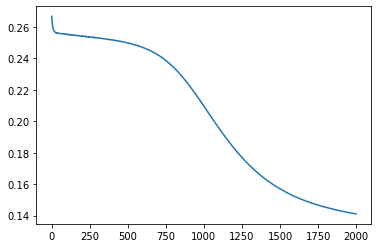

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])

# Chapter2 회귀

### 2.1 선형회귀

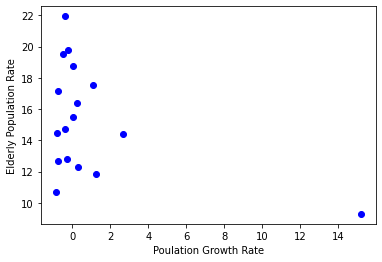

In [ ]:
# 2018년 대한민국 지역별 인구증가율과 고령인구비율 사이에 어떤 경향성이 있는지 선형회귀로 예측
import matplotlib.pyplot as plt
population_inc = [0.3, -0.78, 1.26, 0.03, 1.11, 15.17, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율
population_old = [12.27, 14.44, 11.87, 18.75, 17.52, 9.29, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율
plt.plot(population_inc,population_old,'bo')
plt.xlabel('Poulation Growth Rate')
plt.ylabel('Elderly Population Rate')
plt.show()

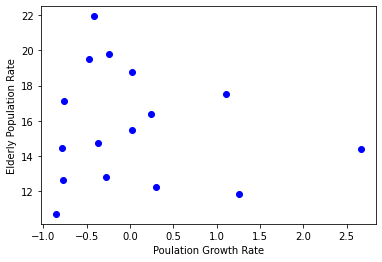

In [ ]:
# 극단치 제거
import matplotlib.pyplot as plt
population_inc = [0.3, -0.78, 1.26, 0.03, 1.11, 15.17, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율
population_inc=population_inc[:5]+population_inc[6:]
population_old = [12.27, 14.44, 11.87, 18.75, 17.52, 9.29, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율
population_old=population_old[:5]+population_old[6:]
plt.plot(population_inc,population_old,'bo')
plt.xlabel('Poulation Growth Rate')
plt.ylabel('Elderly Population Rate')
plt.show()

a:  -0.355834147915461 b:  15.669317743971302


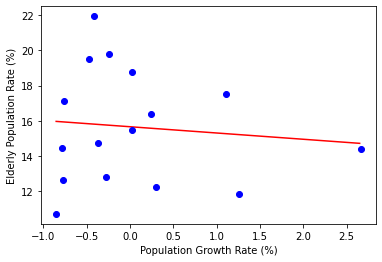

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
X = [0.3, -0.78, 1.26, 0.03, 1.11, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율 극단치 제거
Y = [12.27, 14.44, 11.87, 18.75, 17.52, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율 극단치 제거

# X,Y의 평균을 구합니다.
x_bar= sum(X) / len(X)
y_bar= sum(Y) / len(Y)

# 최소제곱법으로 a,b를 구합니다.
a=sum([(y-y_bar)*(x-x_bar) for y,x in list(zip(Y,X))])
a /= sum([(x-x_bar)**2 for x in X])
b = y_bar -a *x_bar
print('a: ',a,'b: ' ,b)

# 그래프를 그리기 위해 회구선의 x,y 데이터를 구합니다.
line_x = np.arange(min(X),max(X),0.01)
line_y = a*line_x + b

# 붉은색 실선으로 회귀선을 그립니다.
plt.plot(line_x,line_y,'r-')

plt.plot(X,Y,'bo')
plt.xlabel('Population Growth Rate (%)')
plt.ylabel('Elderly Population Rate (%)')
plt.show()

99 a:  0.09299813 b:  7.212157 loss:  81.138466
199 a:  -0.1396222 b:  11.59819 loss:  26.316437
299 a:  -0.27043086 b:  14.061161 loss:  12.360972
399 a:  -0.32854736 b:  15.155505 loss:  10.044195
499 a:  -0.3488171 b:  15.537191 loss:  9.798221
599 a:  -0.35438952 b:  15.642116 loss:  9.781542
699 a:  -0.3555982 b:  15.664879 loss:  9.780823
799 a:  -0.3558041 b:  15.668751 loss:  9.780804
899 a:  -0.35583106 b:  15.669264 loss:  9.780804
999 a:  -0.35583305 b:  15.669303 loss:  9.780804


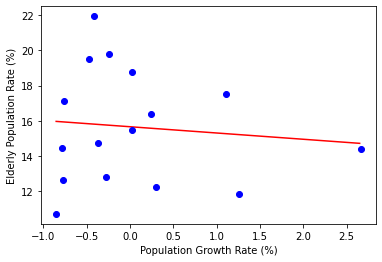

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import random

# tensorflow를 이용한 선형회귀

X = [0.3, -0.78, 1.26, 0.03, 1.11, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율 극단치 제거
Y = [12.27, 14.44, 11.87, 18.75, 17.52, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율 극단치 제거

# a와 b를 랜덤한 값으로 초기화합니다.
a=tf.Variable(random.random())
b=tf.Variable(random.random())

# 잔차의 제곱의 평균을 반환하는 함수
def compute_loss():
    y_pred=a*X + b
    loss=tf.reduce_mean((Y-y_pred) ** 2)
    return loss

optimizer = tf.optimizers.Adam(lr=0.07)
for i in range(1000):
    # 잔차의 제곱의 평균을 최소화(minimize)합니다.
    optimizer.minimize(compute_loss, var_list=[a,b])
    
    if i % 100 == 99:
        print(i,'a: ', a.numpy(),'b: ', b.numpy(), 'loss: ', compute_loss().numpy())
        
line_x = np.arange(min(X),max(X),0.01)
line_y = a*line_x + b

# 그래프 작성
plt.plot(line_x,line_y,'r-')
plt.plot(X,Y,'bo')
plt.xlabel('Population Growth Rate (%)')
plt.ylabel('Elderly Population Rate (%)')
plt.show()

### 2.2 다항회귀

99 a:  3.9189174 b:  -5.548876 c:  6.3076367 loss:  70.59807
199 a:  2.892418 b:  -4.747092 c:  10.145403 loss:  32.726482
299 a:  1.38321 b:  -2.4829814 c:  12.783568 loss:  16.703045
399 a:  0.3956942 b:  -0.9822985 c:  14.462433 loss:  11.220992
499 a:  -0.14567372 b:  -0.1600006 c:  15.384711 loss:  9.792173
599 a:  -0.40312776 b:  0.23100944 c:  15.823515 loss:  9.506056
699 a:  -0.5097354 b:  0.39291847 c:  16.005228 loss:  9.461882
799 a:  -0.5482316 b:  0.45138368 c:  16.070847 loss:  9.456626
899 a:  -0.5603471 b:  0.46978372 c:  16.091497 loss:  9.456145
999 a:  -0.56366056 b:  0.47481596 c:  16.097147 loss:  9.456112


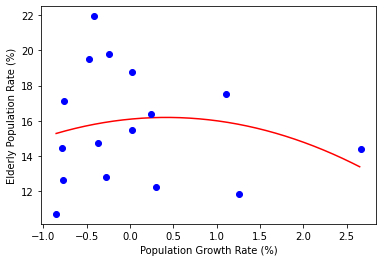

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import random

# 다항회귀 2차함수

X = [0.3, -0.78, 1.26, 0.03, 1.11, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율 극단치 제거
Y = [12.27, 14.44, 11.87, 18.75, 17.52, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율 극단치 제거

# a,b,c 를 랜덤한 값으로 초기화합니다.
a=tf.Variable(random.random())
b=tf.Variable(random.random())
c=tf.Variable(random.random())


# 잔차의 제곱의 평균을 반환하는 함수
def compute_loss():
    y_pred=a * X*X + b*X + c # 강조
    loss=tf.reduce_mean((Y-y_pred) ** 2)
    return loss

optimizer = tf.keras.optimizers.Adam(lr=0.07)
for i in range(1000):
    # 잔차의 제곱의 평균을 최소화(minimize)합니다.
    optimizer.minimize(compute_loss, var_list=[a,b,c])
    
    if i % 100 == 99:
        print(i,'a: ', a.numpy(),'b: ', b.numpy(),'c: ', c.numpy(), 'loss: ', compute_loss().numpy())
        
line_x = np.arange(min(X),max(X),0.01)
line_y = a*line_x*line_x + b*line_x + c

# 그래프 작성
plt.plot(line_x,line_y,'r-')
plt.plot(X,Y,'bo')
plt.xlabel('Population Growth Rate (%)')
plt.ylabel('Elderly Population Rate (%)')
plt.show()

99 a:  -1.0507581 b:  5.462678 c:  -3.6889524 d:  6.5830555 loss:  61.505688
199 a:  -1.8299878 b:  6.434727 c:  -2.3809958 d:  10.116642 loss:  29.609388
299 a:  -1.5845128 b:  4.890417 c:  -0.97250336 d:  12.2347 loss:  19.447834
399 a:  -0.9074495 b:  2.7133195 c:  -0.54200965 d:  13.692814 loss:  13.997936
499 a:  -0.22839385 b:  0.72229916 c:  -0.44126257 d:  14.780868 loss:  10.870949
599 a:  0.31523484 b:  -0.8428703 c:  -0.40970522 d:  15.594684 loss:  9.245255
699 a:  0.709936 b:  -1.9754968 c:  -0.3931124 d:  16.17772 loss:  8.489737
799 a:  0.97792256 b:  -2.7440462 c:  -0.38259152 d:  16.572529 loss:  8.175379
899 a:  1.1492199 b:  -3.235235 c:  -0.3759753 d:  16.82472 loss:  8.058213
999 a:  1.2524393 b:  -3.5311992 c:  -0.37200886 d:  16.976652 loss:  8.019123


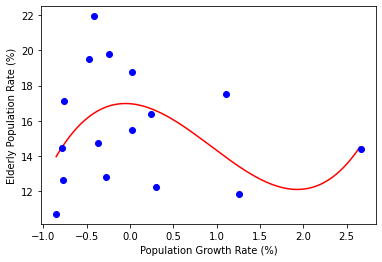

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import random

# 다항회귀 3차함수

X = [0.3, -0.78, 1.26, 0.03, 1.11, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율 극단치 제거
Y = [12.27, 14.44, 11.87, 18.75, 17.52, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율 극단치 제거

# a,b,c 를 랜덤한 값으로 초기화합니다.
a=tf.Variable(random.random())
b=tf.Variable(random.random())
c=tf.Variable(random.random())
d=tf.Variable(random.random())


# 잔차의 제곱의 평균을 반환하는 함수
def compute_loss():
    y_pred=a * X*X*X + b*X*X + c*X + d # 강조
    loss=tf.reduce_mean((Y-y_pred) ** 2)
    return loss

optimizer = tf.keras.optimizers.Adam(lr=0.07)
for i in range(1000):
    # 잔차의 제곱의 평균을 최소화(minimize)합니다.
    optimizer.minimize(compute_loss, var_list=[a,b,c,d])
    
    if i % 100 == 99:
        print(i,'a: ', a.numpy(),'b: ', b.numpy(),'c: ', c.numpy(),'d: ', d.numpy(), 'loss: ', compute_loss().numpy())
        
line_x = np.arange(min(X),max(X),0.01)
line_y = a*line_x*line_x*line_x + b*line_x*line_x + c*line_x + d

# 그래프 작성
plt.plot(line_x,line_y,'r-')
plt.plot(X,Y,'bo')
plt.xlabel('Population Growth Rate (%)')
plt.ylabel('Elderly Population Rate (%)')
plt.show()

### 2.3 딥러닝 네트워크를 이용한 회귀

In [ ]:
import tensorflow as tf
import numpy as np

# 딥러닝 네트워크를 이용한 회귀
X = [0.3, -0.78, 1.26, 0.03, 1.11, 0.24, -0.24, -0.47, -0.77, -0.37, -0.85, -0.41, -0.27, 0.02, -0.76, 2.66] # 인구증가율 극단치 제거
Y = [12.27, 14.44, 11.87, 18.75, 17.52, 16.37, 19.78, 19.51, 12.65, 14.74, 10.72, 21.94, 12.83, 15.51, 17.14, 14.42] # 고령인구비율 극단치 제거

model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=6,activation='tanh',input_shape=(1,)),
    tf.keras.layers.Dense(units=1)
])

model.compile(optimizer=tf.keras.optimizers.SGD(lr=0.1),loss='mse')

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 6)                 12        
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 7         
Total params: 19
Trainable params: 19
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(X,Y,epochs=10)

Epoch 1/10
1/1 [==============================] - 0s 997us/step - loss: 254.2902
Epoch 2/10
1/1 [==============================] - 0s 997us/step - loss: 113.4031
Epoch 3/10
1/1 [==============================] - 0s 998us/step - loss: 9.5871
Epoch 4/10
1/1 [==============================] - 0s 997us/step - loss: 9.5668
Epoch 5/10
1/1 [==============================] - 0s 997us/step - loss: 9.5475
Epoch 6/10
1/1 [==============================] - 0s 998us/step - loss: 9.5275
Epoch 7/10
1/1 [==============================] - 0s 997us/step - loss: 9.5057
Epoch 8/10
1/1 [==============================] - 0s 997us/step - loss: 9.4818
Epoch 9/10
1/1 [==============================] - 0s 0s/step - loss: 9.4552
Epoch 10/10
1/1 [==============================] - 0s 998us/step - loss: 9.4256


In [ ]:
model.predict(X)

array([[15.788012 ],
       [15.728006 ],
       [15.110603 ],
       [15.889549 ],
       [15.218138 ],
       [15.816837 ],
       [15.912982 ],
       [15.8703575],
       [15.734029 ],
       [15.895781 ],
       [15.683304 ],
       [15.886863 ],
       [15.910632 ],
       [15.891849 ],
       [15.739958 ],
       [14.212312 ]], dtype=float32)

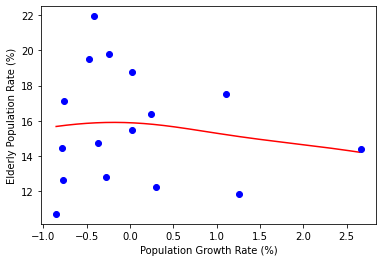

In [ ]:
import matplotlib.pyplot as plt

line_x=np.arange(min(X),max(X),0.01)
line_y=model.predict(line_x)

plt.plot(line_x,line_y,'r-')
plt.plot(X,Y,'bo')
plt.xlabel("Population Growth Rate (%)")
plt.ylabel("Elderly Population Rate (%)")
plt.show()

### 2.4 보스턴 주택 가격 데이터세트

In [ ]:
from tensorflow.keras.datasets import boston_housing
(train_X,train_Y),(test_X,test_Y)=boston_housing.load_data()

print(len(train_X),len(test_X))
print(train_X[0])
print(train_Y[0])

404 102
[  1.23247   0.        8.14      0.        0.538     6.142    91.7
   3.9769    4.      307.       21.      396.9      18.72   ]
15.2


In [ ]:
## 데이터 정규화 전처리
x_mean=train_X.mean()
x_std=train_X.std()
train_X-=x_mean
train_X /= x_std
test_X -=x_mean
test_X /=x_std

y_mean=train_Y.mean()
y_std=train_Y.std()
train_Y-=y_mean
train_Y /= y_std
test_Y -=y_mean
test_Y /=y_std

print(train_X[0])
print(train_Y[0])

[-0.47482083 -0.48335641 -0.42698208 -0.48335641 -0.47963044 -0.44081941
  0.15172056 -0.45581402 -0.45565404  1.64280094 -0.33791894  2.26541184
 -0.35370929]
-0.782152603377916


In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=52,activation='relu',input_shape=(13,)),
    tf.keras.layers.Dense(units=39,activation='relu'),
    tf.keras.layers.Dense(units=26,activation='relu'),
    tf.keras.layers.Dense(units=1)
])

model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.07),loss='mse')

model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 52)                728       
_________________________________________________________________
dense_13 (Dense)             (None, 39)                2067      
_________________________________________________________________
dense_14 (Dense)             (None, 26)                1040      
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 27        
Total params: 3,862
Trainable params: 3,862
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(train_X,train_Y,epochs=25,batch_size=32,validation_split=0.25)

Epoch 1/25
10/10 [==============================] - 0s 19ms/step - loss: 3.4394 - val_loss: 1.1302
Epoch 2/25
10/10 [==============================] - 0s 2ms/step - loss: 0.8614 - val_loss: 1.4319
Epoch 3/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7884 - val_loss: 1.0670
Epoch 4/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7574 - val_loss: 1.0663
Epoch 5/25
10/10 [==============================] - 0s 2ms/step - loss: 0.8173 - val_loss: 1.0937
Epoch 6/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7608 - val_loss: 1.0748
Epoch 7/25
10/10 [==============================] - 0s 3ms/step - loss: 0.6937 - val_loss: 1.1064
Epoch 8/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6824 - val_loss: 1.1473
Epoch 9/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6706 - val_loss: 1.1085
Epoch 10/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6619 - val_loss: 1.0456
Epoch 11/25
10/10 

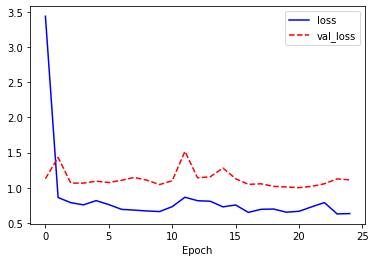

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], 'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
model.evaluate(test_X,test_Y)

4/4 [==============================] - 0s 748us/step - loss: 0.7675


0.7674565315246582

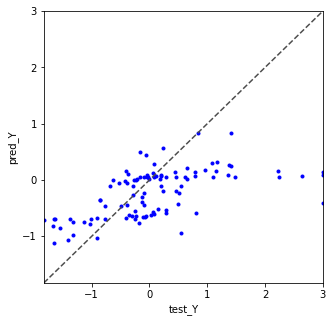

In [ ]:
import matplotlib.pyplot as plt

pred_Y=model.predict(test_X)
plt.figure(figsize=(5,5))
plt.plot(test_Y,pred_Y,'b.')
plt.axis([min(test_Y),max(test_Y),min(test_Y),max(test_Y)])

#y=x에 해당하는 대각선
plt.plot([min(test_Y),max(test_Y)],[min(test_Y),max(test_Y)],ls="--",c='.3')
plt.xlabel('test_Y')
plt.ylabel('pred_Y')

plt.show()

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=52,activation='relu',input_shape=(13,)),
    tf.keras.layers.Dense(units=39,activation='relu'),
    tf.keras.layers.Dense(units=26,activation='relu'),
    tf.keras.layers.Dense(units=1)
])

model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.07),loss='mse')

history=model.fit(train_X,train_Y,epochs=25,batch_size=32,validation_split=0.25,
                  callbacks=[tf.keras.callbacks.EarlyStopping(patience=3,monitor='val_loss')])

Epoch 1/25
10/10 [==============================] - 0s 8ms/step - loss: 4.9397 - val_loss: 1.1951
Epoch 2/25
10/10 [==============================] - 0s 2ms/step - loss: 0.9342 - val_loss: 1.3462
Epoch 3/25
10/10 [==============================] - 0s 2ms/step - loss: 0.8900 - val_loss: 1.1442
Epoch 4/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7976 - val_loss: 1.3645
Epoch 5/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7169 - val_loss: 1.7747
Epoch 6/25
10/10 [==============================] - 0s 2ms/step - loss: 0.7712 - val_loss: 1.0618
Epoch 7/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6928 - val_loss: 1.0254
Epoch 8/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6827 - val_loss: 1.1660
Epoch 9/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6605 - val_loss: 1.0733
Epoch 10/25
10/10 [==============================] - 0s 2ms/step - loss: 0.6578 - val_loss: 1.0444


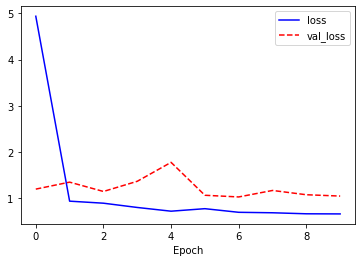

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], 'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
model.evaluate(test_X,test_Y)

4/4 [==============================] - 0s 748us/step - loss: 0.6691


0.6690887808799744

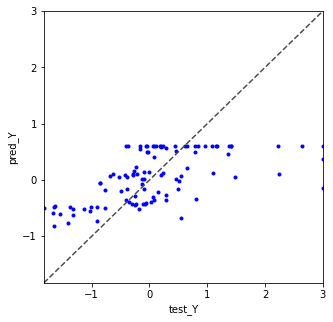

In [ ]:
import matplotlib.pyplot as plt

pred_Y=model.predict(test_X)

plt.figure(figsize=(5,5))
plt.plot(test_Y,pred_Y,'b.')
plt.axis([min(test_Y),max(test_Y),min(test_Y),max(test_Y)])

#y=x에 해당하는 대각선
plt.plot([min(test_Y),max(test_Y)],[min(test_Y),max(test_Y)],ls="--",c='.3')
plt.xlabel('test_Y')
plt.ylabel('pred_Y')

plt.show()

# Chapter3 분류

### 3.1 이항 분류

In [ ]:
import pandas as pd
red = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv', sep=';')
white = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep=';')
print(red.head())
print(white.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  
0      9.4        5  
1      9.8        5  
2      9.8        5 

In [ ]:
red['type'] = 0
white['type'] = 1
print(red.head(2))
print(white.head(2))

wine = pd.concat([red, white])
print(wine.describe())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70          0.0             1.9      0.076   
1            7.8              0.88          0.0             2.6      0.098   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   

   alcohol  quality  type  
0      9.4        5     0  
1      9.8        5     0  
   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   

   free sulfur dioxide  total sulfur dioxide  density   pH  sulphates  \
0                 45.0                 170.0    1.001  3.0       0.45   
1                 14.0                 132.0    0.994  3.3       0.49   

   

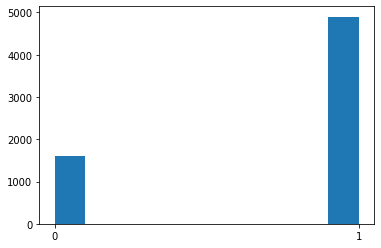

1    4898
0    1599
Name: type, dtype: int64


In [ ]:
import matplotlib.pyplot as plt
plt.hist(wine['type'])
plt.xticks([0,1])
plt.show()

print(wine['type'].value_counts())

In [ ]:
print(wine.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  type                  6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 710.6 KB
None


In [ ]:
wine_norm = (wine - wine.min()) / (wine.max() - wine.min())
print(wine_norm.head())
print(wine_norm.describe())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0       0.297521          0.413333     0.000000        0.019939   0.111296   
1       0.330579          0.533333     0.000000        0.030675   0.147841   
2       0.330579          0.453333     0.024096        0.026074   0.137874   
3       0.611570          0.133333     0.337349        0.019939   0.109635   
4       0.297521          0.413333     0.000000        0.019939   0.111296   

   free sulfur dioxide  total sulfur dioxide   density        pH  sulphates  \
0             0.034722              0.064516  0.206092  0.612403   0.191011   
1             0.083333              0.140553  0.186813  0.372093   0.258427   
2             0.048611              0.110599  0.190669  0.418605   0.241573   
3             0.055556              0.124424  0.209948  0.341085   0.202247   
4             0.034722              0.064516  0.206092  0.612403   0.191011   

    alcohol   quality  type  
0  0.202899  0.333333   0.

In [ ]:
import numpy as np
wine_shuffle = wine_norm.sample(frac=1)
print(wine_shuffle.head())
wine_np = wine_shuffle.to_numpy()
print(wine_np[:5])

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
950        0.314050          0.176667     0.156627        0.019939   0.056478   
2104       0.181818          0.053333     0.180723        0.093558   0.056478   
3746       0.297521          0.126667     0.168675        0.018405   0.051495   
2656       0.272727          0.100000     0.144578        0.073620   0.049834   
2700       0.223140          0.253333     0.186747        0.067485   0.029900   

      free sulfur dioxide  total sulfur dioxide   density        pH  \
950              0.048611              0.294931  0.125120  0.279070   
2104             0.145833              0.338710  0.154039  0.705426   
3746             0.152778              0.264977  0.064006  0.232558   
2656             0.204861              0.437788  0.148255  0.364341   
2700             0.048611              0.152074  0.087527  0.418605   

      sulphates   alcohol   quality  type  
950    0.089888  0.217391  0.333333   1.0 

In [ ]:
import tensorflow as tf
train_idx=int(len(wine_np)*0.8)
tarin_X, train_Y = wine_np[:train_idx, :-1], wine_np[:train_idx, -1]
test_X, test_Y = wine_np[train_idx:, :-1], wine_np[train_idx:, -1]
print(train_X[0])
print(train_Y[0])
print(test_X[0])
print(test_Y[0])
train_Y=tf.keras.utils.to_categorical(train_Y,num_classes=2)
test_Y=tf.keras.utils.to_categorical(test_Y,num_classes=2)
print(train_Y[0])
print(test_Y[0])

[0.67768595 0.2        0.3373494  0.02300613 0.13953488 0.01736111
 0.04147465 0.23404666 0.3255814  0.2752809  0.42028986 0.5       ]
1.0
[0.2892562  0.24       0.12048193 0.01533742 0.06644518 0.07986111
 0.13364055 0.1231926  0.51162791 0.19662921 0.53623188 0.5       ]
0.0
[0. 1.]
[1. 0.]


In [ ]:
import tensorflow as tf
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=48,activation='relu',input_shape=(12,)),
    tf.keras.layers.Dense(units=24,activation='relu'),
    tf.keras.layers.Dense(units=12,activation='relu'),
    tf.keras.layers.Dense(units=2,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.07),
             loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_68 (Dense)             (None, 48)                624       
_________________________________________________________________
dense_69 (Dense)             (None, 24)                1176      
_________________________________________________________________
dense_70 (Dense)             (None, 12)                300       
_________________________________________________________________
dense_71 (Dense)             (None, 2)                 26        
Total params: 2,126
Trainable params: 2,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(train_X,train_Y,epochs=25,batch_size=32,validation_split=0.25)

Epoch 1/25
122/122 [==============================] - 0s 741us/step - loss: 0.5648 - accuracy: 0.7511 - val_loss: 0.5411 - val_accuracy: 0.7685
Epoch 2/25
122/122 [==============================] - 0s 564us/step - loss: 0.5630 - accuracy: 0.7511 - val_loss: 0.5415 - val_accuracy: 0.7685
Epoch 3/25
122/122 [==============================] - 0s 564us/step - loss: 0.5621 - accuracy: 0.7511 - val_loss: 0.5412 - val_accuracy: 0.7685
Epoch 4/25
122/122 [==============================] - 0s 572us/step - loss: 0.5641 - accuracy: 0.7511 - val_loss: 0.5415 - val_accuracy: 0.7685
Epoch 5/25
122/122 [==============================] - 0s 564us/step - loss: 0.5629 - accuracy: 0.7511 - val_loss: 0.5416 - val_accuracy: 0.7685
Epoch 6/25
122/122 [==============================] - 0s 564us/step - loss: 0.5622 - accuracy: 0.7511 - val_loss: 0.5411 - val_accuracy: 0.7685
Epoch 7/25
122/122 [==============================] - 0s 572us/step - loss: 0.5650 - accuracy: 0.7511 - val_loss: 0.5420 - val_accuracy:

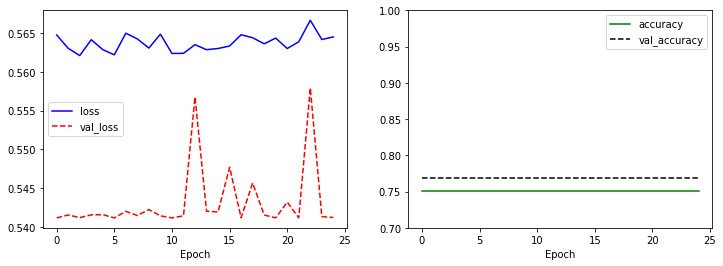

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

In [ ]:
model.evaluate(test_X,test_Y)

41/41 [==============================] - 0s 365us/step - loss: 0.5656 - accuracy: 0.7477


[0.5655876994132996, 0.7476922869682312]

### 3.2 다항 분류

In [ ]:
print(wine['quality'].describe())
print(wine['quality'].value_counts())

count    6497.000000
mean        5.818378
std         0.873255
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         9.000000
Name: quality, dtype: float64
6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64


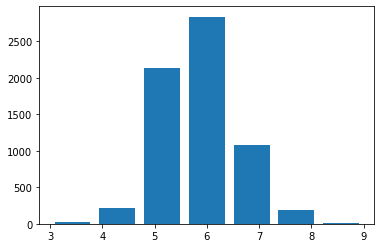

In [ ]:
import matplotlib.pyplot as plt
plt.hist(wine['quality'],bins=7,rwidth=0.8)
plt.show()

In [ ]:
wine.loc[wine['quality']<= 5, 'new quality'] = 0
wine.loc[wine['quality']== 6, 'new quality'] = 1
wine.loc[wine['quality']>= 7, 'new quality'] = 2

print(wine['new quality'].describe())
print(wine['new quality'].value_counts())

count    6497.000000
mean        0.829614
std         0.731124
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: new quality, dtype: float64
1.0    2836
0.0    2384
2.0    1277
Name: new quality, dtype: int64


In [ ]:
data = [['Apple',11],['Banana',23],['Coconut',35]]
df = pd.DataFrame(data, columns=['Fruit','Count'])
print(df)
print()
print(df.loc[0])
print()
print(df.loc[0,'Fruit'])

     Fruit  Count
0    Apple     11
1   Banana     23
2  Coconut     35

Fruit    Apple
Count       11
Name: 0, dtype: object

Apple


In [ ]:
import numpy as np
del wine['quality']
wine_norm = (wine - wine.min()) / (wine.max() - wine.min())
wine_shuffle = wine_norm.sample(frac=1)
wine_np = wine_shuffle.to_numpy()


train_idx=int(len(wine_np)*0.8)
tarin_X, train_Y = wine_np[:train_idx, :-1], wine_np[:train_idx, -1]
test_X, test_Y = wine_np[train_idx:, :-1], wine_np[train_idx:, -1]
train_Y=tf.keras.utils.to_categorical(train_Y,num_classes=3)
test_Y=tf.keras.utils.to_categorical(test_Y,num_classes=3)

In [ ]:
import tensorflow as tf
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=48,activation='relu',input_shape=(12,)),
    tf.keras.layers.Dense(units=24,activation='relu'),
    tf.keras.layers.Dense(units=12,activation='relu'),
    tf.keras.layers.Dense(units=3,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.07),
             loss='categorical_crossentropy',metrics=['accuracy'])

history=model.fit(train_X,train_Y,epochs=25,batch_size=32,validation_split=0.25)

Epoch 1/25
122/122 [==============================] - 0s 1ms/step - loss: 0.5162 - accuracy: 0.8006 - val_loss: 0.5092 - val_accuracy: 0.8000
Epoch 2/25
122/122 [==============================] - 0s 564us/step - loss: 0.5029 - accuracy: 0.8011 - val_loss: 0.5006 - val_accuracy: 0.8000
Epoch 3/25
122/122 [==============================] - 0s 564us/step - loss: 0.5031 - accuracy: 0.8011 - val_loss: 0.5026 - val_accuracy: 0.8000
Epoch 4/25
122/122 [==============================] - 0s 564us/step - loss: 0.5028 - accuracy: 0.8011 - val_loss: 0.5052 - val_accuracy: 0.8000
Epoch 5/25
122/122 [==============================] - 0s 564us/step - loss: 0.5033 - accuracy: 0.8011 - val_loss: 0.5018 - val_accuracy: 0.8000
Epoch 6/25
122/122 [==============================] - 0s 564us/step - loss: 0.5028 - accuracy: 0.8011 - val_loss: 0.5014 - val_accuracy: 0.8000
Epoch 7/25
122/122 [==============================] - 0s 564us/step - loss: 0.5010 - accuracy: 0.8011 - val_loss: 0.5035 - val_accuracy: 0

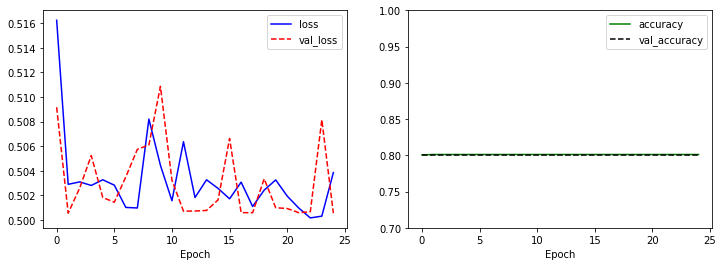

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

In [ ]:
model.evaluate(test_X,test_Y)

41/41 [==============================] - 0s 365us/step - loss: 0.4808 - accuracy: 0.8138


[0.4808492362499237, 0.8138461709022522]

### 3.3 Fashion MNIST

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_X, train_Y), (test_X,test_Y) = fashion_mnist.load_data()

print(len(train_X),len(test_X))

4423680/4422102 [==============================] - 0s 0us/step
60000 10000


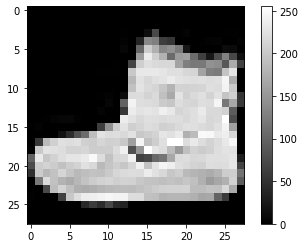

9


In [ ]:
import matplotlib.pyplot as plt
plt.imshow(train_X[0],cmap='gray')
plt.colorbar()
plt.show()

print(train_Y[0])

In [ ]:
train_X = train_X / 255.0
test_X = test_X / 255.0

print(train_X[0])

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.00392157 0.    

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28,28)),
    tf.keras.layers.Dense(units=128,activation='relu'),
    tf.keras.layers.Dense(units=10,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_78 (Dense)             (None, 128)               100480    
_________________________________________________________________
dense_79 (Dense)             (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(train_X,train_Y,epochs=25,validation_split=0.25)

Epoch 1/25
1407/1407 [==============================] - 1s 650us/step - loss: 0.1508 - accuracy: 0.9419 - val_loss: 0.3777 - val_accuracy: 0.8889
Epoch 2/25
1407/1407 [==============================] - 1s 641us/step - loss: 0.1474 - accuracy: 0.9444 - val_loss: 0.3819 - val_accuracy: 0.8863
Epoch 3/25
1407/1407 [==============================] - 1s 624us/step - loss: 0.1430 - accuracy: 0.9467 - val_loss: 0.3771 - val_accuracy: 0.8899
Epoch 4/25
1407/1407 [==============================] - 1s 622us/step - loss: 0.1408 - accuracy: 0.9479 - val_loss: 0.3687 - val_accuracy: 0.8911
Epoch 5/25
1407/1407 [==============================] - 1s 629us/step - loss: 0.1410 - accuracy: 0.9464 - val_loss: 0.3903 - val_accuracy: 0.8886
Epoch 6/25
1407/1407 [==============================] - 1s 622us/step - loss: 0.1328 - accuracy: 0.9503 - val_loss: 0.3930 - val_accuracy: 0.8848
Epoch 7/25
1407/1407 [==============================] - 1s 633us/step - loss: 0.1317 - accuracy: 0.9505 - val_loss: 0.4250 -

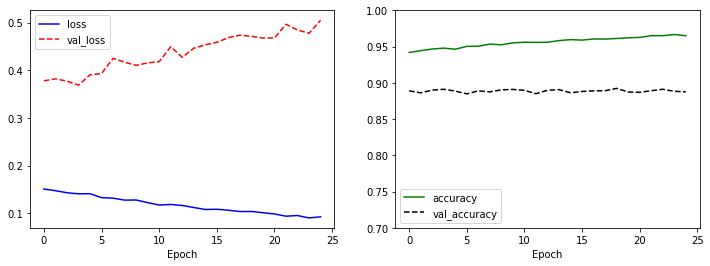

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

In [ ]:
model.evaluate(test_X,test_Y)

313/313 [==============================] - 0s 366us/step - loss: 0.5567 - accuracy: 0.8788


[0.5566858053207397, 0.8787999749183655]

# Chapter4 컨볼루션 신경망(CNN)

In [ ]:
# 컨볼루션 레이어 생성 코드 : 특징을 추출하는 역할, 학습이 가능
conv1 = tf.keras.layers.Conv2D(kernel_size=(3,3),strides=(2,2),padding='valid',filters=16)
# kernel_size : 필터 행렬의 크기
# strides : 필터가 계산과정에서 한 스텝마다 이동하는 크기
# padding : 컨볼루션 연산 전에 입력이미지 주변에 빈 값을 넣을지 지정하는 옵션, 'valid'와 'same' 2가지 옵션 중 하나를 사용
# valid : 빈값을 사용하지 x , same : 빈값을 넣어 출력 이미지의 크기를 입력과 같도록 보존
# filters : 필터 개수, 네트워크가 얼마나 많은 특징을 추출 할 수 있는지 결정

In [ ]:
# MaxPool2D 레이어 생성 코드 : 중요한 정보만 남기고 계산부담을 줄여주는 역할
pool1 = tf.keras.layers.MaxPool2D(pool_size=(2,2),strides=(2,2))
# pool_size : 한번에 Max 연산을 수행할 범위
# strides : 필터가 계산과정에서 한 스텝마다 이동하는 크기

In [ ]:
# 드롭아웃 레이어 생성 코드 : 과적합을 방지하는 역할
pool1 = tf.keras.layers.Dropout(rate=0.3)
# rate : 제외할 뉴런의 비율

### 4.1 Fashion MNIST 데이터세트에 적용하기

In [ ]:
import tensorflow as tf

fashion_mnist = tf.keras.datasets.fashion_mnist
(train_X, train_Y), (test_X,test_Y) = fashion_mnist.load_data()

train_X = train_X / 255.0
test_X = test_X / 255.0

In [ ]:
# reshape 이전
print(train_X.shape,test_X.shape)

train_X = train_X.reshape(-1,28,28,1)
test_X = test_X.reshape(-1,28,28,1)

# reshape 이후
print(train_X.shape,test_X.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


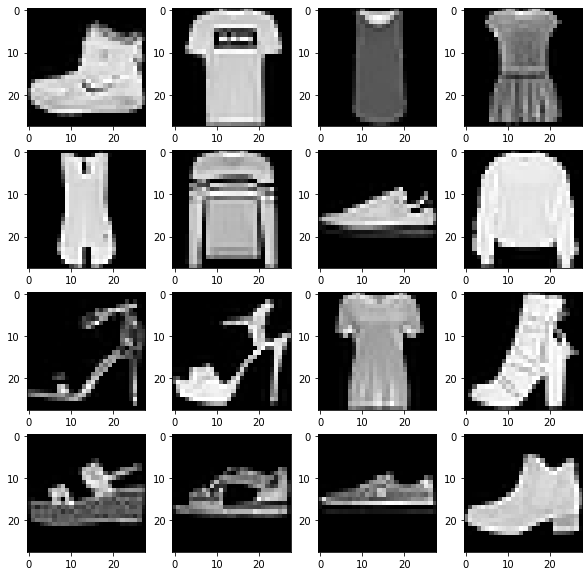

[9 0 0 3 0 2 7 2 5 5 0 9 5 5 7 9]


In [ ]:
import matplotlib.pyplot as plt
# 전체 그래프의 크기를 width=10,height=10 으로 지정합니다.
plt.figure(figsize=(10,10))
for c in range(16):
    # 4행 4열로 지정한 그리드에서 c+1번째의 칸에 그래프를 그립니다. 1~16번째 칸을 채우게 됩니다.
    plt. subplot(4,4,c+1)
    # 3차원 데이터를 2차원 데이터로 변환
    plt.imshow(train_X[c].reshape(28,28),cmap='gray')
    
plt.show()

# 훈련 데이터의 첫번째 ~ 16번째 까지의 라벨을 프린트합니다.
print(train_Y[:16])

In [ ]:
# 모델 생성(컨볼루션 레이어만 사용)
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(28,28,1),kernel_size=(3,3),filters=16),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=32),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=64),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128,activation='relu'),
    tf.keras.layers.Dense(units=10,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(),
             loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 16)        160       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        4640      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 64)        18496     
_________________________________________________________________
flatten (Flatten)            (None, 30976)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               3965056   
_________________________________________________________________
dense_1 (Dense)              (None, 10)                1290      
Total params: 3,989,642
Trainable params: 3,989,642
Non-trainable params: 0
______________________________________________

In [ ]:
!nvidia-smi

Wed Jan 27 21:23:35 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 461.40       Driver Version: 461.40       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 2060   WDDM  | 00000000:01:00.0  On |                  N/A |
| N/A   52C    P0    24W /  N/A |   6052MiB /  6144MiB |      4%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# 모델 학습
history = model.fit(train_X,train_Y,epochs=25,validation_split=0.25)

Epoch 1/25
1407/1407 [==============================] - 14s 5ms/step - loss: 0.5824 - accuracy: 0.7946 - val_loss: 0.3931 - val_accuracy: 0.8573
Epoch 2/25
1407/1407 [==============================] - 7s 5ms/step - loss: 0.3329 - accuracy: 0.8779 - val_loss: 0.3689 - val_accuracy: 0.8677
Epoch 3/25
1407/1407 [==============================] - 6s 5ms/step - loss: 0.2750 - accuracy: 0.8971 - val_loss: 0.3591 - val_accuracy: 0.8732
Epoch 4/25
1407/1407 [==============================] - 6s 5ms/step - loss: 0.2278 - accuracy: 0.9147 - val_loss: 0.3956 - val_accuracy: 0.8747
Epoch 5/25
1407/1407 [==============================] - 6s 5ms/step - loss: 0.1975 - accuracy: 0.9265 - val_loss: 0.4231 - val_accuracy: 0.8691
Epoch 6/25
1407/1407 [==============================] - 6s 5ms/step - loss: 0.1662 - accuracy: 0.9382 - val_loss: 0.4451 - val_accuracy: 0.8721
Epoch 7/25
1407/1407 [==============================] - 7s 5ms/step - loss: 0.1497 - accuracy: 0.9449 - val_loss: 0.5319 - val_accuracy

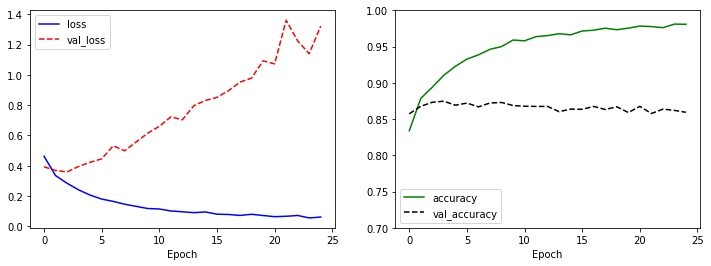

[1.433182954788208, 0.8518000245094299]

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

model.evaluate(test_X,test_Y,verbose=0)

In [ ]:
# 모델 생성(컨볼루션 레이어 - 풀링 레이어, 드롭아웃 레이어 추가)
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(28,28,1),kernel_size=(3,3),filters=32),
    tf.keras.layers.MaxPool2D(strides=(2,2)), # 풀링 레이어
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=64),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=128),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128,activation='relu'),
    tf.keras.layers.Dropout(rate=0.3), # 드롭아웃 레이어
    tf.keras.layers.Dense(units=10,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(),
             loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 3, 3, 128)         73856     
_________________________________________________________________
flatten_3 (Flatten)          (None, 1152)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)              

In [ ]:
# 모델 학습
history = model.fit(train_X,train_Y,epochs=25,validation_split=0.25)

Epoch 1/25
1407/1407 [==============================] - 5s 4ms/step - loss: 0.7213 - accuracy: 0.7403 - val_loss: 0.3780 - val_accuracy: 0.8593
Epoch 2/25
1407/1407 [==============================] - 5s 3ms/step - loss: 0.3625 - accuracy: 0.8687 - val_loss: 0.3342 - val_accuracy: 0.8776
Epoch 3/25
1407/1407 [==============================] - 5s 3ms/step - loss: 0.3138 - accuracy: 0.8854 - val_loss: 0.3218 - val_accuracy: 0.8818
Epoch 4/25
1407/1407 [==============================] - 5s 3ms/step - loss: 0.2824 - accuracy: 0.8932 - val_loss: 0.2988 - val_accuracy: 0.8929
Epoch 5/25
1407/1407 [==============================] - 5s 3ms/step - loss: 0.2590 - accuracy: 0.9035 - val_loss: 0.3301 - val_accuracy: 0.8827
Epoch 6/25
1407/1407 [==============================] - 5s 4ms/step - loss: 0.2457 - accuracy: 0.9088 - val_loss: 0.3140 - val_accuracy: 0.8919
Epoch 7/25
1407/1407 [==============================] - 5s 3ms/step - loss: 0.2243 - accuracy: 0.9195 - val_loss: 0.2918 - val_accuracy:

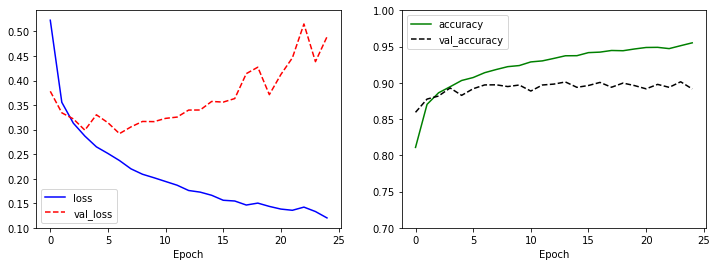

[0.4776439070701599, 0.8924000263214111]

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

model.evaluate(test_X,test_Y,verbose=0)

### 4.2 퍼포먼스 높이기

In [ ]:
# 더 많은 레이어 쌓기
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(28,28,1),kernel_size=(3,3),filters=32,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=64,padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=128,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=256,padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512,activation='relu'),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Dense(units=256,activation='relu'),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Dense(units=10,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(),
             loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 256)       295168    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 256)         0

In [ ]:
# 모델 학습
history = model.fit(train_X,train_Y,epochs=25,validation_split=0.25)

Epoch 1/25
1407/1407 [==============================] - 17s 10ms/step - loss: 0.8245 - accuracy: 0.7005 - val_loss: 0.3203 - val_accuracy: 0.8823
Epoch 2/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.3779 - accuracy: 0.8649 - val_loss: 0.2751 - val_accuracy: 0.9003
Epoch 3/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.3253 - accuracy: 0.8860 - val_loss: 0.2548 - val_accuracy: 0.9068
Epoch 4/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.3040 - accuracy: 0.8923 - val_loss: 0.2319 - val_accuracy: 0.9131
Epoch 5/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.2821 - accuracy: 0.8991 - val_loss: 0.2275 - val_accuracy: 0.9166
Epoch 6/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.2750 - accuracy: 0.9016 - val_loss: 0.2203 - val_accuracy: 0.9173
Epoch 7/25
1407/1407 [==============================] - 14s 10ms/step - loss: 0.2607 - accuracy: 0.9069 - val_loss: 0.2322 -

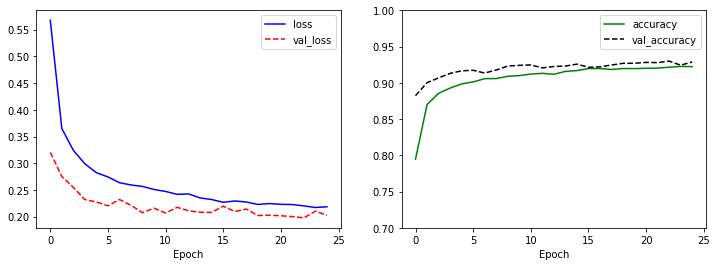

[0.21432769298553467, 0.9247000217437744]

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

model.evaluate(test_X,test_Y,verbose=0)

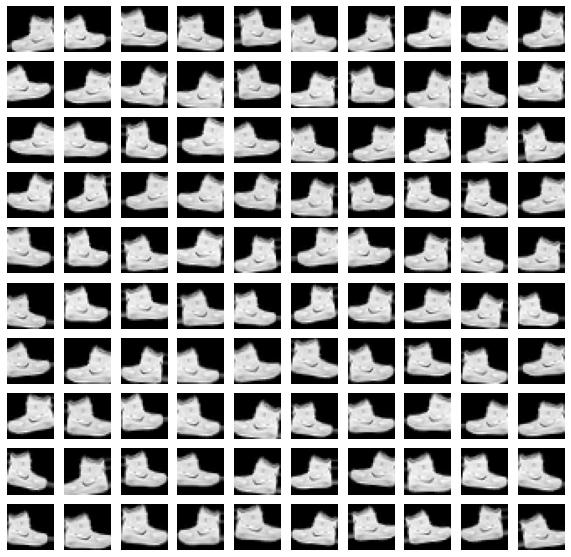

In [ ]:
# 이미지 보강학습
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

image_generator = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.10,
    shear_range=0.5,
    width_shift_range=0.10,
    height_shift_range=0.10,
    horizontal_flip=True,
    vertical_flip=False)

augment_size=100

x_augmented = image_generator.flow(np.tile(train_X[0].reshape(28*28),100).reshape(-1,28,28,1),
                                   np.zeros(augment_size),batch_size=augment_size,shuffle=False).next()[0]

# 새롭게 생성된 이미지 표시
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for c in range(100):
  plt.subplot(10,10,c+1)
  plt.axis('off')
  plt.imshow(x_augmented[c].reshape(28,28),cmap='gray')
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

image_generator = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.10,
    shear_range=0.5,
    width_shift_range=0.10,
    height_shift_range=0.10,
    horizontal_flip=True,
    vertical_flip=False)

augment_size=30000

randidx = np.random.randint(train_X.shape[0],size=augment_size)
x_augmented = train_X[randidx].copy()
y_augmented = train_Y[randidx].copy()
x_augmented = image_generator.flow(x_augmented, np.zeros(augment_size),batch_size=augment_size,shuffle=False).next()[0]

# 원래 데이터인 train_X에 이미지 보강된 x_augmented를 추가합니다.
train_X = np.concatenate((train_X,x_augmented))
train_Y = np.concatenate((train_Y,y_augmented))

print(train_X.shape)

(90000, 28, 28, 1)


In [ ]:
# 이미지 보강 모델 작성
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(28,28,1),kernel_size=(3,3),filters=32,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=64,padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=128,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=256,padding='valid',activation='relu'),
    tf.keras.layers.MaxPool2D(strides=(2,2)),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512,activation='relu'),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Dense(units=256,activation='relu'),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Dense(units=10,activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(),
             loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 14, 14, 128)       73856     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 12, 12, 256)       295168    
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 6, 6, 256)        

In [ ]:
# 모델 학습
history = model.fit(train_X,train_Y,epochs=25,validation_split=0.25)

Epoch 1/25
2110/2110 [==============================] - 20s 9ms/step - loss: 0.8156 - accuracy: 0.6991 - val_loss: 0.5886 - val_accuracy: 0.7766
Epoch 2/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.4007 - accuracy: 0.8534 - val_loss: 0.5033 - val_accuracy: 0.8102
Epoch 3/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.3521 - accuracy: 0.8726 - val_loss: 0.4509 - val_accuracy: 0.8260
Epoch 4/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.3144 - accuracy: 0.8843 - val_loss: 0.4611 - val_accuracy: 0.8225
Epoch 5/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.3133 - accuracy: 0.8876 - val_loss: 0.4310 - val_accuracy: 0.8359
Epoch 6/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.2929 - accuracy: 0.8941 - val_loss: 0.4082 - val_accuracy: 0.8484
Epoch 7/25
2110/2110 [==============================] - 19s 9ms/step - loss: 0.2819 - accuracy: 0.8970 - val_loss: 0.3998 - val_ac

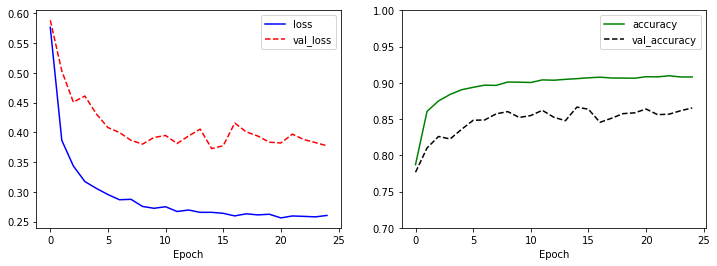

[0.21960046887397766, 0.923799991607666]

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

model.evaluate(test_X,test_Y,verbose=0)

# Chapter5 순환 신경망(RNN)

#### 5.1.1 SimpleRNN 레이어

In [ ]:
# SimpleRNN 레이어 생성코드
rnn1 = tf.keras.layers.SimpleRNN(units=1,avtivation='tanh',return_sequences=True)

In [ ]:
X = []
Y = []
for i in range(6):
    # [0,1,2,3] [1,2,3,4] 같은 정수의 시퀀스를 만듭니다.
    lst = list(range(i,i+4))
    
    # 위에서 구한 시퀀스의 숫자들을 각각 10으로 나눈 다음 저장합니다.
    # SimpleRNN에 각 타임스텝에 하나씩 숫자가 들어가기 때문에 여기서도 하나씩 분리해서 배열에 저장합니다.
    X.append(list(map(lambda c: [c/10],lst)))
    
    # 정답에 해당하는 4,5 등의 정수 역시 앞에서처럼 10으로 나눠서 저장합니다.
    Y.append((i+4)/10)
    
X = np.array(X)
Y = np.array(Y)
for i in range(len(X)):
    print(X[i],Y[i])

[[0. ]
 [0.1]
 [0.2]
 [0.3]] 0.4
[[0.1]
 [0.2]
 [0.3]
 [0.4]] 0.5
[[0.2]
 [0.3]
 [0.4]
 [0.5]] 0.6
[[0.3]
 [0.4]
 [0.5]
 [0.6]] 0.7
[[0.4]
 [0.5]
 [0.6]
 [0.7]] 0.8
[[0.5]
 [0.6]
 [0.7]
 [0.8]] 0.9


In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.SimpleRNN(units=10,return_sequences=False,input_shape=[4,1]#타임스텝),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam',loss='mse')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn (SimpleRNN)       (None, 10)                120       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 131
Trainable params: 131
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(X,Y,epochs=100,verbose=0)
print(model.predict(X))

[[0.4415094 ]
 [0.53623146]
 [0.62383217]
 [0.7030924 ]
 [0.7736275 ]
 [0.8357249 ]]


In [ ]:
print(model.predict(np.array([[[0.6],[0.7],[0.8],[0.9]]])))
print(model.predict(np.array([[[-0.1],[0.0],[0.1],[0.2]]])))

[[0.8901232]]
[[0.34173957]]


#### 5.1.2 LSTM 레이어

In [ ]:
import numpy as np
X = []
Y = []
for i in range(3000):
    # 0~1 범위의 랜덤한 숫자 100개를 만듭니다.
    lst = np.random.rand(100)
    
    # 마킹할 숫자 2개의 인덱스를 뽑습니다.
    idx = np.random.choice(100,2,replace=False)
    
    # 마킹 인덱스가 저장된 원-핫 인코딩 벡터를 만듭니다.
    zeros=np.zeros(100)
    zeros[idx] = 1
    
    #마킹 인덱스와 랜덤한 숫자를 합쳐서 X에 저장합니다.
    X.append(np.array(list(zip(zeros,lst))))
    # 마킹 인덱스가 1인 값만 서로 곱해서 Y에 저장합니다.
    Y.append(np.prod(lst[idx]))
    
print(X[0],Y[0])

[[0.         0.68608209]
 [0.         0.22531433]
 [0.         0.66869587]
 [0.         0.22064757]
 [0.         0.43926111]
 [0.         0.40462388]
 [0.         0.61871586]
 [0.         0.43038586]
 [0.         0.14888411]
 [0.         0.97440645]
 [0.         0.80751395]
 [0.         0.97159679]
 [0.         0.1258744 ]
 [0.         0.25654488]
 [0.         0.46220301]
 [0.         0.5804462 ]
 [0.         0.1220198 ]
 [0.         0.6899827 ]
 [0.         0.04326895]
 [0.         0.36118609]
 [0.         0.89769857]
 [0.         0.16076527]
 [0.         0.16988149]
 [0.         0.51746072]
 [0.         0.24772078]
 [0.         0.62096647]
 [0.         0.27571447]
 [0.         0.88309762]
 [0.         0.72233896]
 [1.         0.48412151]
 [0.         0.24325907]
 [0.         0.55644538]
 [0.         0.11797448]
 [0.         0.34868438]
 [0.         0.70416103]
 [0.         0.4279202 ]
 [0.         0.52092549]
 [0.         0.40518275]
 [0.         0.8024772 ]
 [0.         0.26168583]


In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.SimpleRNN(units=30,return_sequences=True,input_shape=[100,2]),
    tf.keras.layers.SimpleRNN(units=30),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam',loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn (SimpleRNN)       (None, 100, 30)           990       
_________________________________________________________________
simple_rnn_1 (SimpleRNN)     (None, 30)                1830      
_________________________________________________________________
dense (Dense)                (None, 1)                 31        
Total params: 2,851
Trainable params: 2,851
Non-trainable params: 0
_________________________________________________________________


In [ ]:
X = np.array(X)
Y = np.array(Y)
# 2560개의 데이터만 학습시킵니다. 검증데이터는 20%로 지정합니다.
history=model.fit(X[:2560],Y[:2560],epochs=100,validation_split=0.2)

Epoch 1/100
64/64 [==============================] - 11s 146ms/step - loss: 0.1192 - val_loss: 0.0522
Epoch 2/100
64/64 [==============================] - 9s 134ms/step - loss: 0.0464 - val_loss: 0.0504
Epoch 3/100
64/64 [==============================] - 8s 124ms/step - loss: 0.0460 - val_loss: 0.0509
Epoch 4/100
64/64 [==============================] - 8s 130ms/step - loss: 0.0486 - val_loss: 0.0500
Epoch 5/100
64/64 [==============================] - 8s 125ms/step - loss: 0.0465 - val_loss: 0.0499
Epoch 6/100
64/64 [==============================] - 9s 136ms/step - loss: 0.0472 - val_loss: 0.0496
Epoch 7/100
64/64 [==============================] - 9s 136ms/step - loss: 0.0445 - val_loss: 0.0499
Epoch 8/100
64/64 [==============================] - 8s 133ms/step - loss: 0.0441 - val_loss: 0.0500
Epoch 9/100
64/64 [==============================] - 8s 127ms/step - loss: 0.0446 - val_loss: 0.0495
Epoch 10/100
64/64 [==============================] - 8s 127ms/step - loss: 0.0455 - val_l

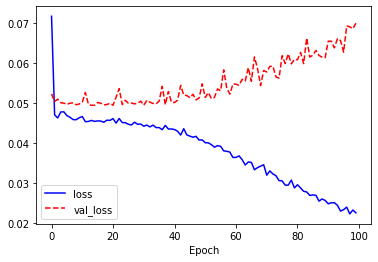

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
model.evaluate(X[2560:],Y[2560:])
prediction=model.predict(X[2560:2560+5])
# 5개의 테스트 데이터에 대한 예측을 표시합니다.
for i in range(5):
    print(Y[2560+i],'\t',prediction[i][0], '\tdiff:',abs(prediction[i][0] - Y[2560+i]))
    
prediction = model.predict(X[2560:])
fail = 0
for i in range(len(prediction)):
    # 오차가 0.04이상이면 오답입니다.
    if abs(prediction[i][0] - Y[2560+i]) > 0.04:
        fail += 1
        
print('crossectness:', (440 - fail) / 440*100,'%')

14/14 [==============================] - 1s 33ms/step - loss: 0.0661
0.24398069593164604 	 0.23938227 	diff: 0.00459842893335502
0.025970049794032384 	 0.18675745 	diff: 0.1607873955413558
0.2044443743513313 	 0.23636746 	diff: 0.03192308971422045
0.14082107263141308 	 0.09431917 	diff: 0.04650190042787228
0.18764220272648438 	 0.016240634 	diff: 0.17140156870234116
crossectness: 12.954545454545455 %


In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(units=30,return_sequences=True,input_shape=[100,2]),
    tf.keras.layers.LSTM(units=30),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam',loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100, 30)           3960      
_________________________________________________________________
lstm_1 (LSTM)                (None, 30)                7320      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 31        
Total params: 11,311
Trainable params: 11,311
Non-trainable params: 0
_________________________________________________________________


In [ ]:
X = np.array(X)
Y = np.array(Y)
# 2560개의 데이터만 학습시킵니다. 검증데이터는 20%로 지정합니다.
history=model.fit(X[:2560],Y[:2560],epochs=100,validation_split=0.2)

Epoch 1/100
64/64 [==============================] - 4s 23ms/step - loss: 0.0516 - val_loss: 0.0492
Epoch 2/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0469 - val_loss: 0.0496
Epoch 3/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0456 - val_loss: 0.0497
Epoch 4/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0450 - val_loss: 0.0508
Epoch 5/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0454 - val_loss: 0.0491
Epoch 6/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0444 - val_loss: 0.0493
Epoch 7/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0445 - val_loss: 0.0491
Epoch 8/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0483 - val_loss: 0.0501
Epoch 9/100
64/64 [==============================] - 1s 11ms/step - loss: 0.0438 - val_loss: 0.0498
Epoch 10/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0423 - val_loss: 0.0490

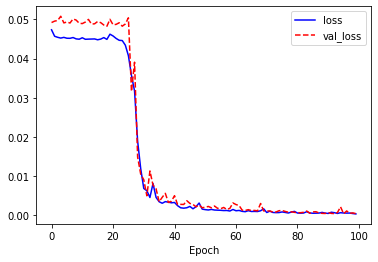

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
model.evaluate(X[2560:],Y[2560:])
prediction=model.predict(X[2560:2560+5])
# 5개의 테스트 데이터에 대한 예측을 표시합니다.
for i in range(5):
    print(Y[2560+i],'\t',prediction[i][0], '\tdiff:',abs(prediction[i][0] - Y[2560+i]))
    
prediction = model.predict(X[2560:])
cnt = 0
for i in range(len(prediction)):
    if abs(prediction[i][0] - Y[2560+i]) > 0.04:
        cnt += 1
        
print('crossectness:', (440 - cnt) / 440*100,'%')

14/14 [==============================] - 1s 9ms/step - loss: 4.6364e-04
0.24398069593164604 	 0.26023644 	diff: 0.016255746157434775
0.025970049794032384 	 0.037282906 	diff: 0.01131285667865057
0.2044443743513313 	 0.21423566 	diff: 0.009791289062670155
0.14082107263141308 	 0.14646289 	diff: 0.005641814894145392
0.18764220272648438 	 0.17817938 	diff: 0.009462819448591314
crossectness: 92.95454545454545 %


#### 5.1.3 GRU 레이어

In [ ]:
# GRU 레이어 모델 생성
model = tf.keras.Sequential([
    tf.keras.layers.GRU(units=30,return_sequences=True, input_shape=[100,2]),
    tf.keras.layers.GRU(units=30),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam',loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 100, 30)           3060      
_________________________________________________________________
gru_3 (GRU)                  (None, 30)                5580      
_________________________________________________________________
dense (Dense)                (None, 1)                 31        
Total params: 8,671
Trainable params: 8,671
Non-trainable params: 0
_________________________________________________________________


In [ ]:
X = np.array(X)
Y = np.array(Y)
# 2560개의 데이터만 학습시킵니다. 검증데이터는 20%로 지정합니다.
history=model.fit(X[:2560],Y[:2560],epochs=100,validation_split=0.2)

Epoch 1/100
64/64 [==============================] - 8s 29ms/step - loss: 0.0512 - val_loss: 0.0428
Epoch 2/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0468 - val_loss: 0.0422
Epoch 3/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0476 - val_loss: 0.0422
Epoch 4/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0476 - val_loss: 0.0436
Epoch 5/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0492 - val_loss: 0.0420
Epoch 6/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0490 - val_loss: 0.0421
Epoch 7/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0447 - val_loss: 0.0424
Epoch 8/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0472 - val_loss: 0.0427
Epoch 9/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0468 - val_loss: 0.0419
Epoch 10/100
64/64 [==============================] - 1s 12ms/step - loss: 0.0456 - val_loss: 0.0424

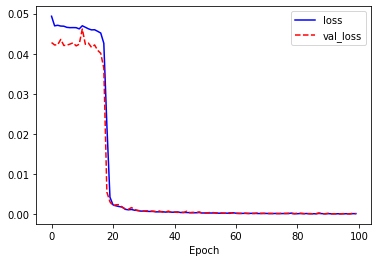

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
model.evaluate(X[2560:],Y[2560:])
prediction=model.predict(X[2560:2560+5])
# 5개의 테스트 데이터에 대한 예측을 표시합니다.
for i in range(5):
    print(Y[2560+i],'\t',prediction[i][0], '\tdiff:',abs(prediction[i][0] - Y[2560+i]))
    
prediction = model.predict(X[2560:])
cnt = 0
for i in range(len(prediction)):
    if abs(prediction[i][0] - Y[2560+i]) > 0.04:
        cnt += 1
        
print('crossectness:', (440 - cnt) / 440*100,'%')

14/14 [==============================] - 1s 6ms/step - loss: 1.3237e-04
0.001681114651209688 	 0.026110906 	diff: 0.024429791502707625
0.11885533988674073 	 0.12700446 	diff: 0.008149119613572078
0.05654404289264802 	 0.06314972 	diff: 0.006605677537726125
0.07824886853466935 	 0.08556682 	diff: 0.007317950179472496
0.29614310662995524 	 0.3004305 	diff: 0.00428739983786397
crossectness: 99.31818181818181 %


#### 5.1.4 임베딩 레이어 - 자연어 처리

### 5.2 긍정, 부정 감성 분석

In [ ]:
# Naver Sentiment Movie Corpus v1.0 다운로드
path_to_train_file = tf.keras.utils.get_file('train.txt', 'https://raw.githubusercontent.com/e9t/nsmc/master/ratings_train.txt')
path_to_test_file = tf.keras.utils.get_file('test.txt', 'https://raw.githubusercontent.com/e9t/nsmc/master/ratings_test.txt')

4898816/4893335 [==============================] - 1s 0us/step


In [ ]:
# 데이터를 메모리에 불러옵니다. 인코딩 형식으로 UTF-8을 지정해야 합니다.
train_text = open(path_to_train_file,'rb').read().decode(encoding='utf-8')
test_text = open(path_to_test_file,'rb').read().decode(encoding='utf-8')

# 텍스트가 총 몇 자인지 확인합니다.
print('Length of test: {} characters'.format(len(train_text)))
print('Length of test: {} characters'.format(len(test_text)))
print()

# 처음 300자를 확인해봅니다.
print(train_text[:300])

Length of test: 6937271 characters
Length of test: 2318260 characters

id	document	label
9976970	아 더빙.. 진짜 짜증나네요 목소리	0
3819312	흠...포스터보고 초딩영화줄....오버연기조차 가볍지 않구나	1
10265843	너무재밓었다그래서보는것을추천한다	0
9045019	교도소 이야기구먼 ..솔직히 재미는 없다..평점 조정	0
6483659	사이몬페그의 익살스런 연기가 돋보였던 영화!스파이더맨에서 늙어보이기만 했던 커스틴 던스트가 너무나도 이뻐보였다	1
5403919	막 걸음마 뗀 3세부터 초등학교 1학년생인 8살용영화.ㅋㅋㅋ...별반개도 아까움.	0
7797314	원작의


In [ ]:
train_Y = np.array([[int(row.split('\t')[2])] for row in train_text.split('\n')[1:] if row.count('\t') > 0])
test_Y = np.array([[int(row.split('\t')[2])] for row in test_text.split('\n')[1:] if row.count('\t') > 0])
print(train_Y.shape, test_Y.shape)
print(train_Y[:5])

(150000, 1) (50000, 1)
[[0]
 [1]
 [0]
 [0]
 [1]]


In [ ]:
# train 데이터의 입력(X)에 대한 정제(Cleaning)
import re
# From https://github.com/yoonkim/CNN_sentence/blob/master/process_data.py
def clean_str(string):    
    string = re.sub(r"[^가-힣A-Za-z0-9(),!?\'\`]", " ", string)
    string = re.sub(r"\'s", " \'s", string)
    string = re.sub(r"\'ve", " \'ve", string)
    string = re.sub(r"n\'t", " n\'t", string)
    string = re.sub(r"\'re", " \'re", string)
    string = re.sub(r"\'d", " \'d", string)
    string = re.sub(r"\'ll", " \'ll", string)
    string = re.sub(r",", " , ", string)
    string = re.sub(r"!", " ! ", string)
    string = re.sub(r"\(", " \( ", string)
    string = re.sub(r"\)", " \) ", string)
    string = re.sub(r"\?", " \? ", string)
    string = re.sub(r"\s{2,}", " ", string)
    string = re.sub(r"\'{2,}", "\'", string)
    string = re.sub(r"\'", "", string)

    return string.lower()

train_text_X = [row.split('\t')[1] for row in train_text.split('\n')[1:] if row.count('\t') > 0]
train_text_X = [clean_str(sentence) for sentence in train_text_X]
# 문장을 띄어쓰기 단위로 단어 분리
sentences = [sentence.split(' ') for sentence in train_text_X]
for i in range(5):
    print(sentence[i])

['아', '더빙', '진짜', '짜증나네요', '목소리']
['흠', '포스터보고', '초딩영화줄', '오버연기조차', '가볍지', '않구나']
['너무재밓었다그래서보는것을추천한다']
['교도소', '이야기구먼', '솔직히', '재미는', '없다', '평점', '조정']
['사이몬페그의', '익살스런', '연기가', '돋보였던', '영화', '!', '스파이더맨에서', '늙어보이기만', '했던', '커스틴', '던스트가', '너무나도', '이뻐보였다']


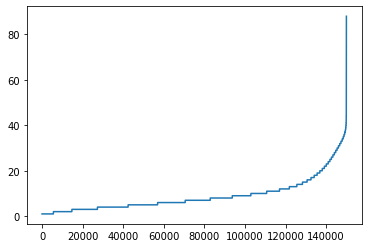

142587


In [ ]:
import matplotlib.pyplot as plt
sentence_len = [len(sentence) for sentence in sentences]
sentence_len.sort()
plt.plot(sentence_len)
plt.show()

print(sum([int(l<=25) for l in sentence_len]))

In [ ]:
sentences_new = []
for sentence in sentences:
    sentences_new.append([word[:5] for word in sentence][:25])
    
sentences= sentences_new
for i in range(5):
    print(sentences[i])

['아', '더빙', '진짜', '짜증나네요', '목소리']
['흠', '포스터보고', '초딩영화줄', '오버연기조', '가볍지', '않구나']
['너무재밓었']
['교도소', '이야기구먼', '솔직히', '재미는', '없다', '평점', '조정']
['사이몬페그', '익살스런', '연기가', '돋보였던', '영화', '!', '스파이더맨', '늙어보이기', '했던', '커스틴', '던스트가', '너무나도', '이뻐보였다']


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words=20000)
tokenizer.fit_on_texts(sentences)
train_X = tokenizer.texts_to_sequences(sentences)
train_X = pad_sequences(train_X, padding='post') # pre : 문장앞에 padding, post : 문장 뒤에 padding

print(train_X[:5])

[[   25   884     8  5795  1111     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0]
 [  588  5796  6697     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0]
 [    0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0]
 [   71   346    31    35 10468     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0]
 [  106  5338     4     2  2169   869   573     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0]]


In [ ]:
print(tokenizer.index_word[19999])
print(tokenizer.index_word[20000])
temp = tokenizer.texts_to_sequences(['#$#$#','경우는','잊혀질','연기가'])
print(temp)
temp = pad_sequences(temp,padding='post')
print(temp)

경우는
잊혀질
[[], [19999], [], [106]]
[[    0]
 [19999]
 [    0]
 [  106]]


In [ ]:
# 감성분석을 위한 모델 정의
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(20000,300,input_length=25),
    tf.keras.layers.LSTM(units=50),
    tf.keras.layers.Dense(2, activation ='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 25, 300)           6000000   
_________________________________________________________________
lstm_1 (LSTM)                (None, 50)                70200     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 102       
Total params: 6,070,302
Trainable params: 6,070,302
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(train_X,train_Y,epochs=5,batch_size=128,validation_split=0.2)

Epoch 1/5
938/938 [==============================] - 34s 35ms/step - loss: 0.5008 - accuracy: 0.7288 - val_loss: 0.3843 - val_accuracy: 0.8220
Epoch 2/5
938/938 [==============================] - 32s 34ms/step - loss: 0.3187 - accuracy: 0.8506 - val_loss: 0.3836 - val_accuracy: 0.8218
Epoch 3/5
938/938 [==============================] - 32s 34ms/step - loss: 0.2666 - accuracy: 0.8720 - val_loss: 0.4168 - val_accuracy: 0.8179
Epoch 4/5
938/938 [==============================] - 32s 35ms/step - loss: 0.2212 - accuracy: 0.8909 - val_loss: 0.4862 - val_accuracy: 0.8103
Epoch 5/5
938/938 [==============================] - 32s 35ms/step - loss: 0.1902 - accuracy: 0.9046 - val_loss: 0.4859 - val_accuracy: 0.8083


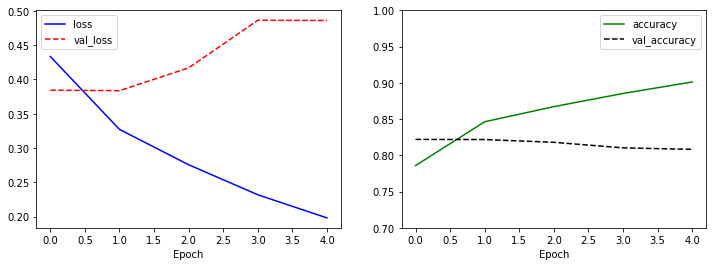

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(history.history['loss'],'b-',label='loss')
plt.plot(history.history['val_loss'],'r--',label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],'g-',label='accuracy')
plt.plot(history.history['val_accuracy'],'k--',label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.7,1)
plt.legend()

plt.show()

In [ ]:
test_text_X = [row.split('\t')[1] for row in test_text.split('\n')[1:] if row.count('\t') > 0]
test_text_X = [clean_str(sentence) for sentence in test_text_X]

sentences = [sentence.split(' ') for sentence in test_text_X]
sentences_new=[]
for sentence in sentences:
    sentences_new.append([word[:5] for word in sentence][:25])
    
sentences= sentences_new

test_X = tokenizer.texts_to_sequences(sentences)
test_X = pad_sequences(test_X, padding='post')

model.evaluate(test_X,test_Y,verbose=0)

[0.49466294050216675, 0.8024399876594543]

In [ ]:
test_sentence = '재미있을 줄 알았는데 완전 실망했다. 너무 졸리고 돈이 아까웠다.'
test_sentence = test_sentence.split(' ')
test_sentences = []
now_sentence = []
for word in test_sentence:
    now_sentence.append(word)
    test_sentences.append(now_sentence[:])
    
test_X_1 = tokenizer.texts_to_sequences(test_sentences)
test_X_1 = pad_sequences(test_X_1,padding='post',maxlen=25)
prediction = model.predict(test_X_1)
for idx,sentence in enumerate(test_sentences):
    print(sentence)
    print(prediction[idx])

['재미있을']
[0.48304293 0.5169571 ]
['재미있을', '줄']
[0.48374894 0.5162511 ]
['재미있을', '줄', '알았는데']
[0.5305812  0.46941882]
['재미있을', '줄', '알았는데', '완전']
[0.588875   0.41112497]
['재미있을', '줄', '알았는데', '완전', '실망했다.']
[0.588875   0.41112497]
['재미있을', '줄', '알았는데', '완전', '실망했다.', '너무']
[0.72519577 0.27480423]
['재미있을', '줄', '알았는데', '완전', '실망했다.', '너무', '졸리고']
[0.977217   0.02278292]
['재미있을', '줄', '알았는데', '완전', '실망했다.', '너무', '졸리고', '돈이']
[0.99268204 0.00731791]
['재미있을', '줄', '알았는데', '완전', '실망했다.', '너무', '졸리고', '돈이', '아까웠다.']
[0.99268204 0.00731791]


### 5.4 자연어 생성

#### 5.4.1 단어 단위 생성

In [ ]:
# 조선왕조실록 데이터 파일 다운로드
path_to_file = tf.keras.utils.get_file('input.txt', 'http://bit.ly/2Mc3SOV')

In [ ]:
# 데이터를 메모리에 불러옵니다. 인코딩 형식으로 UTF-8을 지정해야 합니다.
train_text = open(path_to_file, 'rb').read().decode(encoding='utf-8')

# 텍스트가 총 몇자인지 확인합니다.
print('Length of text: {} characters'.format(len(train_text)))
print()

# 처음 100자를 확인해봅니다.
print(train_text[:100])

Length of text: 26265493 characters

﻿태조 이성계 선대의 가계. 목조 이안사가 전주에서 삼척·의주를 거쳐 알동에 정착하다 
태조 강헌 지인 계운 성문 신무 대왕(太祖康獻至仁啓運聖文神武大王)의 성은 이씨(李氏)요, 휘


In [ ]:
# train 데이터의 입력(X)에 대한 정제(Cleaning)
import re
# From https://github.com/yoonkim/CNN_sentence/blob/master/process_data.py
def clean_str(string):    
    string = re.sub(r"[^가-힣A-Za-z0-9(),!?\'\`]", " ", string)
    string = re.sub(r"\'s", " \'s", string)
    string = re.sub(r"\'ve", " \'ve", string)
    string = re.sub(r"n\'t", " n\'t", string)
    string = re.sub(r"\'re", " \'re", string)
    string = re.sub(r"\'d", " \'d", string)
    string = re.sub(r"\'ll", " \'ll", string)
    string = re.sub(r",", " , ", string)
    string = re.sub(r"!", " ! ", string)
    string = re.sub(r"\(", " \( ", string)
    string = re.sub(r"\)", " \) ", string)
    string = re.sub(r"\?", " \? ", string)
    string = re.sub(r"\s{2,}", " ", string)
    string = re.sub(r"\'{2,}", "\'", string)
    string = re.sub(r"\'", "", string)

    return string.lower()

train_text = train_text.split('\n')
train_text = [clean_str(sentence)for sentence in train_text]
train_text_X=[]
for sentence in train_text:
    train_text_X.extend(sentence.split(' '))
    train_text_X.append('\n')
    
train_text_X = [word for word in train_text_X if word != '']

print(train_text_X[:20])

['태조', '이성계', '선대의', '가계', '목조', '이안사가', '전주에서', '삼척', '의주를', '거쳐', '알동에', '정착하다', '\n', '태조', '강헌', '지인', '계운', '성문', '신무', '대왕']


In [ ]:
# 단어의 토큰화
import numpy as np
# 단어의 set을 만듭니다.
vocab = sorted(set(train_text_X))
vocab.append('UNK')
print('{} unique words'.format(len(vocab)))

# vocab list를 숫자로 매핑하고, 반대도 실행합니다.
word2idx = {u:i for i,u in enumerate(vocab)}
idx2word = np.array(vocab)

text_as_int = np.array([word2idx[c] for c in train_text_X])

# word2idx 의 일부를 알아보기 쉽게 출력
print('{')
for word,_ in zip(word2idx,range(10)):
    print(' {:4s}:{:3d},'.format(repr(word), word2idx[word]))
print(' ...\n}')

print('index of UNK: {}'.format(word2idx['UNK']))

332515 unique words
{
 '\n':  0,
 '!' :  1,
 ',' :  2,
 '000명으로':  3,
 '001':  4,
 '002':  5,
 '003':  6,
 '004':  7,
 '005':  8,
 '006':  9,
 ...
}
index of UNK: 332514


In [ ]:
print(train_text_X[:20])
print(text_as_int[:20])

['태조', '이성계', '선대의', '가계', '목조', '이안사가', '전주에서', '삼척', '의주를', '거쳐', '알동에', '정착하다', '\n', '태조', '강헌', '지인', '계운', '성문', '신무', '대왕']
[299181 229520 161349  17366 110944 230178 250960 154993 225348  28960
 190192 256005      0 299181  25557 273428  36069 163902 180371  84330]


In [ ]:
seq_length = 25
examples_per_epoch = len(text_as_int) // seq_length
sentence_dataset = tf.data.Dataset.from_tensor_slices(text_as_int) # Dataset 생성코드

sentence_dataset = sentence_dataset.batch(seq_length+1,drop_remainder=True) # 
for item in sentence_dataset.take(1):
    print(item.numpy())
    print(idx2word[item.numpy()])

[299181 229520 161349  17366 110944 230178 250960 154993 225348  28960
 190192 256005      0 299181  25557 273428  36069 163902 180371  84330
  17277  17278 224068 164455 230134  17277]
['태조' '이성계' '선대의' '가계' '목조' '이안사가' '전주에서' '삼척' '의주를' '거쳐' '알동에' '정착하다'
 '\n' '태조' '강헌' '지인' '계운' '성문' '신무' '대왕' '\\(' '\\)' '의' '성은' '이씨' '\\(']


In [ ]:
def split_input_target(chunk):
    return [chunk[:-1], chunk[-1]]

train_dataset = sentence_dataset.map(split_input_target)
for x,y in train_dataset.take(1):
    print(idx2word[x.numpy()])
    print(x.numpy())
    print(idx2word[y.numpy()])
    print(y.numpy())

['태조' '이성계' '선대의' '가계' '목조' '이안사가' '전주에서' '삼척' '의주를' '거쳐' '알동에' '정착하다'
 '\n' '태조' '강헌' '지인' '계운' '성문' '신무' '대왕' '\\(' '\\)' '의' '성은' '이씨']
[299181 229520 161349  17366 110944 230178 250960 154993 225348  28960
 190192 256005      0 299181  25557 273428  36069 163902 180371  84330
  17277  17278 224068 164455 230134]
\(
17277


In [ ]:
# 데이터셋 shuffle, batch 설정
BATCH_SIZE = 512
steps_per_epoch = examples_per_epoch // BATCH_SIZE
BUFFER_SIZE = 10000

train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)

In [ ]:
total_words = len(vocab)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(total_words, 100, input_length=seq_length),
    tf.keras.layers.LSTM(units=100,return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(units=100),
    tf.keras.layers.Dense(total_words,activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 25, 100)           33251500  
_________________________________________________________________
lstm (LSTM)                  (None, 25, 100)           80400     
_________________________________________________________________
dropout (Dropout)            (None, 25, 100)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense (Dense)                (None, 332515)            33584015  
Total params: 66,996,315
Trainable params: 66,996,315
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 단어 단위 생성 모델 학습
from tensorflow.keras.preprocessing.sequence import pad_sequences

def testmodel(epoch, logs):
    if epoch % 5 != 0 and epoch != 49:
        return
    test_sentence = train_text[0]

    next_words = 100
    for _ in range(next_words):
        test_text_X = test_sentence.split(' ')[-seq_length:]
        test_text_X = np.array([word2idx[c] if c in word2idx else word2idx['UNK'] for c in test_text_X])
        test_text_X = pad_sequences([test_text_X], maxlen=seq_length, padding='pre', value=word2idx['UNK'])

        output_idx = model.predict_classes(test_text_X)
        test_sentence += ' ' + idx2word[output_idx[0]]
    
    print()
    print(test_sentence)
    print()

testmodelcb = tf.keras.callbacks.LambdaCallback(on_epoch_end=testmodel)

history = model.fit(train_dataset.repeat(), epochs=50, steps_per_epoch=steps_per_epoch, callbacks=[testmodelcb], verbose=2)

Epoch 1/50

 태조 이성계 선대의 가계 목조 이안사가 전주에서 삼척 의주를 거쳐 알동에 정착하다  , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , ,

533/533 - 255s - loss: 9.3702 - accuracy: 0.0723
Epoch 2/50
533/533 - 249s - loss: 8.3646 - accuracy: 0.0741
Epoch 3/50
533/533 - 249s - loss: 8.0768 - accuracy: 0.0816
Epoch 4/50
533/533 - 249s - loss: 7.8147 - accuracy: 0.0911
Epoch 5/50
533/533 - 249s - loss: 7.5722 - accuracy: 0.1025
Epoch 6/50

 태조 이성계 선대의 가계 목조 이안사가 전주에서 삼척 의주를 거쳐 알동에 정착하다  , , , , , , 그 , , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그 것은 , 그

533/533 - 250s - loss: 7.3301 - accuracy: 0.1165
Epoch 7/50
533/533 - 249s - loss: 7.0574 - accuracy: 0.1305
Epoch 8/50
533/533 - 249s - loss: 6.7848 - accurac

In [ ]:
# 임의의 문장을 사용한 생성 결과 확인
from tensorflow.keras.preprocessing.sequence import pad_sequences
test_sentence = '동헌에 나가 공무를 본 후 활 십오 순을 쏘았다'

next_words = 100
for _ in range(next_words):
    test_text_X = test_sentence.split(' ')[-seq_length:]
    test_text_X = np.array([word2idx[c] if c in word2idx else word2idx['UNK'] for c in test_text_X])
    test_text_X = pad_sequences([test_text_X], maxlen=seq_length, padding='pre', value=word2idx['UNK'])
    
    output_idx = model.predict_classes(test_text_X)
    test_sentence += ' ' + idx2word[output_idx[0]]

print(test_sentence)

동헌에 나가 공무를 본 후 활 십오 순을 쏘았다 그곳의 사로잡힌 대리하는 호군직 2개는 놓기도 토의 으로써 차임 되고 , 저들은 일시에 굳게 것으로서 주고 , 더욱 높은 바가 많아서 정위 라 같다 하는데 하였습니다 빈자 는 부의 에 도와서 알아야 하여 주소서 
 하니 , 형조 에서 교지 를 하사하고 충청도 도절제사 에서 다시 와서 와서 내려 쓸 하고 , 만일 잘 가는 것이 없었다 상수의 대한 한 한 뒤에 모두 능히 서로 알지 것은 감히 모두 모두 모두 사람을 죄를 죄를 사람을 죄를 온 한 사람을 삼가서 어질고 그믐날에 한다는 것이니 , 청컨대 이러한 정성을 알아서 난 를 정하여 급히 원하는 곳에 두고 특별히 징계하여 인도해 특별히


#### 5.4.2 자소 단위 생성

In [ ]:
!pip install jamotools

  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491059 sha256=d63d5c6d7d9399041496bcf65d4a965111f1a8fd6e1a74b4cbc7030dd9719f21
  Stored in directory: c:\users\pjwpy\appdata\local\pip\cache\wheels\8e\70\28\3d6ccd6e315f65f245da085482a2e1c7d14b90b30f239e2cf4
Successfully built future


In [ ]:
import jamotools as jt
train_text = open(path_to_file,'rb').read().decode(encoding='utf-8')
s = train_text[:100]
print(s)

# 한글 텍스트를 자모 단위로 분리합니다. 한자 등에는 영향이 없습니다.
s_split = jt.split_syllables(s)
print(s_split)

﻿태조 이성계 선대의 가계. 목조 이안사가 전주에서 삼척·의주를 거쳐 알동에 정착하다 
태조 강헌 지인 계운 성문 신무 대왕(太祖康獻至仁啓運聖文神武大王)의 성은 이씨(李氏)요, 휘
﻿ㅌㅐㅈㅗ ㅇㅣㅅㅓㅇㄱㅖ ㅅㅓㄴㄷㅐㅇㅢ ㄱㅏㄱㅖ. ㅁㅗㄱㅈㅗ ㅇㅣㅇㅏㄴㅅㅏㄱㅏ ㅈㅓㄴㅈㅜㅇㅔㅅㅓ ㅅㅏㅁㅊㅓㄱ·ㅇㅢㅈㅜㄹㅡㄹ ㄱㅓㅊㅕ ㅇㅏㄹㄷㅗㅇㅇㅔ ㅈㅓㅇㅊㅏㄱㅎㅏㄷㅏ 
ㅌㅐㅈㅗ ㄱㅏㅇㅎㅓㄴ ㅈㅣㅇㅣㄴ ㄱㅖㅇㅜㄴ ㅅㅓㅇㅁㅜㄴ ㅅㅣㄴㅁㅜ ㄷㅐㅇㅘㅇ(太祖康獻至仁啓運聖文神武大王)ㅇㅢ ㅅㅓㅇㅇㅡㄴ ㅇㅣㅆㅣ(李氏)ㅇㅛ, ㅎㅟ


In [ ]:
s2 = jt.join_jamos(s_split)
print(s2)
print(s == s2)

﻿태조 이성계 선대의 가계. 목조 이안사가 전주에서 삼척·의주를 거쳐 알동에 정착하다 
태조 강헌 지인 계운 성문 신무 대왕(太祖康獻至仁啓運聖文神武大王)의 성은 이씨(李氏)요, 휘
True


In [ ]:
import numpy as np
# # 텍스트를 자모 단위로 나눕니다. 데이터가 크기 때문에 약간 시간이 걸립니다.
train_text_X = jt.split_syllables(train_text)
vocab = sorted(set(train_text_X))
vocab.append('UNK')
print ('{} unique characters'.format(len(vocab)))

# vocab list를 숫자로 맵핑하고, 반대도 실행합니다.
char2idx = {u:i for i, u in enumerate(vocab)}
idx2char = np.array(vocab)

text_as_int = np.array([char2idx[c] for c in train_text_X])

# word2idx 의 일부를 알아보기 쉽게 print 해봅니다.
print('{')
for char,_ in zip(char2idx, range(10)):
    print('  {:4s}: {:3d},'.format(repr(char), char2idx[char]))
print('  ...\n}')

print('index of UNK: {}'.format(char2idx['UNK']))

6198 unique characters
{
  '\n':   0,
  ' ' :   1,
  '!' :   2,
  '"' :   3,
  "'" :   4,
  '(' :   5,
  ')' :   6,
  '+' :   7,
  ',' :   8,
  '-' :   9,
  ...
}
index of UNK: 6197


In [ ]:
print(train_text_X[:20])
print(text_as_int[:20])

﻿ㅌㅐㅈㅗ ㅇㅣㅅㅓㅇㄱㅖ ㅅㅓㄴㄷㅐㅇ
[6158   83   87   79   94    1   78  106   76   90   78   56   93    1
   76   90   59   62   87   78]


In [ ]:
seq_length = 80
examples_per_epoch = len(text_as_int) // seq_length
char_dataset = tf.data.Dataset.from_tensor_slices(text_as_int)

char_dataset = char_dataset.batch(seq_length+1, drop_remainder=True)
for item in char_dataset.take(1):
    print(idx2char[item.numpy()])
    print(item.numpy())
    
def split_input_target(chunk):
    return [chunk[:-1], chunk[-1]]

train_dataset = char_dataset.map(split_input_target)
for x,y in train_dataset.take(1):
    print(idx2char[x.numpy()])
    print(x.numpy())
    print(idx2char[y.numpy()])
    print(y.numpy())
    
BATCH_SIZE = 256
steps_per_epoch = examples_per_epoch // BATCH_SIZE
BUFFER_SIZE = 10000

train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)

['\ufeff' 'ㅌ' 'ㅐ' 'ㅈ' 'ㅗ' ' ' 'ㅇ' 'ㅣ' 'ㅅ' 'ㅓ' 'ㅇ' 'ㄱ' 'ㅖ' ' ' 'ㅅ' 'ㅓ' 'ㄴ'
 'ㄷ' 'ㅐ' 'ㅇ' 'ㅢ' ' ' 'ㄱ' 'ㅏ' 'ㄱ' 'ㅖ' '.' ' ' 'ㅁ' 'ㅗ' 'ㄱ' 'ㅈ' 'ㅗ' ' ' 'ㅇ'
 'ㅣ' 'ㅇ' 'ㅏ' 'ㄴ' 'ㅅ' 'ㅏ' 'ㄱ' 'ㅏ' ' ' 'ㅈ' 'ㅓ' 'ㄴ' 'ㅈ' 'ㅜ' 'ㅇ' 'ㅔ' 'ㅅ' 'ㅓ'
 ' ' 'ㅅ' 'ㅏ' 'ㅁ' 'ㅊ' 'ㅓ' 'ㄱ' '·' 'ㅇ' 'ㅢ' 'ㅈ' 'ㅜ' 'ㄹ' 'ㅡ' 'ㄹ' ' ' 'ㄱ' 'ㅓ'
 'ㅊ' 'ㅕ' ' ' 'ㅇ' 'ㅏ' 'ㄹ' 'ㄷ' 'ㅗ' 'ㅇ' 'ㅇ']
[6158   83   87   79   94    1   78  106   76   90   78   56   93    1
   76   90   59   62   87   78  105    1   56   86   56   93   10    1
   72   94   56   79   94    1   78  106   78   86   59   76   86   56
   86    1   79   90   59   79   99   78   91   76   90    1   76   86
   72   81   90   56   36   78  105   79   99   64  104   64    1   56
   90   81   92    1   78   86   64   62   94   78   78]
['\ufeff' 'ㅌ' 'ㅐ' 'ㅈ' 'ㅗ' ' ' 'ㅇ' 'ㅣ' 'ㅅ' 'ㅓ' 'ㅇ' 'ㄱ' 'ㅖ' ' ' 'ㅅ' 'ㅓ' 'ㄴ'
 'ㄷ' 'ㅐ' 'ㅇ' 'ㅢ' ' ' 'ㄱ' 'ㅏ' 'ㄱ' 'ㅖ' '.' ' ' 'ㅁ' 'ㅗ' 'ㄱ' 'ㅈ' 'ㅗ' ' ' 'ㅇ'
 'ㅣ' 'ㅇ' 'ㅏ' 'ㄴ' 'ㅅ' 'ㅏ' 'ㄱ' 'ㅏ' ' ' 'ㅈ' 'ㅓ' 'ㄴ' 'ㅈ' 'ㅜ' 'ㅇ' 'ㅔ' 'ㅅ' 'ㅓ'
 ' ' 'ㅅ' 'ㅏ' 'ㅁ' 'ㅊ' 'ㅓ' 'ㄱ' '·' 

In [ ]:
# 자소 단위 생성 모델 정의
total_chars = len(vocab)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(total_chars, 100, input_length = seq_length),
    tf.keras.layers.LSTM(units=400),
    tf.keras.layers.Dense(total_chars, activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 80, 100)           619800    
_________________________________________________________________
lstm (LSTM)                  (None, 400)               801600    
_________________________________________________________________
dense (Dense)                (None, 6198)              2485398   
Total params: 3,906,798
Trainable params: 3,906,798
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 자소 단위 생성 모델 학습
from tensorflow.keras.preprocessing.sequence import pad_sequences

def testmodel(epoch, logs):
    if epoch % 5 != 0 and epoch != 99:
        return
    
    test_sentence = train_text[:48]
    test_sentence = jamotools.split_syllables(test_sentence)

    next_chars = 300
    for _ in range(next_chars):
        test_text_X = test_sentence[-seq_length:]
        test_text_X = np.array([char2idx[c] if c in char2idx else char2idx['UNK'] for c in test_text_X])
        test_text_X = pad_sequences([test_text_X], maxlen=seq_length, padding='pre', value=char2idx['UNK'])

        output_idx = model.predict_classes(test_text_X)
        test_sentence += idx2char[output_idx[0]]
    
    print()
    print(jamotools.join_jamos(test_sentence))
    print()

testmodelcb = tf.keras.callbacks.LambdaCallback(on_epoch_end=testmodel)

history = model.fit(train_dataset.repeat(), epochs=100, steps_per_epoch=steps_per_epoch, callbacks=[testmodelcb], verbose=2)

Epoch 1/100

﻿태조 이성계 선대의 가계. 목조 이안사가 전주에서 삼척·의주를 거쳐 알동에 정착하다 이를 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 것을 

2364/2364 - 270s - loss: 2.5904 - accuracy: 0.3065
Epoch 2/100
2364/2364 - 266s - loss: 1.9905 - accuracy: 0.4264
Epoch 3/100
2364/2364 - 266s - loss: 1.8423 - accuracy: 0.4608
Epoch 4/100
2364/2364 - 266s - loss: 1.7423 - accuracy: 0.4823
Epoch 5/100
2364/2364 - 264s - loss: 1.6784 - accuracy: 0.4948
Epoch 6/100

﻿태조 이성계 선대의 가계. 목조 이안사가 전주에서 삼척·의주를 거쳐 알동에 정착하다 일이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다. 임금이 있었다.

2364/2364 - 265s - loss: 1.6241 - accuracy: 0.5070
Epoch 7/100
2364/2364 - 264s - loss: 1.5739 - accuracy: 0.5184
Epoch 8/100
2364/2364 - 264s - loss: 1.5297 - accuracy: 0.5286
Epoch 9/100
2364/2364 - 266s - loss: 1.4916 - accuracy: 0.5372
Epoch 10/100
2364/2364 - 268s - loss: 1.4595 - accuracy: 0.5

In [ ]:
# 임의의 문장을 사용한 생성 결과 확인
from tensorflow.keras.preprocessing.sequence import pad_sequences
test_sentence = '동헌에 나가 공무를 본 후 활 십오 순을 쏘았다'
test_sentence = jamotools.split_syllables(test_sentence)

next_chars = 300
for _ in range(next_chars):
    test_text_X = test_sentence[-seq_length:]
    test_text_X = np.array([char2idx[c] if c in char2idx else char2idx['UNK'] for c in test_text_X])
    test_text_X = pad_sequences([test_text_X], maxlen=seq_length, padding='pre', value=char2idx['UNK'])
    
    output_idx = model.predict_classes(test_text_X)
    test_sentence += idx2char[output_idx[0]]
    

print(jamotools.join_jamos(test_sentence))

동헌에 나가 공무를 본 후 활 십오 순을 쏘았다. 임금이 말하기를,
"이보다 큰 공상은 그 집에 돌아오다
정사를 보았다. 임금이 말하기를,
"이방성을 아뢰다
함길도 감사가 이미 나라를 행하였다.상왕이 그 사람을 금하다
임금이 말하기를,
"이보다 큰 공상은 그 집에 돌아온다. 【모든 것을 보내어 여러 관원은 농산ㄱ


# Chapter6 사전 훈련된 모델 다루기

### 6.1 텐서플로 허브

In [ ]:
!pip install tensorflow_hub

In [ ]:
!pip install pydot

In [ ]:
!pip install graphviz

In [ ]:
!pip install pydotplus

  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=19e758b2215ba6b5897ef62fa8f1b75367153d59920828892384b6dd456dcb8a
  Stored in directory: c:\users\pjwpy\appdata\local\pip\cache\wheels\fe\cd\78\a7e873cc049759194f8271f780640cf96b35e5a48bef0e2f36
Successfully built pydotplus


In [ ]:
import tensorflow_hub as hub

mobile_net_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/2"
model = tf.keras.Sequential([
    hub.KerasLayer(handle=mobile_net_url, input_shape=(224, 224, 3), trainable=False)
])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              3540265   
Total params: 3,540,265
Trainable params: 0
Non-trainable params: 3,540,265
_________________________________________________________________


14540800/14536120 [==============================] - 0s 0us/step


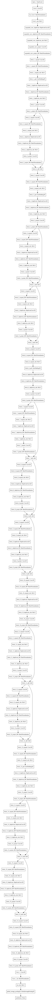

In [ ]:
from tensorflow.keras.applications import MobileNetV2

mobilev2 = MobileNetV2()
tf.keras.utils.plot_model(mobilev2)

In [ ]:
import os
import pathlib
content_data_url = '/content/sample_data'
data_root_orig = tf.keras.utils.get_file('imagenetV2', 'https://s3-us-west-2.amazonaws.com/imagenetv2public/imagenetv2-top-images.tar.gz', cache_subdir='datasets',cache_dir=content_data_url, extract=True)
data_root = pathlib.Path(content_data_url + '/datasets/imagenetv2-top-images-format-val')
print(data_root)

1245929472/1245927936 [==============================] - 34s 0us/step
/content/sample_data/datasets/imagenetv2-top-images-format-val


In [ ]:
for idx, item in enumerate(data_root.iterdir()):
    print(item)
    if idx == 9:
        break

/content/sample_data/datasets/imagenetv2-top-images-format-val/117
/content/sample_data/datasets/imagenetv2-top-images-format-val/938
/content/sample_data/datasets/imagenetv2-top-images-format-val/302
/content/sample_data/datasets/imagenetv2-top-images-format-val/636
/content/sample_data/datasets/imagenetv2-top-images-format-val/576
/content/sample_data/datasets/imagenetv2-top-images-format-val/225
/content/sample_data/datasets/imagenetv2-top-images-format-val/5
/content/sample_data/datasets/imagenetv2-top-images-format-val/704
/content/sample_data/datasets/imagenetv2-top-images-format-val/987
/content/sample_data/datasets/imagenetv2-top-images-format-val/479


In [ ]:
label_file = tf.keras.utils.get_file('label', 'https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
label_text = None
with open(label_file, 'r') as f:
    label_text = f.read().split('\n')[:-1]
print(len(label_text))
print(label_text[:10])
print(label_text[-10:])

# 폴더 이름이 wordnet의 단어로 수정되었기 때문에, nltk 패키지에서 wordnet을 다운받습니다.
import nltk
nltk.download('wordnet')
from nltk.corpus import wordnet

# wordnet과 인터넷에 올라온 label 텍스트는 조금씩 다르기 때문에 차이를 없애기 위해서 아래의 전처리 작업을 진행합니다.
label_text = [c.lower().replace('-','').replace('_','').replace(' ','') for c in label_text]

16384/10484 [==============================================] - 0s 0us/step
1001
['background', 'tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen']
['buckeye', 'coral fungus', 'agaric', 'gyromitra', 'stinkhorn', 'earthstar', 'hen-of-the-woods', 'bolete', 'ear', 'toilet tissue']
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


image_count: 10000


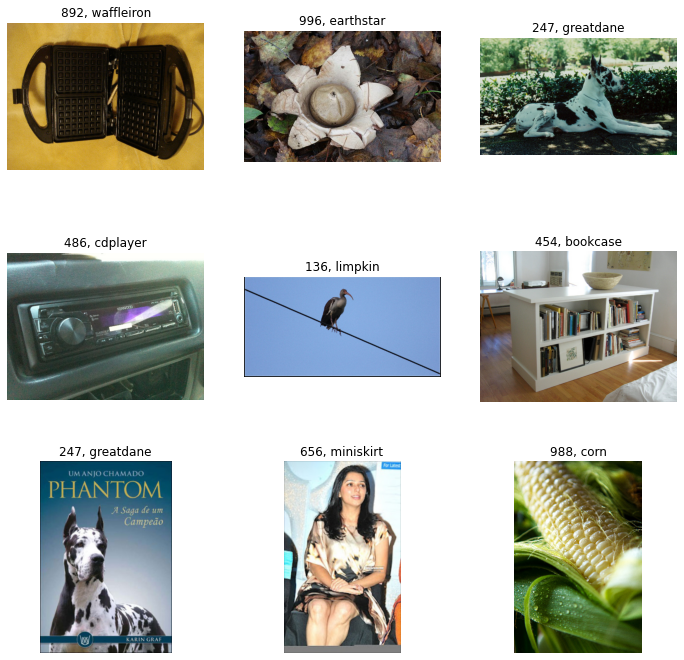

In [ ]:
import PIL.Image as Image
import matplotlib.pyplot as plt
import random

all_image_paths = list(data_root.glob('*/*'))
all_image_paths = [str(path) for path in all_image_paths]
# 이미지를 랜덤하게 섞습니다.
random.shuffle(all_image_paths)

image_count = len(all_image_paths)
print('image_count:', image_count)

plt.figure(figsize=(12,12))
for c in range(9):
    image_path = random.choice(all_image_paths)
    plt.subplot(3,3,c+1)
    plt.imshow(plt.imread(image_path))
    idx = int(image_path.split('/')[-2]) + 1
    plt.title(str(idx) + ', ' + label_text[idx])
    # word = wordnet.synset_from_pos_and_offset('n',int(image_path.split('/')[-2][1:]))
    # word = word.name().split('.')[0].replace('-','').replace('_','').replace(' ','')
    # plt.title(str(label_text.index(word)) + ', ' + word)
    plt.title(str(idx) + ', ' + label_text[idx])
    plt.axis('off')
plt.show()

In [ ]:
import cv2
import numpy as np
np.seterr(divide='ignore', invalid='ignore')

top_1 = 0
top_5 = 0
for image_path in all_image_paths:
  img = cv2.imread(image_path)
  img = cv2.resize(img,dsize=(224,224))
  img = img / 255.0
  img = np.expand_dims(img,axis=0)
  top_5_predict = model.predict(img)[0].argsort()[::-1][:5]
  idx = int(image_path.split('/')[-2]) + 1
  if idx in top_5_predict:
    top_5 += 1
    if top_5_predict[0] == idx:
      top_1 += 1

print('top-5 correctness:',top_5 / len(all_image_paths) * 100, '%')
print('top-1 correctness:',top_1 / len(all_image_paths) * 100, '%')

top-5 correctness: 83.52000000000001 %
top-1 correctness: 59.06 %


In [ ]:
a = np.array([99,32,5,64])
arg = np.argsort(a)
print(arg)
print(np.sort(a))
print(a[arg])

[2 1 3 0]
[ 5 32 64 99]
[ 5 32 64 99]


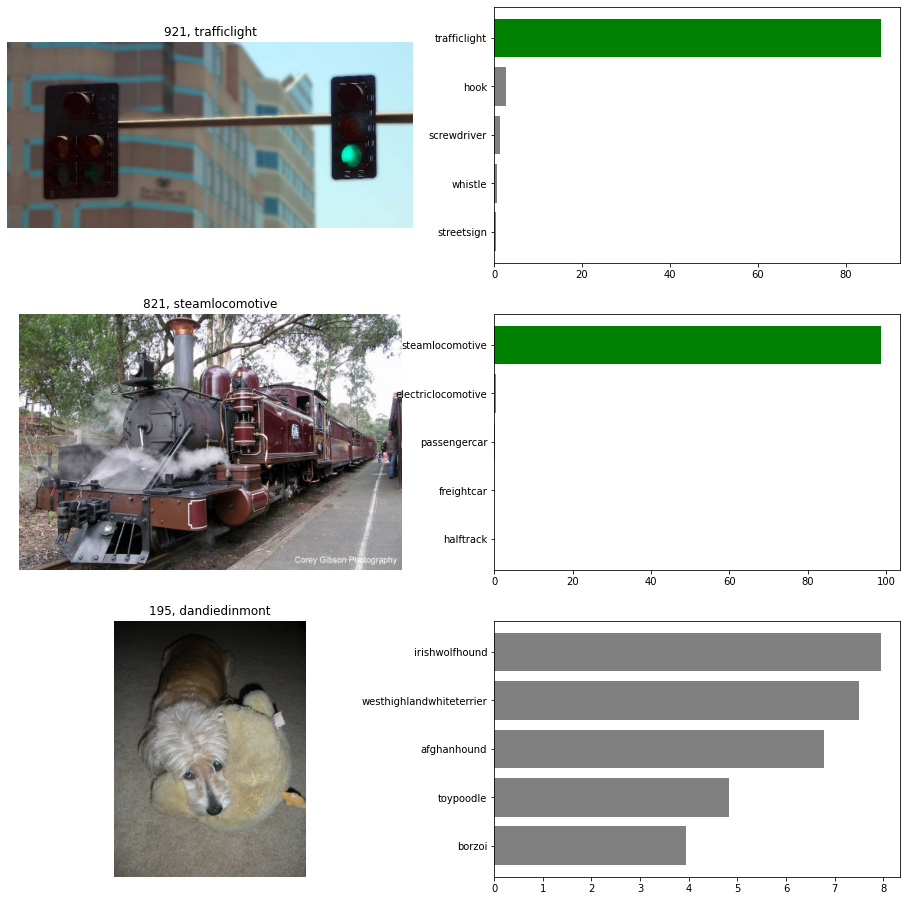

In [ ]:
plt.figure(figsize=(16,16))

def softmax(x):
  e_x = np.exp(x - np.max(x))
  return e_x / e_x.sum(axis=0)

for c in range(3):
  image_path = random.choice(all_image_paths)

  # 이미지 표시
  plt.subplot(3,2,c*2+1)
  plt.imshow(plt.imread(image_path))
  idx = int(image_path.split('/')[-2]) + 1
  plt.title(str(idx) + ', ' + label_text[idx])
  plt.axis('off')

  # 예측값 표시
  plt.subplot(3,2,c*2+2)
  img = cv2.imread(image_path)
  img = cv2.resize(img,dsize=(224,224))
  img = img / 255.0
  img = np.expand_dims(img, axis=0)

  # MobileNet을 이용한 예측
  logits = model.predict(img)[0]
  prediction = softmax(logits)

  # 가장 높은 확률의 예측값 5개를 뽑음
  top_5_predict = prediction.argsort()[::-1][:5]
  labels = [label_text[index] for index in top_5_predict]
  color = ['gray'] * 5
  if idx in top_5_predict:
    color[top_5_predict.tolist().index(idx)] = 'green'
  color = color[::-1]
  plt.barh(range(5),prediction[top_5_predict][::-1]*100,color=color)
  plt.yticks(range(5), labels[::-1])

### 6.2 전이 학습

#### 6.2.1 모델의 일부를 재학습시키기

In [ ]:
!pip install kaggle

In [ ]:
# Stanford Dog Dataset을 Kaggle에서 불러오기

tf.keras.utils.get_file('/content/labels.csv', 'http://bit.ly/2GDxsYS')
tf.keras.utils.get_file('/content/sample_submission.csv', 'http://bit.ly/2GGnMNd')
tf.keras.utils.get_file('/content/train.zip', 'http://bit.ly/31nIyel')
tf.keras.utils.get_file('/content/test.zip', 'http://bit.ly/2GHEsnO')

import os
os.environ['KAGGLE_USERNAME'] = 'user_id' # 독자의 캐글 ID
os.environ['KAGGLE_KEY'] = 'user_api_token' # 독자의 캐글 API Token
# !kaggle competitions download -c dog-breed-identification

362848256/362841195 [==============================] - 13s 0us/step


In [ ]:
!unzip train.zip
# !unzip labels.csv.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/841463629c4833816

In [ ]:
import pandas as pd
label_text = pd.read_csv('labels.csv')
print(label_text.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_text.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
label_text['breed'].nunique()

120

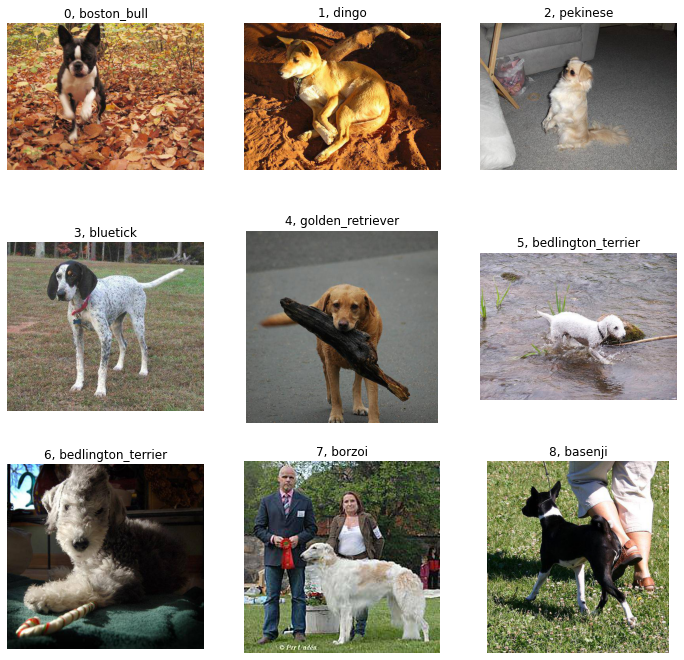

In [ ]:
import PIL.Image as Image
import matplotlib.pyplot as plt

plt.figure(figsize=(12,12))
for c in range(9):
  image_id = label_text.loc[c,'id']
  plt.subplot(3,3,c+1)
  plt.imshow(plt.imread('/content/train/'+ image_id + '.jpg'))
  plt.title(str(c) + ', ' + label_text.loc[c,'breed'])
  plt.axis('off')
plt.show()

In [ ]:
from tensorflow.keras.applications import MobileNetV2
mobilev2 = MobileNetV2()

14540800/14536120 [==============================] - 0s 0us/step


In [ ]:
# 메모리에 불러온 네크워크의 가중치를 초기화
for layer in mobilev2.layers[:-1]:
  layer.trainable = True

for layer in mobilev2.layers[:-1]:
  if 'kernel' in layer.__dict__:
    kernel_shape = np.array(layer.get_weights()).shape
    # weight를 평균이 0, 표준편차가 1인 random 변수로 초기화
    layer.set_weights(tf.random.normal(kernel_shape,0,1))

In [ ]:
# import cv2

# train_X = []
# for i in range(len(label_text)):
#     img = cv2.imread('/content/train/' + label_text['id'][i] + '.jpg')
#     img = cv2.resize(img, dsize=(224, 224))
#     img = img / 255.0
#     train_X.append(img)
# train_X = np.array(train_X)
# print(train_X.shape)
# print(train_X.size * train_X.itemsize, ' bytes')

# 예제 8.16은 고용량 RAM 모드를 지원하지 않는 무료 버전의 경우 OOM(Out Of Memory) 문제를 일으키기 때문에 주석처리합니다.
# 대신에 ImageDataGenerator로 학습을 시킵니다.

# ImageDataGenerator가 처리할 수 있는 하위 디렉토리 구조로 데이터 복사
import os
import shutil
import random

os.mkdir('/content/train_sub')

for i in range(len(label_text)):
    if os.path.exists('/content/train_sub/' + label_text.loc[i]['breed']) == False:
        os.mkdir('/content/train_sub/' + label_text.loc[i]['breed'])
    shutil.copy('/content/train/' + label_text.loc[i]['id'] + '.jpg', '/content/train_sub/' + label_text.loc[i]['breed'])

# 8.25 ImageDataGenerator를 이용한 train/validation 데이터 분리, Image Augmentation
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_resnet_v2 import preprocess_input

image_size = 224 # 이미지 사이즈가 299에서 224로 바뀌었습니다.
batch_size = 32

train_datagen = ImageDataGenerator(rescale=1./255., horizontal_flip=True, shear_range=0.2, zoom_range=0.2, width_shift_range=0.2, height_shift_range=0.2, validation_split=0.25)
valid_datagen = ImageDataGenerator(rescale=1./255., validation_split=0.25)

train_generator = train_datagen.flow_from_directory(directory="/content/train_sub/", subset="training", batch_size=batch_size, seed=42, shuffle=True, class_mode="categorical", target_size=(image_size, image_size))
valid_generator = valid_datagen.flow_from_directory(directory="/content/train_sub/", subset="validation", batch_size=1, seed=42, shuffle=True, class_mode="categorical", target_size=(image_size, image_size))

Found 7718 images belonging to 120 classes.
Found 2504 images belonging to 120 classes.


In [ ]:
# train 라벨 데이터를 메모리에 로드
unique_Y = label_text['breed'].unique().tolist()
train_Y = [unique_Y.index(breed) for breed in label_text['breed']]
train_Y = np.array(train_Y)

print(train_Y[:10])
print(train_Y[-10:])

[0 1 2 3 4 5 5 6 7 8]
[34 87 91 63 48  6 93 63 77 92]


In [ ]:
# Dogs Dataset 학습을 위한 모델 정의
x = mobilev2.layers[-2].output
predictions = tf.keras.layers.Dense(120, activation='softmax')(x)
model = tf.keras.Model(inputs=mobilev2.input, outputs=predictions)

model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy']) # 라벨이 원-핫 인코딩을 사용하기 때문에 sparse가 아닌 categorical_crossentropy를 사용합니다.
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

In [ ]:
steps_per_epoch = int(7718/32) # generator를 사용하기 때문에 1epoch 당 학습할 step수를 정합니다. batch_size인 32로 train_data의 크기를 나눠주면 됩니다.
history = model.fit_generator(train_generator, validation_data=valid_generator, epochs=10, steps_per_epoch=steps_per_epoch) # model.fit_generator()를 사용합니다.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
241/241 [==============================] - 138s 535ms/step - loss: 4.9294 - accuracy: 0.0104 - val_loss: 8.5884 - val_accuracy: 0.0088
Epoch 2/10
241/241 [==============================] - 127s 525ms/step - loss: 4.8834 - accuracy: 0.0079 - val_loss: 7.7777 - val_accuracy: 0.0080
Epoch 3/10
241/241 [==============================] - 128s 531ms/step - loss: 4.8620 - accuracy: 0.0094 - val_loss: 7.7356 - val_accuracy: 0.0080
Epoch 4/10
241/241 [==============================] - 128s 532ms/step - loss: 4.8567 - accuracy: 0.0065 - val_loss: 7.6624 - val_accuracy: 0.0084
Epoch 5/10
241/241 [==============================] - 127s 526ms/step - loss: 4.8338 - accuracy: 0.0080 - val_loss: 8.4917 - val_accuracy: 0.0088
Epoch 6/10
241/241 [==============================] - 128s 531ms/step - loss: 4.8328 - accuracy: 0.0103 - val_loss: 7.3080 - val_accuracy: 0.0056
Epoch 7/10
241/241 [==============================] - 128s 531ms/step - loss: 4.8311 - accuracy: 0.0105 - val_loss: 7.4457 -

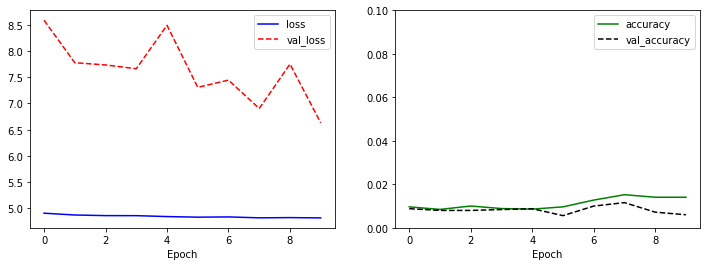

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b-', label='loss')
plt.plot(history.history['val_loss'], 'r--', label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'g-', label='accuracy')
plt.plot(history.history['val_accuracy'], 'k--', label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0, 0.1)
plt.legend()

plt.show()

In [ ]:
# Dogs Dataset 학습을 위한 Transfer Learning 모델 정의
from tensorflow.keras.applications import MobileNetV2
mobilev2 = MobileNetV2()

x = mobilev2.layers[-2].output
predictions = tf.keras.layers.Dense(120, activation='softmax')(x)
model = tf.keras.Model(inputs=mobilev2.input, outputs=predictions)

# 뒤에서 20개까지의 레이어는 훈련 가능, 나머지는 가중치 고정
for layer in model.layers[:-20]:
    layer.trainable = False
for layer in model.layers[-20:]:
    layer.trainable = True

model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy']) # 라벨이 원-핫 인코딩을 사용하기 때문에 sparse가 아닌 categorical_crossentropy를 사용합니다.
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_4[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
____________________________________________________________________________________________

In [ ]:
steps_per_epoch = int(7718/32) # generator를 사용하기 때문에 1epoch 당 학습할 step수를 정합니다. batch_size인 32로 train_data의 크기를 나눠주면 됩니다.
history = model.fit_generator(train_generator, validation_data=valid_generator, epochs=10, steps_per_epoch=steps_per_epoch) # model.fit_generator()를 사용합니다.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
241/241 [==============================] - 115s 469ms/step - loss: 3.9883 - accuracy: 0.1800 - val_loss: 1.5242 - val_accuracy: 0.5703
Epoch 2/10
241/241 [==============================] - 113s 470ms/step - loss: 1.6370 - accuracy: 0.6052 - val_loss: 1.1706 - val_accuracy: 0.6506
Epoch 3/10
241/241 [==============================] - 113s 469ms/step - loss: 1.2337 - accuracy: 0.6814 - val_loss: 1.0630 - val_accuracy: 0.6857
Epoch 4/10
241/241 [==============================] - 113s 468ms/step - loss: 1.0052 - accuracy: 0.7401 - val_loss: 1.0033 - val_accuracy: 0.6997
Epoch 5/10
241/241 [==============================] - 113s 468ms/step - loss: 0.9090 - accuracy: 0.7553 - val_loss: 0.9799 - val_accuracy: 0.7049
Epoch 6/10
241/241 [==============================] - 112s 467ms/step - loss: 0.8086 - accuracy: 0.7815 - val_loss: 0.9620 - val_accuracy: 0.7093
Epoch 7/10
241/241 [==============================] - 113s 468ms/step - loss: 0.7617 - accuracy: 0.8015 - val_loss: 0.9467 -

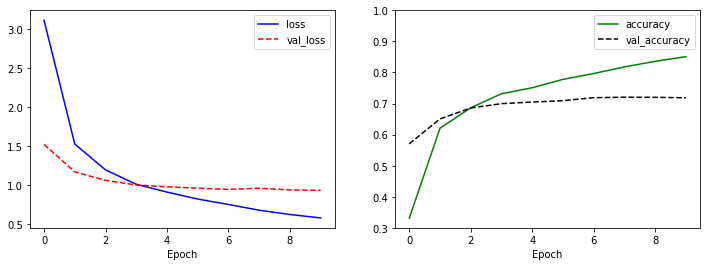

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b-', label='loss')
plt.plot(history.history['val_loss'], 'r--', label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'g-', label='accuracy')
plt.plot(history.history['val_accuracy'], 'k--', label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.3, 1)
plt.legend()

plt.show()

#### 6.2.2 특징 추출기

In [ ]:
import tensorflow_hub as hub

inception_url = 'https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4'
feature_model = tf.keras.Sequential([
    hub.KerasLayer(inception_url, output_shape=(2048,), trainable=False)
])
feature_model.build([None, 299, 299, 3])
feature_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 2048)              21802784  
Total params: 21,802,784
Trainable params: 0
Non-trainable params: 21,802,784
_________________________________________________________________


In [ ]:
import os
import shutil

os.mkdir('/content/train_sub')

for i in range(len(label_text)):
    if os.path.exists('/content/train_sub/' + label_text.loc[i]['breed']) == False:
        os.mkdir('/content/train_sub/' + label_text.loc[i]['breed'])
    shutil.copy('/content/train/' + label_text.loc[i]['id'] + '.jpg', '/content/train_sub/' + label_text.loc[i]['breed'])

In [ ]:
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_resnet_v2 import preprocess_input

image_size = 299
batch_size = 32

train_datagen = ImageDataGenerator(rescale=1./255., horizontal_flip=True, shear_range=0.2,zoom_range=0.2,width_shift_range=0.2,height_shift_range=0.2,validation_split=0.25)
valid_datagen = ImageDataGenerator(rescale=1./255.,validation_split=0.25)

train_generator = train_datagen.flow_from_directory(directory='/content/train_sub', subset='training', batch_size=batch_size, seed=42,shuffle=True,class_mode='categorical', target_size=(image_size, image_size))

valid_generator = valid_datagen.flow_from_directory(directory='/content/train_sub', subset='validation', batch_size=1, seed=42,shuffle=True,class_mode='categorical', target_size=(image_size, image_size))


Found 7718 images belonging to 120 classes.
Found 2504 images belonging to 120 classes.


In [ ]:
batch_step = (7718 * 3) // batch_size
train_features = []
train_Y = []
for idx in range(batch_step):
  if idx % 100 == 0:
    print(idx)
  x,y = train_generator.next()
  train_Y.extend(y)

  feature = feature_model.predict(x)
  train_features.extend(feature)

train_features = np.array(train_features)
train_Y = np.array(train_Y)
print(train_features.shape)
print(train_Y.shape)

0
100
200
300
400
500
600
700
(23084, 2048)
(23084, 120)


In [ ]:
valid_features = []
valid_Y = []
for idx in range(valid_generator.n):
  if idx % 100 == 0:
    print(idx)
  x,y = valid_generator.next()
  valid_Y.extend(y)

  feature = feature_model.predict(x)
  valid_features.extend(feature)

valid_features = np.array(valid_features)
valid_Y = np.array(valid_Y)
print(valid_features.shape)
print(valid_Y.shape)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
(2504, 2048)
(2504, 120)


In [ ]:
model = tf.keras.Sequential([
                             tf.keras.layers.Dense(256,activation='relu',input_shape=(2048,)),
                             tf.keras.layers.Dropout(0.5),
                             tf.keras.layers.Dense(120,activation='softmax')
])

model.compile(tf.optimizers.RMSprop(0.0001),loss='categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 120)               30840     
Total params: 555,384
Trainable params: 555,384
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(train_features, train_Y, validation_data=(valid_features, valid_Y), epochs=10, batch_size=32)

Epoch 1/10
722/722 [==============================] - 3s 4ms/step - loss: 3.7782 - accuracy: 0.2501 - val_loss: 0.8645 - val_accuracy: 0.8726
Epoch 2/10
722/722 [==============================] - 2s 3ms/step - loss: 1.0580 - accuracy: 0.7606 - val_loss: 0.4177 - val_accuracy: 0.8906
Epoch 3/10
722/722 [==============================] - 2s 3ms/step - loss: 0.6535 - accuracy: 0.8229 - val_loss: 0.3487 - val_accuracy: 0.8998
Epoch 4/10
722/722 [==============================] - 2s 3ms/step - loss: 0.5234 - accuracy: 0.8443 - val_loss: 0.3244 - val_accuracy: 0.8994
Epoch 5/10
722/722 [==============================] - 2s 3ms/step - loss: 0.4667 - accuracy: 0.8597 - val_loss: 0.3117 - val_accuracy: 0.9006
Epoch 6/10
722/722 [==============================] - 2s 3ms/step - loss: 0.4045 - accuracy: 0.8761 - val_loss: 0.3049 - val_accuracy: 0.9038
Epoch 7/10
722/722 [==============================] - 2s 3ms/step - loss: 0.3805 - accuracy: 0.8780 - val_loss: 0.3047 - val_accuracy: 0.9030
Epoch 

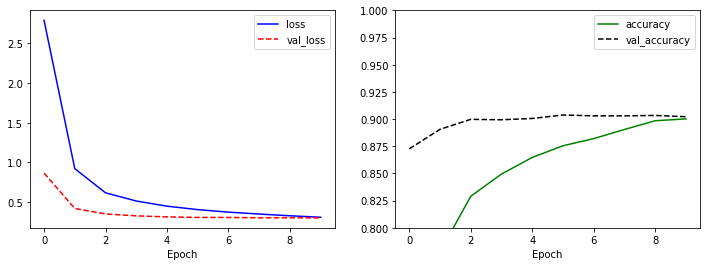

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b-', label='loss')
plt.plot(history.history['val_loss'], 'r--', label='val_loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'g-', label='accuracy')
plt.plot(history.history['val_accuracy'], 'k--', label='val_accuracy')
plt.xlabel('Epoch')
plt.ylim(0.8, 1)
plt.legend()

plt.show()

In [ ]:
unique_sorted_Y = sorted(unique_Y)
print(unique_sorted_Y)

['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale', 'american_staffordshire_terrier', 'appenzeller', 'australian_terrier', 'basenji', 'basset', 'beagle', 'bedlington_terrier', 'bernese_mountain_dog', 'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound', 'bluetick', 'border_collie', 'border_terrier', 'borzoi', 'boston_bull', 'bouvier_des_flandres', 'boxer', 'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff', 'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua', 'chow', 'clumber', 'cocker_spaniel', 'collie', 'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo', 'doberman', 'english_foxhound', 'english_setter', 'english_springer', 'entlebucher', 'eskimo_dog', 'flat-coated_retriever', 'french_bulldog', 'german_shepherd', 'german_short-haired_pointer', 'giant_schnauzer', 'golden_retriever', 'gordon_setter', 'great_dane', 'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael', 'ibizan_hound', 'irish_setter', 'irish_terrier', 'iris

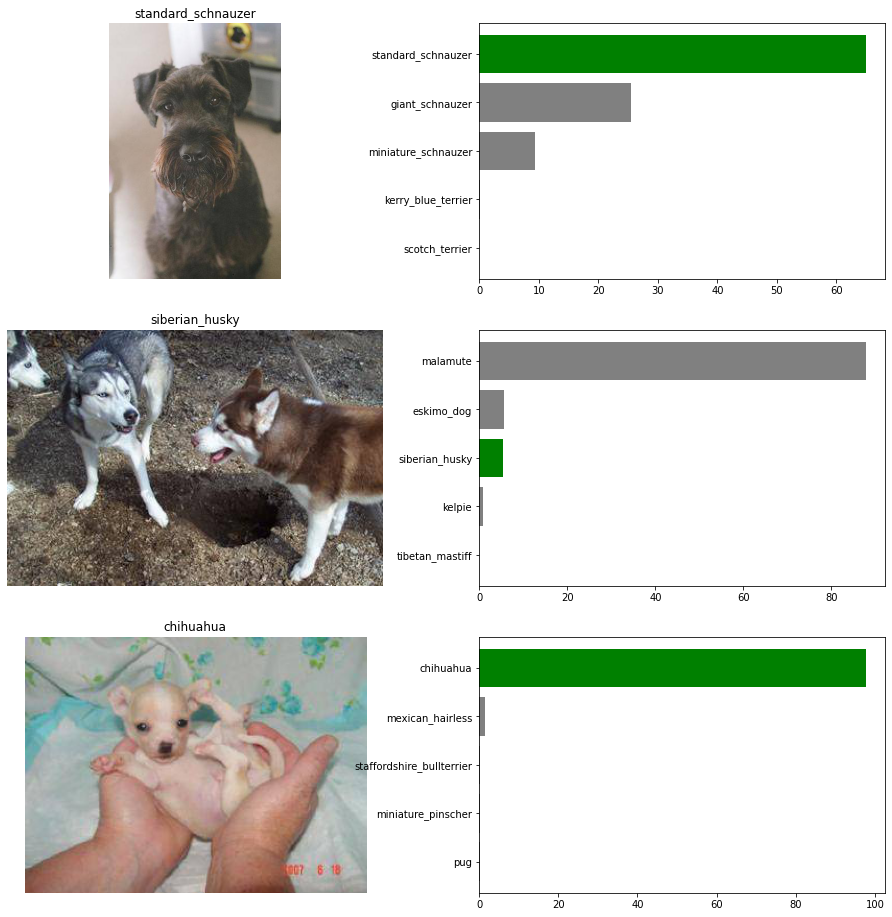

In [ ]:
import random
import cv2

plt.figure(figsize=(16,16))

for c in range(3):
  image_path = random.choice(valid_generator.filepaths)

  # 이미지 표시
  plt.subplot(3,2,c*2+1)
  plt.imshow(plt.imread(image_path))
  real_y = image_path.split('/')[3]
  plt.title(real_y)
  plt.axis('off')
  idx = unique_sorted_Y.index(real_y)

  # 예측값 표시
  plt.subplot(3,2,c*2+2)
  img = cv2.imread(image_path)
  img = cv2.resize(img, dsize=(299,299))
  img = img / 255.0
  img = np.expand_dims(img, axis=0)

  # Inception V3를 이용한 특징 벡터 추출
  feature_vector = feature_model.predict(img)

  # 시퀀셜 모델을 이용한 예측
  prediction = model.predict(feature_vector)[0]

  # 가장 높은 확률의 예측값 5개를 뽑음
  top_5_predict = prediction.argsort()[::-1][:5]
  labels = [unique_sorted_Y[index] for index in top_5_predict]
  color = ['gray'] * 5
  if idx in top_5_predict:
    color[top_5_predict.tolist().index(idx)] = 'green'
  color = color[::-1]
  plt.barh(range(5), prediction[top_5_predict][::-1]*100, color=color)
  plt.yticks(range(5), labels[::-1])

In [ ]:
!unzip test.zip
!unzip sample_submission.csv.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: test/82e41a906dbd9ec362a3d49cf6bbe645.jpg  
  inflating: test/82e5e34cc18b267ef7057cc92de8b44b.jpg  
  inflating: test/82e64f28df4fff22beb11e9a1e413212.jpg  
  inflating: test/82ec6bdf968a14923340179515ce5546.jpg  
  inflating: test/82ee3ee4dc01b33203a049c6c3338034.jpg  
  inflating: test/82f07a63a1f03ff9d8e0f4a8458caa93.jpg  
  inflating: test/82f5fb0bdaff30a4a3374e2d9915856c.jpg  
  inflating: test/82fbff1bd375474e3d4ec5cbfde3f9f0.jpg  
  inflating: test/8301c772feb7f4068473f0157ae58f9b.jpg  
  inflating: test/8307be57a9d76c1584e16801a39cb1dc.jpg  
  inflating: test/831a38bd2cfa0a093967d5b6c1ac09dc.jpg  
  inflating: test/831ef824af939f9754e3593638933b64.jpg  
  inflating: test/8322f53b29325419ef3bcf7cf10d7172.jpg  
  inflating: test/83233e2774e116ef34a04c53dd00a282.jpg  
  inflating: test/832cae23410e741ecd2014b3818ed7c4.jpg  
  inflating: test/833f90a3652b06607b55bd25c8d97457.jpg  
  inflating: test/8341f50a86c819b3cb8828740a97e7ef.j

In [ ]:
import pandas as pd
submission = pd.read_csv('sample_submission.csv')
print(submission.head())
print()
print(submission.info())

                                 id  ...  yorkshire_terrier
0  000621fb3cbb32d8935728e48679680e  ...           0.008333
1  00102ee9d8eb90812350685311fe5890  ...           0.008333
2  0012a730dfa437f5f3613fb75efcd4ce  ...           0.008333
3  001510bc8570bbeee98c8d80c8a95ec1  ...           0.008333
4  001a5f3114548acdefa3d4da05474c2e  ...           0.008333

[5 rows x 121 columns]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10357 entries, 0 to 10356
Columns: 121 entries, id to yorkshire_terrier
dtypes: float64(120), object(1)
memory usage: 9.6+ MB
None


In [ ]:
import os
import shutil

os.mkdir('/content/test_sub/')
os.mkdir('/content/test_sub/unknown/')

for i in range(len(submission)):
    shutil.copy('/content/test/' + submission.loc[i]['id'] + '.jpg', '/content/test_sub/unknown/')

In [ ]:
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

test_datagen=ImageDataGenerator(rescale=1./255.)
test_generator=test_datagen.flow_from_directory(directory="/content/test_sub/",batch_size=1,seed=42,shuffle=False,target_size=(299, 299))

Found 10357 images belonging to 1 classes.


In [ ]:
test_features = []

for idx in range(test_generator.n):
    if idx % 100 == 0:
        print(idx)
        
    x, _ = test_generator.next()
    feature = feature_model.predict(x)
    test_features.extend(feature)

test_features = np.array(test_features)
print(test_features.shape)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
(10357, 2048)


In [ ]:
test_Y = model.predict(test_features, verbose=1)

324/324 [==============================] - 0s 1ms/step


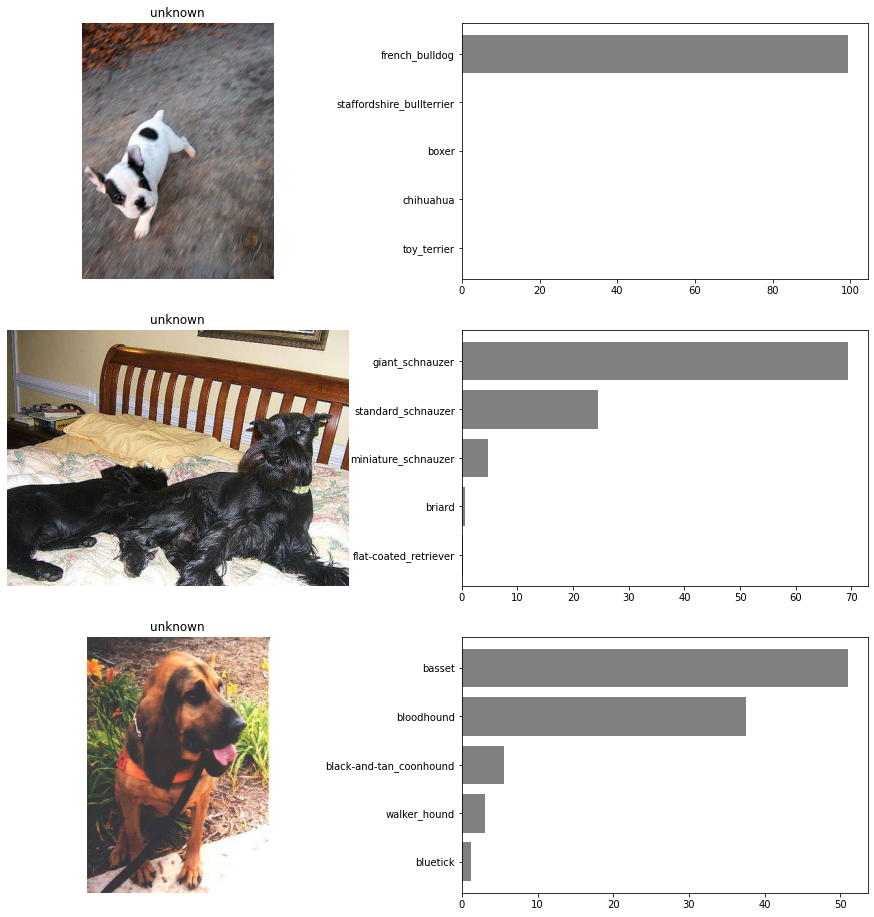

In [ ]:
import random
plt.figure(figsize=(16,16))
  
for c in range(3):
    image_path = random.choice(test_generator.filepaths)
    
    # 이미지 표시
    plt.subplot(3,2,c*2+1)
    plt.imshow(plt.imread(image_path))
    real_y = image_path.split('/')[3]
    plt.title(real_y)
    plt.axis('off')
    
    # 예측값 표시
    plt.subplot(3,2,c*2+2)
    img = cv2.imread(image_path)
    img = cv2.resize(img, dsize=(299, 299))
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    
    # Inception V3를 이용한 특징 벡터 추출
    feature_vector = feature_model.predict(img)
    
    # Sequential 모델을 이용한 예측
    prediction = model.predict(feature_vector)[0]
    
    # 가장 높은 확률의 예측값 5개를 뽑음
    top_5_predict = prediction.argsort()[::-1][:5]
    labels = [unique_sorted_Y[index] for index in top_5_predict]
    color = ['gray'] * 5
    plt.barh(range(5), prediction[top_5_predict][::-1] * 100, color=color)
    plt.yticks(range(5), labels[::-1])

In [ ]:
for i in range(len(test_Y)):
    for j in range(len(test_Y[i])):
        breed_column = unique_sorted_Y[j]
        submission.loc[i, breed_column] = test_Y[i, j]

In [ ]:
print(submission.iloc[:5, :5])

                                 id  ...      airedale
0  000621fb3cbb32d8935728e48679680e  ...  5.455508e-07
1  00102ee9d8eb90812350685311fe5890  ...  2.673916e-07
2  0012a730dfa437f5f3613fb75efcd4ce  ...  1.293373e-05
3  001510bc8570bbeee98c8d80c8a95ec1  ...  3.765947e-07
4  001a5f3114548acdefa3d4da05474c2e  ...  1.428634e-06

[5 rows x 5 columns]


In [ ]:
submission.to_csv('dogbreed_submission_inceptionV3_epoch10_299.csv', index=False)

### 6.3 신경 스타일 전이

#### 6.3.1 컨볼루션 신경망을 사용한 텍스처 합성

344064/337723 [==============================] - 0s 0us/step


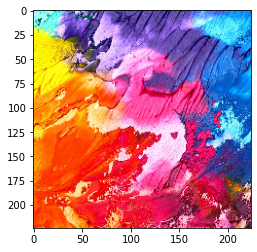

In [ ]:
import matplotlib.pyplot as plt
import cv2

style_path = tf.keras.utils.get_file('style.jpg', 'http://bit.ly/2mGfZIq')

style_image = plt.imread(style_path)
style_image = cv2.resize(style_image, dsize=(224,224))
style_image = style_image / 255.0
plt.imshow(style_image)

tf.Tensor([0.4319321  0.38198686 0.38577425], shape=(3,), dtype=float32)


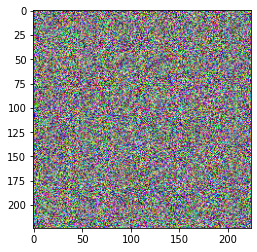

In [ ]:
target_image = tf.random.uniform(style_image.shape)
print(target_image[0,0,:])
plt.imshow(target_image)

In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

vgg = VGG19(include_top = False, weights='imagenet')

for layer in vgg.layers:
  print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
# 특징 추출 모델 만들기
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1',]

vgg.trainable = False
outputs = [vgg.get_layer(name).output for name in style_layers]
model = tf.keras.Model([vgg.input],outputs)

In [ ]:
# Gram matrix 계산 함수 정의
def gram_matrix(input_tensor):
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1,channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a,a,transpose_a=True)
  return gram / tf.cast(n,tf.float32)

In [ ]:
# 원본 텍스처에서 gram matrix 계산
style_image = plt.imread(style_path)
style_image = cv2.resize(style_image, dsize=(224,224))
style_image = style_image / 255.0

style_batch = style_image.astype('float32')
style_batch = tf.expand_dims(style_batch, axis = 0)
style_output = model(preprocess_input(style_batch * 255.0))

(1, 224, 224, 64)


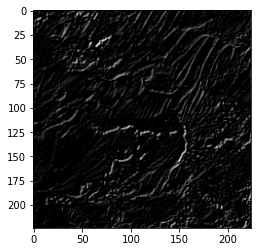

In [ ]:
print(style_output[0].shape)
plt.imshow(tf.squeeze(style_output[0][:,:,:,0],0), cmap='gray')

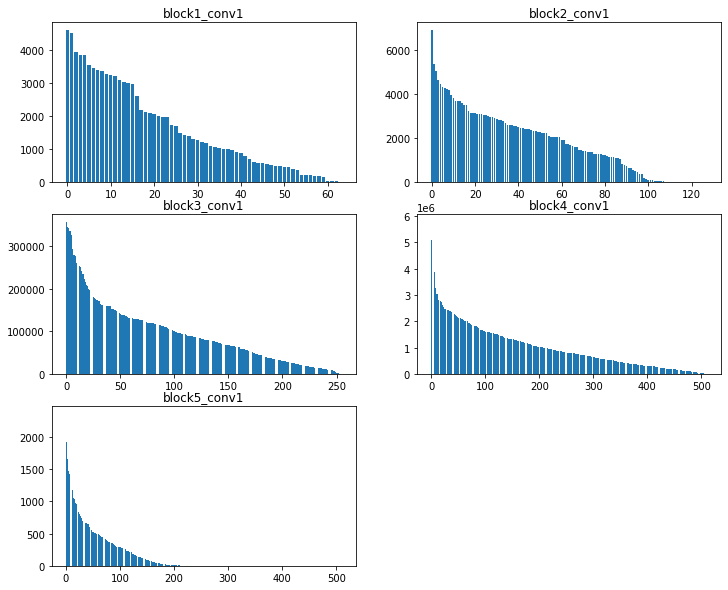

In [ ]:
style_outputs = [gram_matrix(out) for out in style_output]

plt.figure(figsize=(12,10))
for c in range(5):
  plt.subplot(3,2,c+1)
  array = sorted(style_outputs[c].numpy()[0].tolist())
  array = array[::-1]
  plt.bar(range(style_outputs[c].shape[0]), array)
  plt.title(style_layers[c])
plt.show()

In [ ]:
# 타깃 텍스처를 업데이트하기 위한 함수 정의
def get_outputs(image):
  image_batch = tf.expand_dims(image, axis=0)
  output = model(preprocess_input(image_batch * 255.0))
  outputs = [gram_matrix(out) for out in output]
  return outputs

def get_loss(outputs, style_outputs):
  return tf.reduce_sum([tf.reduce_mean((o-s)**2) for o,s in zip(outputs,style_outputs)])

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [ ]:
# tf.function과 GradientTape을 이용한 이미지 업데이트 함수 정의
opt = tf.optimizers.Adam(learning_rate=0.2, beta_1=0.99, epsilon=1e-1)

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = get_outputs(image)
    loss = get_loss(outputs,style_outputs)

  grad = tape.gradient(loss,image)
  opt.apply_gradients([(grad,image)])
  image.assign(clip_0_1(image))

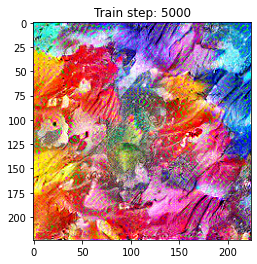

Total time: 117.6


In [ ]:
# 텍스처 합성 알고리즘 실행
import IPython.display as display
import time
import imageio

start = time.time()

image = tf.Variable(target_image)

epochs = 50
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
  if n % 5 == 0 or n == epochs -1:
    imageio.imwrite('style_epoch_{0}.png'.format(n),image.read_value().numpy())
  display.clear_output(wait=True)
  plt.imshow(image.read_value())
  plt.title("Train step: {}".format(step))
  plt.show()

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
# variation loss 함수 정의
def high_pass_x_y(image):
  x_var = image[:,1:,:] - image[:,:-1,:]
  y_var = image[1:,:,:] - image[:-1,:,:]
  return x_var, y_var

def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_mean(x_deltas**2) + tf.reduce_mean(y_deltas**2)

In [ ]:
print('target : ', total_variation_loss(image.read_value()))
print('noise : ', total_variation_loss(tf.random.uniform(style_image.shape)))
print('original : ',total_variation_loss(style_image))

target :  tf.Tensor(0.096426964, shape=(), dtype=float32)
noise :  tf.Tensor(0.3323151, shape=(), dtype=float32)
original :  tf.Tensor(0.03641251305469578, shape=(), dtype=float64)


In [ ]:
# variation loss를 손실 계산식에 추가, 각 손실의 가중치 추가
total_variation_weight = 1e9
style_weight = 1e-1

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = get_outputs(image)
    loss = style_weight * get_loss(outputs,style_outputs)
    loss += total_variation_weight * total_variation_loss(image)

  grad = tape.gradient(loss,image)
  opt.apply_gradients([(grad,image)])
  image.assign(clip_0_1(image))

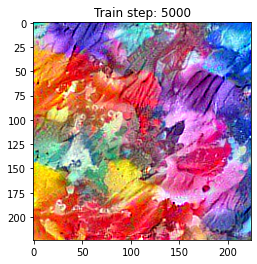

Total time: 117.7


In [ ]:
# variation loss를 추가한 텍스쳐 합성 알고리즘 실행
start = time.time()

target_image = tf.random.uniform(style_image.shape)
image = tf.Variable(target_image)

epochs = 50
steps_per_epoch = 100

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
    if n % 5 == 0 or n == epochs - 1:
        imageio.imwrite('style_variation_epoch_{0}.png'.format(n), image.read_value().numpy())
    display.clear_output(wait=True)
    plt.imshow(image.read_value())
    plt.title("Train step: {}".format(step))
    plt.show()

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
# 원본과 타겟의 variation loss 비교
print('target   :', total_variation_loss(image.read_value()))
print('original :', total_variation_loss(style_image))

target   : tf.Tensor(0.025726113, shape=(), dtype=float32)
original : tf.Tensor(0.03641251305469578, shape=(), dtype=float64)


#### 6.3.2 컨볼루션 신경망을 사용한 신경 스타일 전이

761856/754420 [==============================] - 0s 0us/step


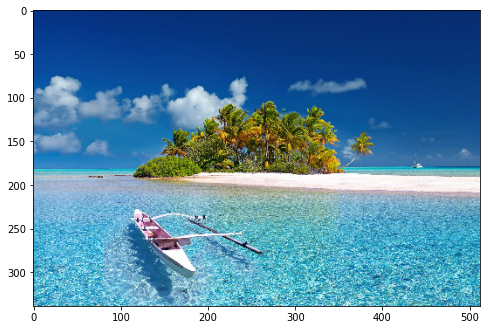

In [ ]:
# content 텍스처 불러오기
import matplotlib.pyplot as plt
import cv2

content_path = tf.keras.utils.get_file('content.jpg', 'http://bit.ly/2mAfUX1')

content_image = plt.imread(content_path)
max_dim = 512
long_dim = max(content_image.shape[:-1])
scale = max_dim / long_dim
new_height = int(content_image.shape[0] * scale)
new_width = int(content_image.shape[1] * scale)

content_image = cv2.resize(content_image, dsize=(new_width,new_height))
content_image = content_image / 255.0
plt.figure(figsize=(8,8))
plt.imshow(content_image)

In [ ]:
# content 특징 추출 모델 만들기
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

content_batch = content_image.astype('float32')
content_batch = tf.expand_dims(content_batch, axis=0)

content_layers = ['block5_conv2']

vgg.trainable = False
outputs = [vgg.get_layer(name).output for name in content_layers]
model_content = tf.keras.Model([vgg.input], outputs)
content_output = model_content(preprocess_input(content_batch * 255.0))

In [ ]:
# content output, loss 함수 정의
def get_content_output(image):
  image_batch = tf.expand_dims(image, axis=0)
  output = model_content(preprocess_input(image_batch * 255.0))
  return output

def get_content_loss(image, content_output):
  return tf.reduce_sum(tf.reduce_mean(image-content_output)**2)

In [ ]:
# content loss를 손실 계산식에 추가
opt = tf.optimizers.Adam(learning_rate=0.001,beta_1=0.99,epsilon=1e-1)

total_variation_weight = 1e9
style_weight = 1e-2
content_weight = 1e4

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = get_outputs(image)
    output2 = get_content_output(image)
    loss = style_weight * get_loss(outputs, style_outputs)
    loss += content_weight * get_content_loss(output2, content_output)
    loss += total_variation_weight * total_variation_loss(image)

  grad = tape.gradient(loss,image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

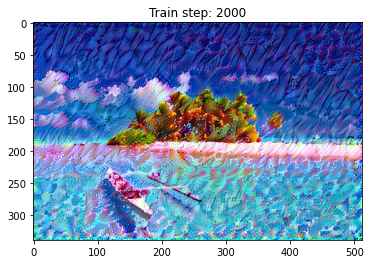

total time: 234.7


In [ ]:
# 신경 스타일 전이 실행
import IPython.display as display
import time
import imageio

start = time.time()

# target_image = tf.random.uniform(content_image.shape)
image = tf.Variable(content_image.astype('float32'))
epochs = 20
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  if n % 5 == 0 or n == epochs - 1:
    imageio.imwrite('style_{0}_content_{1}_transfer_epoch_{2}.png'.format(style_weight,content_weight,n),image.read_value().numpy())
    display.clear_output(wait=True)
    plt.imshow(image.read_value())
    plt.title("Train step: {}".format(step))
    plt.show()

end=time.time()
print("total time: {:.1f}".format(end-start))

# Chapter7 오토인코더

### 7.1 MNIST 데이터 세트에 적용하기

In [ ]:
# MNIST 데이터세트 불러오기
(train_X, train_Y), (test_X, test_Y) = tf.keras.datasets.mnist.load_data()
print(train_X.shape, train_Y.shape)

train_X = train_X / 255.0
test_X = test_X / 255.0

(60000, 28, 28) (60000,)


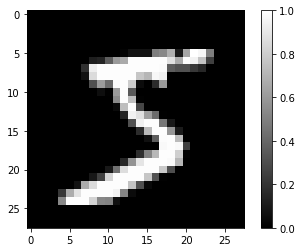

5


In [ ]:
# MNIST 데이터세트 확인
import matplotlib.pyplot as plt
plt.imshow(train_X[0].reshape(28, 28), cmap='gray')
plt.colorbar()
plt.show()

print(train_Y[0])

In [ ]:
# Dense 오토인코더 모델 정의
train_X = train_X.reshape(-1,28*28)
test_X = test_X.reshape(-1,28*28)
print(train_X.shape, train_Y.shape)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(784,activation='relu',input_shape=(784,)),
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dense(784,activation='sigmoid')
])

model.compile(optimizer=tf.optimizers.Adam(),loss='mse')
model.summary()

(60000, 784) (60000,)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 784)               615440    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                50240     
_________________________________________________________________
dense_2 (Dense)              (None, 784)               50960     
Total params: 716,640
Trainable params: 716,640
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(train_X, train_X, epochs=10, batch_size = 256)

Epoch 1/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0871
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0203
Epoch 3/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0127
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0102
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0090
Epoch 6/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0082
Epoch 7/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0076
Epoch 8/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0072
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0068
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.0066


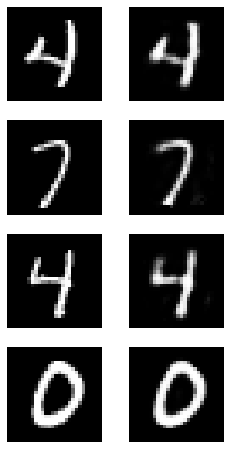

313/313 [==============================] - 1s 2ms/step - loss: 0.0061


0.006143258418887854

In [ ]:
import random

plt.figure(figsize=(4,8))
for c in range(4):
    plt.subplot(4,2,c*2+1)
    rand_index = random.randint(0,test_X.shape[0])
    plt.imshow(test_X[rand_index].reshape(28,28),cmap='gray')
    plt.axis('off')
    
    plt.subplot(4,2,c*2+2)
    img = model.predict(np.expand_dims(test_X[rand_index],axis=0))
    plt.imshow(img.reshape(28,28),cmap='gray')
    plt.axis('off')
    
plt.show()

model.evaluate(test_X,test_X)

In [ ]:
# 컨볼루션 오토인코더 모델 정의
train_X = train_X.reshape(-1, 28, 28, 1)
test_X = test_X.reshape(-1, 28, 28, 1)

model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=2, strides=(2,2), activation='relu', input_shape=(28, 28, 1)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2,2), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(7*7*64, activation='relu'),
    tf.keras.layers.Reshape(target_shape=(7,7,64)),
    tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=2, strides=(2,2), padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=2, strides=(2,2), padding='same', activation='sigmoid')
])

model.compile(optimizer=tf.optimizers.Adam(), loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 32)        160       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 64)          8256      
_________________________________________________________________
flatten (Flatten)            (None, 3136)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                200768    
_________________________________________________________________
dense_4 (Dense)              (None, 3136)              203840    
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 32)       

In [ ]:
model.fit(train_X,train_X,epochs=20,batch_size=256)

Epoch 1/20
235/235 [==============================] - 5s 6ms/step - loss: 0.1101
Epoch 2/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0333
Epoch 3/20
235/235 [==============================] - 1s 5ms/step - loss: 0.0232
Epoch 4/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0202
Epoch 5/20
235/235 [==============================] - 1s 5ms/step - loss: 0.0187
Epoch 6/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0178
Epoch 7/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0174
Epoch 8/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0171
Epoch 9/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0169
Epoch 10/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0167
Epoch 11/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0165
Epoch 12/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0163
Epoch 13/20
235/235 [====

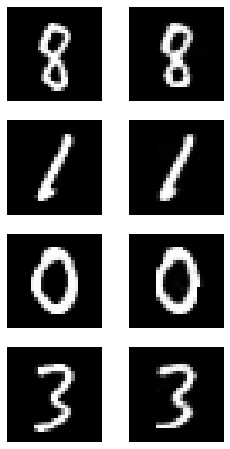

313/313 [==============================] - 1s 2ms/step - loss: 0.0146


0.01459688600152731

In [ ]:
# test 데이터로 컨볼루션 오토인코더의 이미지 재생성
import random

plt.figure(figsize=(4,8))
for c in range(4):
    plt.subplot(4, 2, c*2+1)
    rand_index = random.randint(0, test_X.shape[0])
    plt.imshow(test_X[rand_index].reshape(28, 28), cmap='gray')
    plt.axis('off')
    
    plt.subplot(4, 2, c*2+2)
    img = model.predict(np.expand_dims(test_X[rand_index], axis=0))
    plt.imshow(img.reshape(28, 28), cmap='gray')
    plt.axis('off')
    
plt.show()

model.evaluate(test_X, test_X)

In [ ]:
# 활성화함수를 elu로 바꾼 컨볼루션 오토인코더 모델 정의
train_X = train_X.reshape(-1, 28, 28, 1)
test_X = test_X.reshape(-1, 28, 28, 1)

model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=2, strides=(2,2), activation='elu', input_shape=(28, 28, 1)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2,2), activation='elu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(7*7*64, activation='elu'),
    tf.keras.layers.Reshape(target_shape=(7,7,64)),
    tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=2, strides=(2,2), padding='same', activation='elu'),
    tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=2, strides=(2,2), padding='same', activation='sigmoid')
])

model.compile(optimizer=tf.optimizers.Adam(), loss='mse')
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 14, 14, 32)        160       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 7, 7, 64)          8256      
_________________________________________________________________
flatten_2 (Flatten)          (None, 3136)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 64)                200768    
_________________________________________________________________
dense_8 (Dense)              (None, 3136)              203840    
_________________________________________________________________
reshape_2 (Reshape)          (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 14, 14, 32)       

In [ ]:
model.fit(train_X, train_X, epochs=20, batch_size=256)

Epoch 1/20
235/235 [==============================] - 2s 6ms/step - loss: 0.0924
Epoch 2/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0194
Epoch 3/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0117
Epoch 4/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0101
Epoch 5/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0093
Epoch 6/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0088
Epoch 7/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0083
Epoch 8/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0075
Epoch 9/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0071
Epoch 10/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0068
Epoch 11/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0065
Epoch 12/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0062
Epoch 13/20
235/235 [====

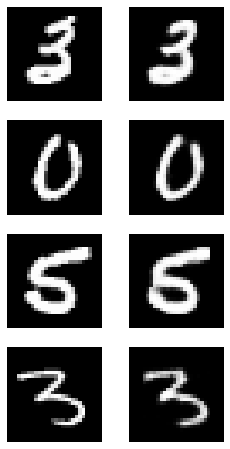

313/313 [==============================] - 1s 2ms/step - loss: 0.0053


0.005347758531570435

In [ ]:
# test 데이터로 컨볼루션 오토인코더의 이미지 재생성
import random

plt.figure(figsize=(4,8))
for c in range(4):
    plt.subplot(4, 2, c*2+1)
    rand_index = random.randint(0, test_X.shape[0])
    plt.imshow(test_X[rand_index].reshape(28, 28), cmap='gray')
    plt.axis('off')
    
    plt.subplot(4, 2, c*2+2)
    img = model.predict(np.expand_dims(test_X[rand_index], axis=0))
    plt.imshow(img.reshape(28, 28), cmap='gray')
    plt.axis('off')
    
plt.show()

model.evaluate(test_X, test_X)

### 7.2 클러스터링

#### 7.2.1 K-평균 클러스터링

In [ ]:
# 잠재변수 추출 모델 정의 및 실행
latent_vector_model = tf.keras.Model(inputs=model.input, outputs=model.layers[3].output)
latent_vector = latent_vector_model.predict(train_X)
print(latent_vector.shape)
print(latent_vector[0])

(60000, 64)
[29.11911    -0.99999624  6.0750666   9.652713   19.510061   -0.99999994
 17.22705     8.960689   18.626968    1.269213   -0.9999998   6.497797
 -0.99999964 23.997166    5.838038   -0.99999994 17.987207   -0.99997556
  3.96678     0.87703735 -0.99999964 17.625875   -0.9999999  18.433683
  9.737399   15.199641   21.820034   -0.9999999  -0.99999994  3.4545004
 12.350603   -0.99999934 13.860248   -0.9999989   8.764766   -0.9999998
 -0.99999964 -0.99999964 -0.9999993  16.81949    13.214991   12.642706
 -0.99999857 12.768258    6.807808   10.963485   -0.99999976 -0.9999993
 -0.99999857 14.972902   -0.99999964 10.460002    6.3111634  -0.98473215
 14.043414   25.677982   11.112737    9.321097   -0.9999954  27.374975
 -0.9995115  12.951261   11.16885    26.214188  ]


In [ ]:
%%time
# 사이킷 런의 K-평균 클러스터링 알고리즘 사용
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10, n_init=10, random_state=42)
kmeans.fit(latent_vector)

Wall time: 4.09 s


KMeans(n_clusters=10, random_state=42)

In [ ]:
# 계산 결과 확인
print(kmeans.labels_)
print(kmeans.cluster_centers_.shape)
print(kmeans.cluster_centers_[0])

[6 9 8 ... 6 0 1]
(10, 64)
[15.630079   -0.9999871   4.921071   15.41829     9.857521   -0.99999714
 12.669049    7.829863   12.460605    3.8016455  -0.99999416  3.04827
 -0.9999968  13.01049     5.1860757  -0.99999654 11.424294   -0.9999038
 10.902313    3.4517064  -0.9999755  13.691394   -0.99999774 16.306248
 12.835777   25.52283     7.626343   -0.99999505 -0.9999958  11.8460655
 11.701805   -0.9999962  12.512657   -0.9999862  14.578861   -0.99999905
 -0.99999255 -0.99999344 -0.999988   12.150776   18.883863   16.955664
 -0.9998723  13.858422    8.553843   10.388242   -0.99999017 -0.99996275
 -0.99999416 15.063672   -0.9999858  15.04299    18.070978   -0.80740285
 15.832048    7.3267126   5.096889   13.19704    -0.9999579  15.674442
 -0.9873001  12.466464   22.445742   12.292879  ]


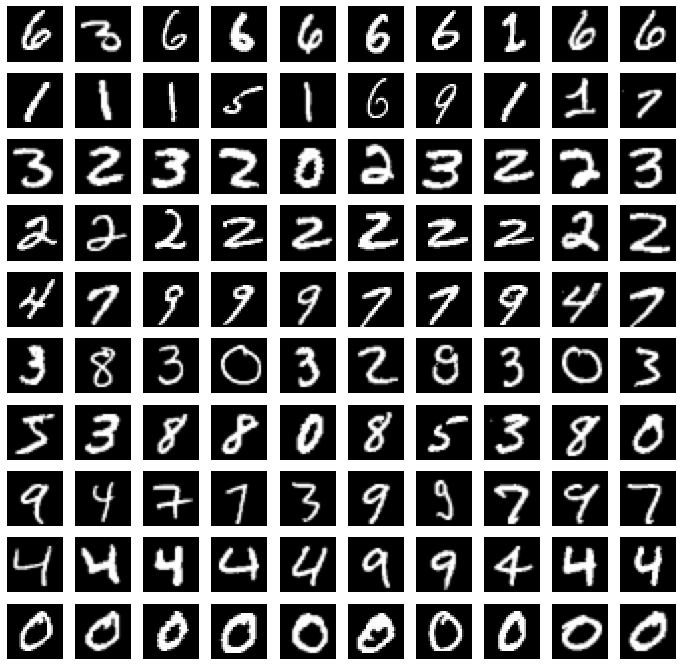

In [ ]:
# 클러스터링 결과 출력
plt.figure(figsize=(12,12))

for i in range(10):
    images = train_X[kmeans.labels_ == i]
    for c in range(10):
        plt.subplot(10, 10, i*10+c+1)
        plt.imshow(images[c].reshape(28,28), cmap='gray')
        plt.axis('off')
        
plt.show()

#### 7.2.2 t-SNE

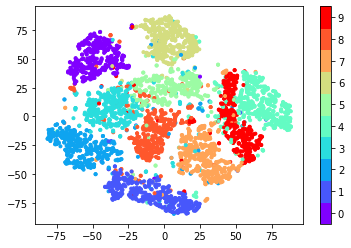

Wall time: 15.4 s


In [ ]:
%%time
# 사이킷런의 t-SNE 사용
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, learning_rate=100, perplexity=15, random_state=0)
# n_components = 저차원의 수, learning_rate = 학습률, perplexity = 알고리즘 계산에서 고려할 최근접 이웃의 숫자
# random_state = 랜덤 초기화 숫자
tsne_vector = tsne.fit_transform(latent_vector[:5000])

cmap = plt.get_cmap('rainbow', 10)
fig = plt.scatter(tsne_vector[:,0],tsne_vector[:,1],marker='.',c=train_Y[:5000],cmap=cmap)
cb = plt.colorbar(fig,ticks=range(10))
n_clusters=10
tick_locs = (np.arange(n_clusters) + 0.5)*(n_clusters-1)/n_clusters
cb.set_ticks(tick_locs)
cb.set_ticklabels(range(10))

plt.show()

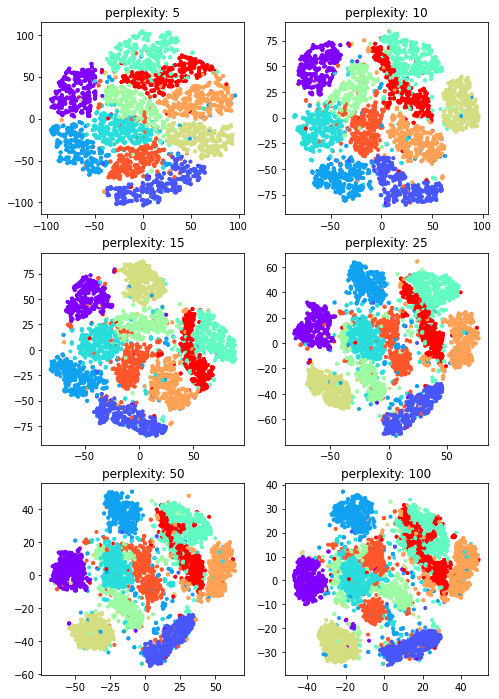

Wall time: 1min 49s


In [ ]:
%%time
# 다양한 perplexity 인수에 대한 t-SNE 결과
perplexities = [5,10,15,25,50,100]
plt.figure(figsize=(8,12))

for c in range(6):
    tsne = TSNE(n_components=2, learning_rate =100, perplexity=perplexities[c], random_state=0)
    tsne_vector = tsne.fit_transform(latent_vector[:5000])
    
    plt.subplot(3,2,c+1)
    plt.scatter(tsne_vector[:,0],tsne_vector[:,1],marker='.',c=train_Y[:5000],cmap='rainbow')
    plt.title('perplexity: {0}'.format(perplexities[c]))
    
plt.show()

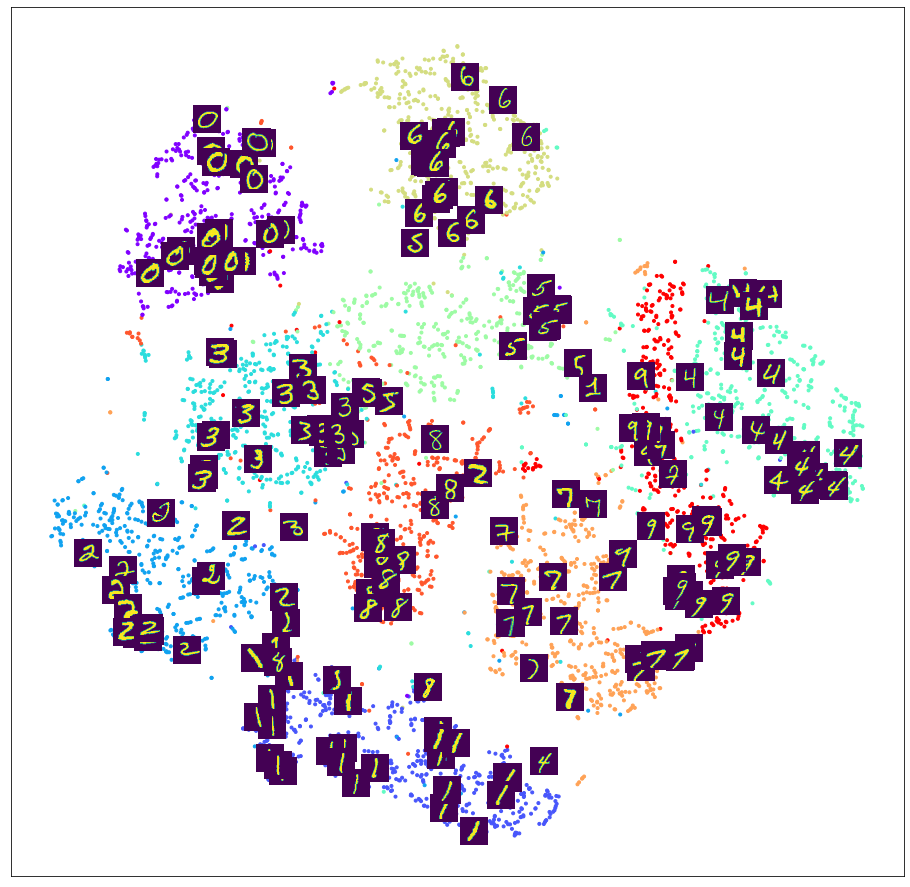

In [ ]:
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox

plt.figure(figsize=(16,16))
tsne = TSNE(n_components=2, learning_rate=100, perplexity=15, random_state=0)
tsne_vector = tsne.fit_transform(latent_vector[:5000])

ax = plt.subplot(1,1,1)
ax.scatter(tsne_vector[:,0],tsne_vector[:,1],marker='.',c=train_Y[:5000],cmap='rainbow')
for i in range(200):
    imagebox = OffsetImage(train_X[i].reshape(28,28))
    ab = AnnotationBbox(imagebox, (tsne_vector[i,0], tsne_vector[i,1]), frameon=False, pad=0.0)
    ax.add_artist(ab)
    
ax.set_xticks([])
ax.set_yticks([])
plt.show()

### 7.3 초해상도 이미지 얻기

In [ ]:
# BSD500 데이터세트 불러오기
tf.keras.utils.get_file('/content/bsd500_images.zip', 'http://bit.ly/35pHZlC', extract=True)

!unzip /content/bsd500_images.zip

37527552/37520292 [==============================] - 0s 0us/step
Archive:  /content/bsd500_images.zip
   creating: images/
   creating: images/test/
  inflating: images/test/100007.jpg  
  inflating: images/test/100039.jpg  
  inflating: images/test/100099.jpg  
  inflating: images/test/10081.jpg   
  inflating: images/test/101027.jpg  
  inflating: images/test/101084.jpg  
  inflating: images/test/102062.jpg  
  inflating: images/test/103006.jpg  
  inflating: images/test/103029.jpg  
  inflating: images/test/103078.jpg  
  inflating: images/test/104010.jpg  
  inflating: images/test/104055.jpg  
  inflating: images/test/105027.jpg  
  inflating: images/test/106005.jpg  
  inflating: images/test/106047.jpg  
  inflating: images/test/107014.jpg  
  inflating: images/test/107045.jpg  
  inflating: images/test/107072.jpg  
  inflating: images/test/108004.jpg  
  inflating: images/test/108036.jpg  
  inflating: images/test/108069.jpg  
  inflating: images/test/109055.jpg  
  inflating: im

In [ ]:
# 이미지 경로 및 저장확인
import pathlib
image_root = pathlib.Path('/content/images')

all_image_paths = list(image_root.glob('*/*'))
print(all_image_paths[:10])

[PosixPath('/content/images/test/176051.jpg'), PosixPath('/content/images/test/145059.jpg'), PosixPath('/content/images/test/189013.jpg'), PosixPath('/content/images/test/14092.jpg'), PosixPath('/content/images/test/179084.jpg'), PosixPath('/content/images/test/120093.jpg'), PosixPath('/content/images/test/134067.jpg'), PosixPath('/content/images/test/209021.jpg'), PosixPath('/content/images/test/206062.jpg'), PosixPath('/content/images/test/346016.jpg')]


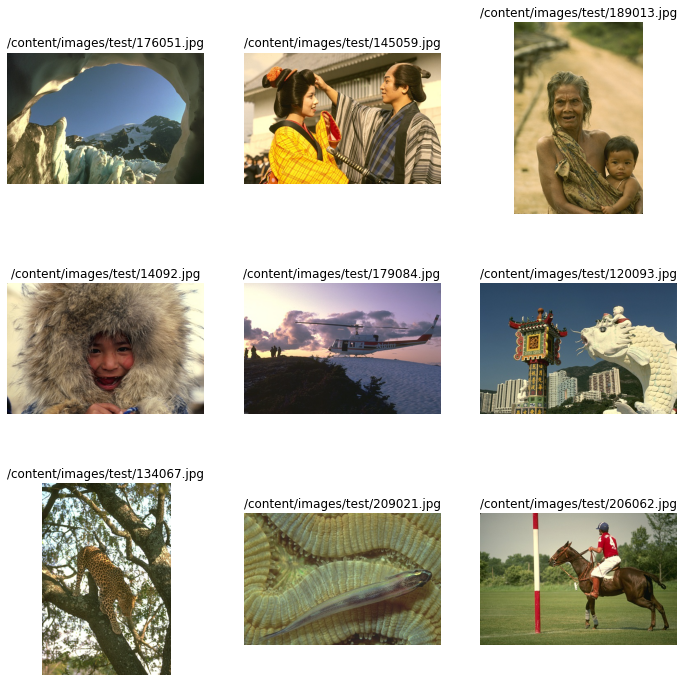

In [ ]:
# 이미지 확인
import PIL.Image as Image
import matplotlib.pyplot as plt

plt.figure(figsize=(12,12))
for c in range(9):
  plt.subplot(3,3,c+1)
  plt.imshow(plt.imread(all_image_paths[c]))
  plt.title(all_image_paths[c])
  plt.axis('off')

plt.show()

In [ ]:
# 이미지 경로 분리 저장
train_path, valid_path, test_path = [], [], []

for image_path in all_image_paths:
  if str(image_path).split('.')[-1] != 'jpg':
    continue

  if str(image_path).split('/')[-2] == 'train':
    train_path.append(str(image_path))
  elif str(image_path).split('/')[-2] == 'val':
    valid_path.append(str(image_path))
  else:
    test_path.append(str(image_path))

In [ ]:
# 원본 이미지에서 조각을 추출하고 입력,출력 데이터를 반환하는 함수 정의
def get_hr_and_lr(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  hr = tf.image.random_crop(img,[50,50,3])
  lr = tf.image.resize(hr, [25,25])
  lr = tf.image.resize(lr,[50,50])
  return lr,hr

In [ ]:
# train, valid Dataset 정의

train_dataset = tf.data.Dataset.list_files(train_path)
train_dataset = train_dataset.map(get_hr_and_lr)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.batch(16)

valid_dataset = tf.data.Dataset.list_files(valid_path)
valid_dataset = valid_dataset.map(get_hr_and_lr)
valid_dataset = valid_dataset.repeat()
valid_dataset = valid_dataset.batch(1)

In [ ]:
# tf.keras 의 함수형 API를 사용한 REDNet 네트워크 정의
def REDNet(num_layers):
    conv_layers = []
    deconv_layers = []
    residual_layers = []

    inputs = tf.keras.layers.Input(shape=(None, None, 3))
    conv_layers.append(tf.keras.layers.Conv2D(3, kernel_size=3, padding='same', activation='relu'))

    for i in range(num_layers-1):
        conv_layers.append(tf.keras.layers.Conv2D(64, kernel_size=3, padding='same', activation='relu'))
        deconv_layers.append(tf.keras.layers.Conv2DTranspose(64, kernel_size=3, padding='same', activation='relu'))

    deconv_layers.append(tf.keras.layers.Conv2DTranspose(3, kernel_size=3, padding='same'))

    # 인코더 시작
    x = conv_layers[0](inputs)

    for i in range(num_layers-1):
        x = conv_layers[i+1](x)
        if i % 2 == 0:
            residual_layers.append(x)

    # 디코더 시작
    for i in range(num_layers-1):
        if i % 2 == 1:
            x = tf.keras.layers.Add()([x, residual_layers.pop()])
            x = tf.keras.layers.Activation('relu')(x)
        x = deconv_layers[i](x) 

    x = deconv_layers[-1](x)
    
    model = tf.keras.Model(inputs=inputs, outputs=x)
    return model

In [ ]:
# PSNR 정의
def psnr_metric(y_true, y_pred):
  return tf.image.psnr(y_true, y_pred, max_val=1.0)

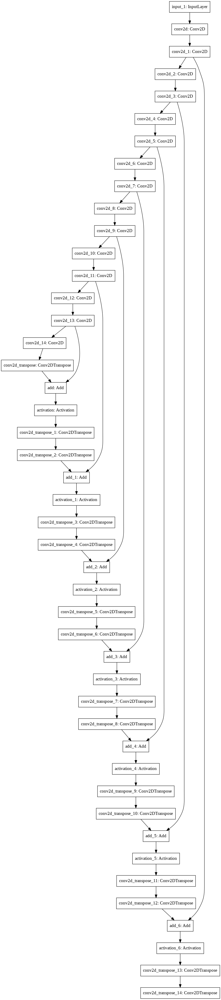

In [ ]:
# REDNet-30 네트워크 초기화 및 컴파일
model = REDNet(15)
model.compile(optimizer=tf.optimizers.Adam(0.0001),loss = 'mse', metrics=[psnr_metric])
#네트워크 시각화
tf.keras.utils.plot_model(model)

In [ ]:
# REDNet-30 네트워크 학습
history = model.fit_generator(train_dataset, epochs=1000,steps_per_epoch=len(train_path)//16,
                              validation_data=valid_dataset,
                              validation_steps=len(valid_path),verbose=2)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/1000
12/12 - 11s - loss: 0.0979 - psnr_metric: 12.0922 - val_loss: 0.0281 - val_psnr_metric: 16.2733
Epoch 2/1000
12/12 - 2s - loss: 0.0278 - psnr_metric: 16.8078 - val_loss: 0.0211 - val_psnr_metric: 17.8162
Epoch 3/1000
12/12 - 1s - loss: 0.0214 - psnr_metric: 17.6689 - val_loss: 0.0185 - val_psnr_metric: 18.6708
Epoch 4/1000
12/12 - 2s - loss: 0.0182 - psnr_metric: 18.3928 - val_loss: 0.0139 - val_psnr_metric: 19.6649
Epoch 5/1000
12/12 - 1s - loss: 0.0157 - psnr_metric: 19.3332 - val_loss: 0.0129 - val_psnr_metric: 20.3760
Epoch 6/1000
12/12 - 2s - loss: 0.0120 - psnr_metric: 20.3547 - val_loss: 0.0097 - val_psnr_metric: 21.3684
Epoch 7/1000
12/12 - 2s - loss: 0.0089 - psnr_metric: 22.0729 - val_loss: 0.0089 - val_psnr_metric: 21.6972
Epoch 8/1000
12/12 - 2s - loss: 0.0084 - psnr_metric: 22.0680 - val_loss: 0.0076 - val_psnr_metric: 22.4538
Epoch 9/1000
12/12 - 2s - loss: 0.0069 - psnr_metric: 23.0453 - val_loss: 0.0067 - val_psnr_metric: 22.9232
Epoch 10/1000
12/12 - 2s - 

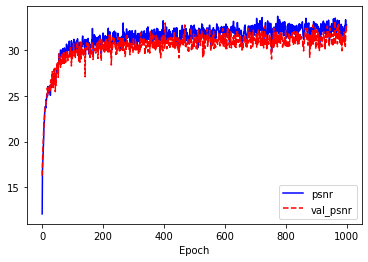

In [ ]:
# REDNet-30 네트워크 학습 결과 확인
import matplotlib.pyplot as plt
plt.plot(history.history['psnr_metric'], 'b-', label='psnr')
plt.plot(history.history['val_psnr_metric'], 'r--', label='val_psnr')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
# test 이미지에 대한 초해상도
img = tf.io.read_file(test_path[0])
img = tf.image.decode_jpeg(img, channels=3)
hr = tf.image.convert_image_dtype(img, tf.float32)

lr = tf.image.resize(hr, [hr.shape[0]//2, hr.shape[1]//2])
lr = tf.image.resize(lr, [hr.shape[0], hr.shape[1]])
predict_hr = model.predict(np.expand_dims(lr,axis=0))

print(tf.image.psnr(np.squeeze(predict_hr,axis=0), hr, max_val=1.0))
print(tf.image.psnr(lr,hr,max_val=1.0))

tf.Tensor(31.06989, shape=(), dtype=float32)
tf.Tensor(29.740524, shape=(), dtype=float32)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


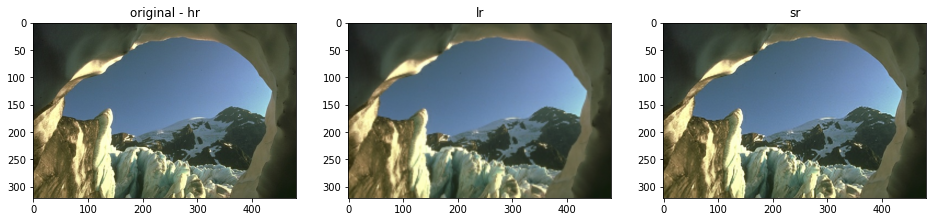

In [ ]:
# test 이미지에 대한 초해상도 결과 확인
plt.figure(figsize=(16,4))

plt.subplot(1,3,1)
plt.imshow(hr)
plt.title('original - hr')

plt.subplot(1,3,2)
plt.imshow(lr)
plt.title('lr')

plt.subplot(1,3,3)
plt.imshow(np.squeeze(predict_hr, axis=0))
plt.title('sr')

plt.show()

131072/127529 [==============================] - 0s 0us/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tf.Tensor(30.822996, shape=(), dtype=float32)
tf.Tensor(24.783773, shape=(), dtype=float32)


Text(0.5, 1.0, 'sr')

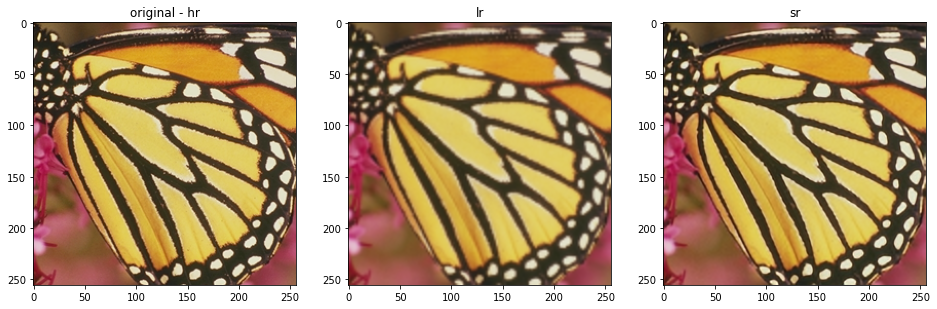

In [ ]:
# Set5의 나비 이미지 테스트
image_path = tf.keras.utils.get_file('butterfly.png', 'http://bit.ly/2oAOxgH')

img = tf.io.read_file(image_path)
img = tf.image.decode_jpeg(img, channels=3)
hr = tf.image.convert_image_dtype(img, tf.float32)

lr = tf.image.resize(hr, [hr.shape[0]//2, hr.shape[1]//2])
lr = tf.image.resize(lr, [hr.shape[0], hr.shape[1]])
predict_hr = model.predict(np.expand_dims(lr, axis=0))

print(tf.image.psnr(np.squeeze(predict_hr, axis=0), hr, max_val=1.0))
print(tf.image.psnr(lr, hr, max_val=1.0))


plt.figure(figsize=(16,6))
plt.subplot(1, 3, 1)
plt.imshow(hr)
plt.title('original - hr')

plt.subplot(1, 3, 2)
plt.imshow(lr)
plt.title('lr')

plt.subplot(1, 3, 3)
plt.imshow(np.squeeze(predict_hr, axis=0))
plt.title('sr')

In [ ]:
# 확대 비율을 2배에서 4배로 수정, 이미지 보강
import random
def get_hr_and_lr_flip_s4(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    hr = tf.image.random_crop(img, [50, 50, 3])
    lr = tf.image.resize(hr, [12, 12])
    lr = tf.image.resize(lr, [50, 50])
    
    if random.random() < 0.25:
        hr = tf.image.flip_left_right(hr)
        lr = tf.image.flip_left_right(lr)
    if random.random() < 0.25:
        hr = tf.image.flip_up_down(hr)
        lr = tf.image.flip_up_down(lr)
    
    return lr, hr

In [ ]:
# train, valid Dataset 정의
train_dataset = tf.data.Dataset.list_files(train_path)
train_dataset = train_dataset.map(get_hr_and_lr_flip_s4)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.batch(16)

valid_dataset = tf.data.Dataset.list_files(valid_path)
valid_dataset = valid_dataset.map(get_hr_and_lr_flip_s4)
valid_dataset = valid_dataset.repeat()
valid_dataset = valid_dataset.batch(1)

In [ ]:
# REDNet-30 네트워크 학습
model = REDNet(15)
model.compile(optimizer=tf.optimizers.Adam(0.0001), loss='mse', metrics=[psnr_metric])

history = model.fit_generator(train_dataset, 
                              epochs=4000, 
                              steps_per_epoch=len(train_path)//16, 
                              validation_data=valid_dataset, 
                              validation_steps=len(valid_path), 
                              verbose=2)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Epoch 1501/4000
12/12 - 2s - loss: 0.0060 - psnr_metric: 25.6474 - val_loss: 0.0054 - val_psnr_metric: 25.6181
Epoch 1502/4000
12/12 - 2s - loss: 0.0054 - psnr_metric: 26.0497 - val_loss: 0.0051 - val_psnr_metric: 26.1306
Epoch 1503/4000
12/12 - 2s - loss: 0.0058 - psnr_metric: 25.5182 - val_loss: 0.0054 - val_psnr_metric: 25.5333
Epoch 1504/4000
12/12 - 2s - loss: 0.0058 - psnr_metric: 25.8121 - val_loss: 0.0056 - val_psnr_metric: 24.9804
Epoch 1505/4000
12/12 - 2s - loss: 0.0046 - psnr_metric: 27.3218 - val_loss: 0.0062 - val_psnr_metric: 25.1284
Epoch 1506/4000
12/12 - 2s - loss: 0.0052 - psnr_metric: 26.6387 - val_loss: 0.0058 - val_psnr_metric: 24.9559
Epoch 1507/4000
12/12 - 2s - loss: 0.0058 - psnr_metric: 25.5906 - val_loss: 0.0064 - val_psnr_metric: 24.2577
Epoch 1508/4000
12/12 - 2s - loss: 0.0056 - psnr_metric: 26.3032 - val_loss: 0.0058 - val_psnr_metric: 25.7683
Epoch 1509/4000
12/12 - 2s - loss: 0.0053 - psnr_metric: 25.8567 - val_loss:

In [ ]:
# Set5 이미지 불러오기
image_path = tf.keras.utils.get_file('/content/Set5.zip', 'http://bit.ly/2MEG4kr')
!unzip Set5.zip

860160/852576 [==============================] - 0s 0us/step
Archive:  Set5.zip
   creating: Set5/
 extracting: Set5/baby.png           
 extracting: Set5/bird.png           
 extracting: Set5/butterfly.png      
 extracting: Set5/head.png           
  inflating: Set5/woman.png          


In [ ]:
# Set5 이미지 PSNR 점수 확인
set5_image_root = pathlib.Path('/content/Set5')
set5_image_paths = list(set5_image_root.glob('*.*'))

sr_psnr = []
lr_psnr = []

for image_path in set5_image_paths:
    img = tf.io.read_file(str(image_path))
    img = tf.image.decode_jpeg(img, channels=3)
    hr = tf.image.convert_image_dtype(img, tf.float32)

    lr = tf.image.resize(hr, [hr.shape[0]//4, hr.shape[1]//4])
    lr = tf.image.resize(lr, [hr.shape[0], hr.shape[1]])
    predict_hr = model.predict(np.expand_dims(lr, axis=0))
    
    sr_psnr.append(tf.image.psnr(np.squeeze(predict_hr, axis=0), hr, max_val=1.0).numpy())
    lr_psnr.append(tf.image.psnr(lr, hr, max_val=1.0).numpy())
    
print('sr:', sr_psnr)
print('sr mean:', np.mean(sr_psnr))
print()
print('lr:', lr_psnr)
print('lr mean:', np.mean(lr_psnr))

sr: [20.471754, 25.895555, 18.155903, 18.344927, 18.43193]
sr mean: 20.260014

lr: [20.217585, 27.31659, 24.495182, 29.72251, 28.569517]
lr mean: 26.064276


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tf.Tensor(21.547432, shape=(), dtype=float32)
tf.Tensor(24.783773, shape=(), dtype=float32)


Text(0.5, 1.0, 'sr')

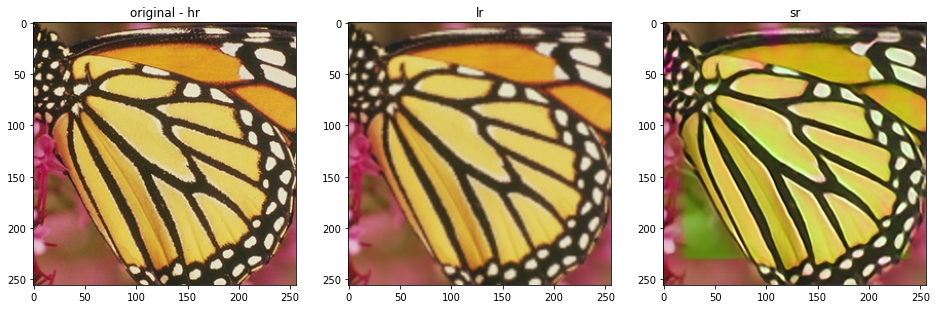

In [ ]:
# Set5의 나비 이미지 테스트
image_path = tf.keras.utils.get_file('butterfly.png', 'http://bit.ly/2oAOxgH')

img = tf.io.read_file(image_path)
img = tf.image.decode_jpeg(img, channels=3)
hr = tf.image.convert_image_dtype(img, tf.float32)

lr = tf.image.resize(hr, [hr.shape[0]//2, hr.shape[1]//2])
lr = tf.image.resize(lr, [hr.shape[0], hr.shape[1]])
predict_hr = model.predict(np.expand_dims(lr, axis=0))

print(tf.image.psnr(np.squeeze(predict_hr, axis=0), hr, max_val=1.0))
print(tf.image.psnr(lr, hr, max_val=1.0))


plt.figure(figsize=(16,6))
plt.subplot(1, 3, 1)
plt.imshow(hr)
plt.title('original - hr')

plt.subplot(1, 3, 2)
plt.imshow(lr)
plt.title('lr')

plt.subplot(1, 3, 3)
plt.imshow(np.squeeze(predict_hr, axis=0))
plt.title('sr')

### 7.4 이미지 분할

In [ ]:
!pip install tensorflow_datasets

In [ ]:
# Oxford Pet Dataset 불러오기
!python -m tensorflow_datasets.scripts.download_and_prepare --register_checksums --datasets=oxford_iiit_pet:3.2.0

2021-02-04 15:03:03.316128: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
I0204 15:03:05.830174 140306807244672 download_and_prepare.py:200] Running download_and_prepare for dataset(s):
oxford_iiit_pet:3.2.0
2021-02-04 15:03:05.831935: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2021-02-04 15:03:05.900760: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2021-02-04 15:03:05.975897: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
I0204 15:03:06.057484 140306807244672 dataset_info.py:434] Load pre-computed DatasetInfo (eg: splits, num examples,...) 

In [ ]:
import tensorflow_datasets as tfds
dataset, info = tfds.load('oxford_iiit_pet:3.2.0', with_info=True)

In [ ]:
info # Dataset 정보 확인

tfds.core.DatasetInfo(
    name='oxford_iiit_pet',
    version=3.2.0,
    description='The Oxford-IIIT pet dataset is a 37 category pet image dataset with roughly 200
images for each class. The images have large variations in scale, pose and
lighting. All images have an associated ground truth annotation of breed.',
    homepage='http://www.robots.ox.ac.uk/~vgg/data/pets/',
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=tf.string),
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=37),
        'segmentation_mask': Image(shape=(None, None, 1), dtype=tf.uint8),
        'species': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=7349,
    splits={
        'test': 3669,
        'train': 3680,
    },
    supervised_keys=('image', 'label'),
    citation="""@InProceedings{parkhi12a,
      author       = "Parkhi, O. M. and Vedaldi, A. and Zisserman, A. and Ja

In [ ]:
# train, 테스트 데이터 수 저장
train_data_len = info.splits['train'].num_examples
test_data_len = info.splits['test'].num_examples

In [ ]:
# 이미지 로드 함수 정의
def load_image(datapoint):
    img = tf.image.resize(datapoint['image'], (128,128))
    mask = tf.image.resize(datapoint['segmentation_mask'], (128,128))
    
    img = tf.cast(img, tf.float32)
    img = img / 255.0
    mask -= 1
    
    return img, mask

In [ ]:
# train, test Dataset 정의
train_dataset = dataset['train'].map(load_image)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.batch(16)

test_dataset = dataset['test'].map(load_image)
test_dataset = test_dataset.repeat()
test_dataset = test_dataset.batch(1)

0.3996089 0.00047392002


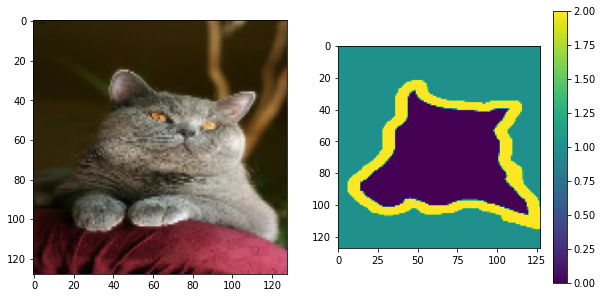

In [ ]:
# 이미지, 마스크 확인
import matplotlib.pyplot as plt
for img, mask in train_dataset.take(1):
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img[2])
    
    plt.subplot(1, 2, 2)
    plt.imshow(np.squeeze(mask[2], axis=2))
    plt.colorbar()

    print(np.amax(img[1][2]), np.amin(img[1][2]))

In [ ]:
# Segmentation을 위한 REDNet 네트워크 정의
def REDNet_segmentation(num_layers):
    conv_layers = []
    deconv_layers = []
    residual_layers = []

    inputs = tf.keras.layers.Input(shape=(None, None, 3))
    conv_layers.append(tf.keras.layers.Conv2D(3, kernel_size=3, padding='same', activation='relu'))

    for i in range(num_layers-1):
        conv_layers.append(tf.keras.layers.Conv2D(64, kernel_size=3, padding='same', activation='relu'))
        deconv_layers.append(tf.keras.layers.Conv2DTranspose(64, kernel_size=3, padding='same', activation='relu'))

    deconv_layers.append(tf.keras.layers.Conv2DTranspose(3, kernel_size=3, padding='same', activation='softmax')) # 소프트맥스 활성화함수 교체

    x = conv_layers[0](inputs)

    for i in range(num_layers-1):
        x = conv_layers[i+1](x)
        if i % 2 == 0:
            residual_layers.append(x)

    for i in range(num_layers-1):
        if i % 2 == 1:
            x = tf.keras.layers.Add()([x, residual_layers.pop()])
            x = tf.keras.layers.Activation('relu')(x)
        x = deconv_layers[i](x) 

    x = deconv_layers[-1](x)
    
    model = tf.keras.Model(inputs=inputs, outputs=x)
    return model

In [ ]:
# Segmentation을 위한 REDNet 네트워크 초기화 및 컴파일
model = REDNet_segmentation(15)
model.compile(optimizer=tf.optimizers.Adam(0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
# loss='sparse_categorical_crossentropy', metrics=['accuracy'] 추가

In [ ]:
# 이미지 분할을 위한 REDNet 네트워크 학습
history = model.fit(train_dataset, epochs=20, steps_per_epoch=train_data_len//16,
                   validation_data=test_dataset,validation_steps=test_data_len)

Epoch 1/20
230/230 [==============================] - 145s 623ms/step - loss: 0.9245 - accuracy: 0.5814 - val_loss: 0.8292 - val_accuracy: 0.5869
Epoch 2/20
230/230 [==============================] - 143s 622ms/step - loss: 0.7642 - accuracy: 0.6443 - val_loss: 0.8008 - val_accuracy: 0.6430
Epoch 3/20
230/230 [==============================] - 143s 623ms/step - loss: 0.7023 - accuracy: 0.6843 - val_loss: 0.7182 - val_accuracy: 0.6816
Epoch 4/20
230/230 [==============================] - 143s 624ms/step - loss: 0.6489 - accuracy: 0.7136 - val_loss: 0.6339 - val_accuracy: 0.7264
Epoch 5/20
230/230 [==============================] - 143s 624ms/step - loss: 0.6126 - accuracy: 0.7336 - val_loss: 0.5951 - val_accuracy: 0.7444
Epoch 6/20
230/230 [==============================] - 143s 624ms/step - loss: 0.5831 - accuracy: 0.7493 - val_loss: 0.5704 - val_accuracy: 0.7565
Epoch 7/20
230/230 [==============================] - 143s 624ms/step - loss: 0.5606 - accuracy: 0.7611 - val_loss: 0.5434 -

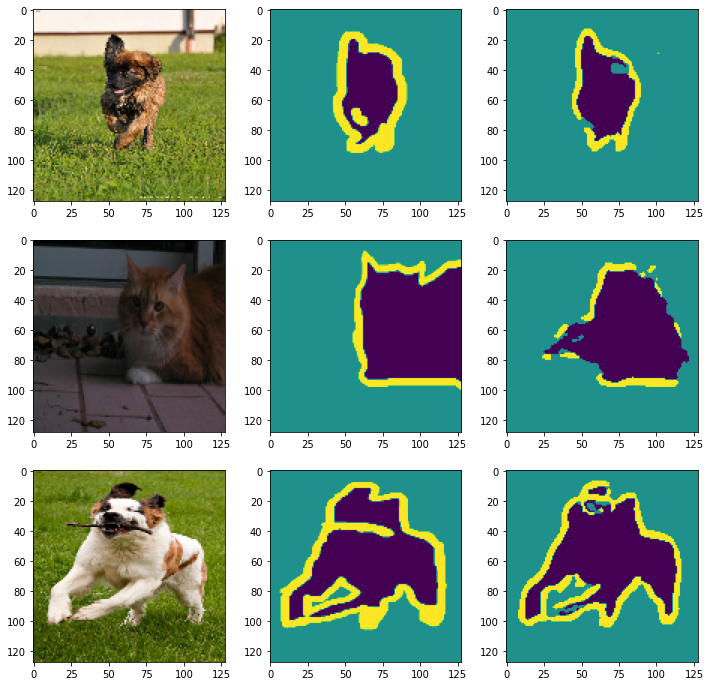

In [ ]:
# 테스트 이미지 분할 확인
plt.figure(figsize=(12, 12))
for idx, (img, mask) in enumerate(test_dataset.take(3)):
    plt.subplot(3, 3, idx*3+1)
    plt.imshow(img[0])
    
    plt.subplot(3, 3, idx*3+2)
    plt.imshow(np.squeeze(mask[0], axis=2))
    
    predict = tf.argmax(model.predict(img), axis=-1)
    plt.subplot(3, 3, idx*3+3)
    # plt.imshow(np.squeeze(predict[0], axis=0))
    plt.imshow(np.squeeze(predict, axis=0))

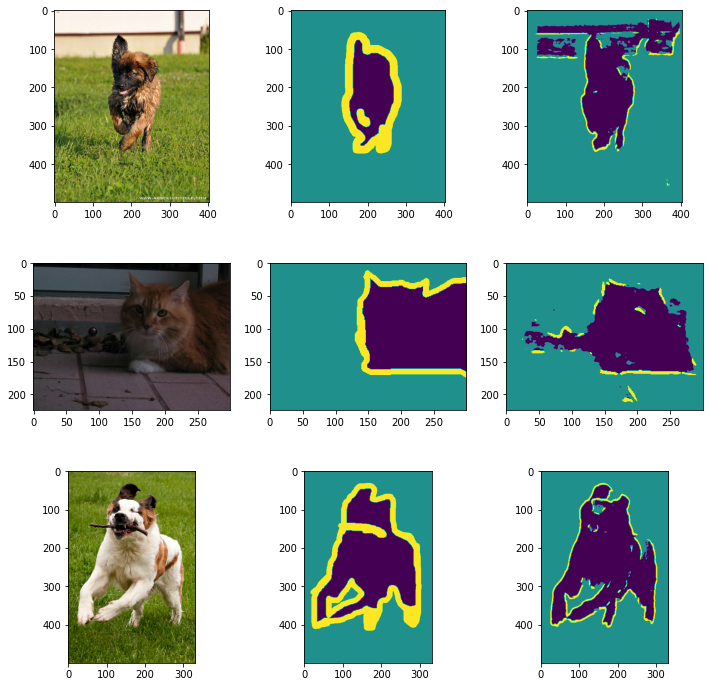

In [ ]:
# 테스트 이미지 분할 확인(원본)
plt.figure(figsize=(12, 12))
for idx, datapoint in enumerate(dataset['test'].take(3)):
    img = datapoint['image']
    mask = datapoint['segmentation_mask']
    
    img = tf.cast(img, tf.float32)
    img = img / 255.0
    mask -= 1
    
    plt.subplot(3, 3, idx*3+1)
    plt.imshow(img)
    
    plt.subplot(3, 3, idx*3+2)
    plt.imshow(np.squeeze(mask, axis=2))
    
    predict = tf.argmax(model.predict(tf.expand_dims(img, axis=0)), axis=-1)
    plt.subplot(3, 3, idx*3+3)
    # plt.imshow(np.squeeze(predict[0], axis=0))
    plt.imshow(np.squeeze(predict, axis=0))

# Chapter8 강화학습

### 8.1 신경망으로 경험 학습하기

In [ ]:
!pip install gym pyvirtualdisplay
!apt-get install -y xvfb python-opengl ffmpeg

!apt-get update
!apt-get install cmake
!pip install --upgrade setuptools
!pip install ez_setup
!pip install gym[atari]

!pip install box2d-py
!pip install gym[Box_2D]
!pip install pyglet

Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
Suggested packages:
  libgle3
The following NEW packages will be installed:
  python-opengl xvfb
0 upgraded, 2 newly installed, 0 to remove and 15 not upgraded.
Need to get 1,280 kB of archives.
After this operation, 7,686 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python-opengl all 3.1.0+dfsg-1 [496 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.8 [784 kB]
Fetched 1,280 kB in 1s (1,208 kB/s)
Selecting previously unselected package python-opengl.
(Reading database ... 146442 files and directories currently installed.)
Preparing to unpack .../python-opengl_3.1.0+dfsg-1_all.deb ...
Unpacking python-opengl (3.1.0+dfsg-1) ...
Selecting previously unselected package xvfb.
Preparing to unpack .../xvfb_2%3a1.19.6-1ubuntu4.8_amd

In [ ]:
# MountainCar-v0 환경만들기
import gym
import random
env = gym.make('MountainCar-v0')

In [ ]:
# 환경의 관찰 공간, 행동 공간 변수 확인
print(env.observation_space)
print(env.observation_space.low)
print(env.observation_space.high)
print()
print(env.action_space)
print()
print(env._max_episode_steps)

Box(-1.2000000476837158, 0.6000000238418579, (2,), float32)
[-1.2  -0.07]
[0.6  0.07]

Discrete(3)

200


In [ ]:
# 랜덤한 행동을 하는 에이전트 실행
step = 0
score = 0
env.reset()

while True:
    action = env.action_space.sample()
    obs, reward, done, info = env.step(action)
    print(score)
    score += reward
    step += 1
    
    if done:
        break
        
print('score:', score)
print('step:', step)

0
-1.0
-2.0
-3.0
-4.0
-5.0
-6.0
-7.0
-8.0
-9.0
-10.0
-11.0
-12.0
-13.0
-14.0
-15.0
-16.0
-17.0
-18.0
-19.0
-20.0
-21.0
-22.0
-23.0
-24.0
-25.0
-26.0
-27.0
-28.0
-29.0
-30.0
-31.0
-32.0
-33.0
-34.0
-35.0
-36.0
-37.0
-38.0
-39.0
-40.0
-41.0
-42.0
-43.0
-44.0
-45.0
-46.0
-47.0
-48.0
-49.0
-50.0
-51.0
-52.0
-53.0
-54.0
-55.0
-56.0
-57.0
-58.0
-59.0
-60.0
-61.0
-62.0
-63.0
-64.0
-65.0
-66.0
-67.0
-68.0
-69.0
-70.0
-71.0
-72.0
-73.0
-74.0
-75.0
-76.0
-77.0
-78.0
-79.0
-80.0
-81.0
-82.0
-83.0
-84.0
-85.0
-86.0
-87.0
-88.0
-89.0
-90.0
-91.0
-92.0
-93.0
-94.0
-95.0
-96.0
-97.0
-98.0
-99.0
-100.0
-101.0
-102.0
-103.0
-104.0
-105.0
-106.0
-107.0
-108.0
-109.0
-110.0
-111.0
-112.0
-113.0
-114.0
-115.0
-116.0
-117.0
-118.0
-119.0
-120.0
-121.0
-122.0
-123.0
-124.0
-125.0
-126.0
-127.0
-128.0
-129.0
-130.0
-131.0
-132.0
-133.0
-134.0
-135.0
-136.0
-137.0
-138.0
-139.0
-140.0
-141.0
-142.0
-143.0
-144.0
-145.0
-146.0
-147.0
-148.0
-149.0
-150.0
-151.0
-152.0
-153.0
-154.0
-155.0
-156.0
-157.0
-158.0


In [ ]:
env.observation_space.sample()

array([-0.54741025,  0.04008406], dtype=float32)

In [ ]:
from gym import logger as gymlogger
from gym.wrappers import Monitor
gymlogger.set_level(40) #error only
import glob
import io
import base64
from IPython.display import HTML
from IPython import display as ipythondisplay

In [ ]:
# env.render() 함수의 결과를 mp4 동영상으로 보여주기 위한 코드

"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_video():
    mp4list = glob.glob('video/*.mp4')
    if len(mp4list) > 0:
        mp4 = mp4list[0]
        video = io.open(mp4, 'r+b').read()
        encoded = base64.b64encode(video)
        ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
    else: 
        print("Could not find video")
    

def wrap_env(env):
    env = Monitor(env, './video', force=True)
    return env
  
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

In [ ]:
# 랜덤 행동 에이전트의 환경 실행 결과 확인
env = wrap_env(gym.make('MountainCar-v0'))
env.reset()

score = 0
step = 0
while True:
    action = env.action_space.sample()
    obs, reward, done, info = env.step(action)
    print(score)
    score += reward
    step += 1
    
    if done:
        break
        
print('score:', score)
print('step:', step)
env.close()
show_video()

0
-1.0
-2.0
-3.0
-4.0
-5.0
-6.0
-7.0
-8.0
-9.0
-10.0
-11.0
-12.0
-13.0
-14.0
-15.0
-16.0
-17.0
-18.0
-19.0
-20.0
-21.0
-22.0
-23.0
-24.0
-25.0
-26.0
-27.0
-28.0
-29.0
-30.0
-31.0
-32.0
-33.0
-34.0
-35.0
-36.0
-37.0
-38.0
-39.0
-40.0
-41.0
-42.0
-43.0
-44.0
-45.0
-46.0
-47.0
-48.0
-49.0
-50.0
-51.0
-52.0
-53.0
-54.0
-55.0
-56.0
-57.0
-58.0
-59.0
-60.0
-61.0
-62.0
-63.0
-64.0
-65.0
-66.0
-67.0
-68.0
-69.0
-70.0
-71.0
-72.0
-73.0
-74.0
-75.0
-76.0
-77.0
-78.0
-79.0
-80.0
-81.0
-82.0
-83.0
-84.0
-85.0
-86.0
-87.0
-88.0
-89.0
-90.0
-91.0
-92.0
-93.0
-94.0
-95.0
-96.0
-97.0
-98.0
-99.0
-100.0
-101.0
-102.0
-103.0
-104.0
-105.0
-106.0
-107.0
-108.0
-109.0
-110.0
-111.0
-112.0
-113.0
-114.0
-115.0
-116.0
-117.0
-118.0
-119.0
-120.0
-121.0
-122.0
-123.0
-124.0
-125.0
-126.0
-127.0
-128.0
-129.0
-130.0
-131.0
-132.0
-133.0
-134.0
-135.0
-136.0
-137.0
-138.0
-139.0
-140.0
-141.0
-142.0
-143.0
-144.0
-145.0
-146.0
-147.0
-148.0
-149.0
-150.0
-151.0
-152.0
-153.0
-154.0
-155.0
-156.0
-157.0
-158.0


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
-199.9264
[-162.0, -176.0, -180.0, -196.0, -182.0, -194.0, -170.0, -174.0, -196.0, -196.0, -184.0, -186.0, -190.0, -178.0, -186.0, -184.0, -166.0, -180.0, -192.0, -184.0, -162.0, -176.0, -196.0, -184.0, -180.0, -190.0, -186.0, -168.0, -192.0, -168.0, -180.0, -174.0, -188.0, -178.0, -178.0, -188.0, -180.0, -190.0, -196.0, -158.0]


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


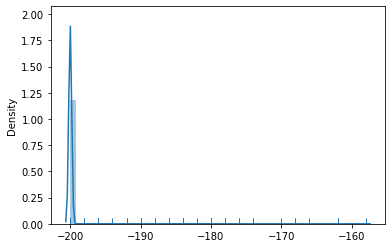

In [ ]:
# 성공적인 에피소드 저장
import numpy as np

env = gym.make('MountainCar-v0')

scores = []
training_data = []
accepted_scores = []
required_score = -198

for i in range(10000):
    if i % 100 == 0:
        print(i)
    env.reset()
    score = 0
    game_memory = []
    previous_obs = []
    
    while True:
        action = env.action_space.sample()
        obs, reward, done, info = env.step(action)
        
        if len(previous_obs) > 0:
            game_memory.append([previous_obs, action])
        
        previous_obs = obs
        if obs[0] > -0.2:
            reward = 1
        
        score += reward
        
        if done:
            break
        
    scores.append(score)
    if score > required_score:
        accepted_scores.append(score)
        for data in game_memory:
            training_data.append(data)

scores = np.array(scores)
print(scores.mean())
print(accepted_scores)

import seaborn as sns
sns.distplot(scores, rug=True)

In [ ]:
# training _data 확인
training_data[:5]

[[array([-0.40610918, -0.00187623]), 1],
 [array([-0.40884846, -0.00273927]), 0],
 [array([-0.41343146, -0.004583  ]), 0],
 [array([-0.41982575, -0.0063943 ]), 1],
 [array([-0.42698584, -0.00716008]), 1]]

In [ ]:
# 훈련 데이터 만들기
train_X = np.array([i[0] for i in training_data]).reshape(-1,2)
train_Y = np.array([i[1] for i in training_data]).reshape(-1,1)
print(train_X.shape)
print(train_Y.shape)

(7960, 2)
(7960, 1)


In [ ]:
model = tf.keras.Sequential([
                             tf.keras.layers.Dense(128,input_shape=(2,), activation='relu'),
                             tf.keras.layers.Dense(32, activation='relu'),
                             tf.keras.layers.Dense(3, activation='softmax')
])
model.compile(optimizer=tf.optimizers.Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               384       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                4128      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 99        
Total params: 4,611
Trainable params: 4,611
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 분류 신경망 학습
history = model.fit(train_X, train_Y, epochs=30, batch_size=16, validation_split=0.25)

Epoch 1/30
374/374 [==============================] - 2s 3ms/step - loss: 1.0992 - accuracy: 0.3375 - val_loss: 1.0976 - val_accuracy: 0.3482
Epoch 2/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0978 - accuracy: 0.3507 - val_loss: 1.0966 - val_accuracy: 0.3548
Epoch 3/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0984 - accuracy: 0.3413 - val_loss: 1.0960 - val_accuracy: 0.3518
Epoch 4/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0965 - accuracy: 0.3487 - val_loss: 1.0930 - val_accuracy: 0.3719
Epoch 5/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0928 - accuracy: 0.3745 - val_loss: 1.0896 - val_accuracy: 0.3990
Epoch 6/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0907 - accuracy: 0.3873 - val_loss: 1.0875 - val_accuracy: 0.4045
Epoch 7/30
374/374 [==============================] - 1s 2ms/step - loss: 1.0872 - accuracy: 0.4010 - val_loss: 1.0858 - val_accuracy: 0.4055
Epoch 

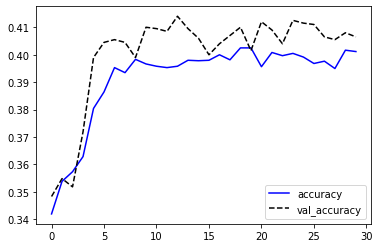

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], 'b-', label='accuracy')
plt.plot(history.history['val_accuracy'], 'k--', label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

scores = []
steps = []
actions = []

for i in range(500):
    if i % 100 == 0:
        print(i)
    score = 0
    step = 0
    previous_obs = []
    env.reset()
    
    while True:
        if len(previous_obs) == 0:
            action = env.action_space.sample()
        else:
          logit = model.predict(np.expand_dims(previous_obs, axis=0))[0]
          action = np.argmax(logit)
          actions.append(action)
        
        obs, reward, done, info = env.step(action)
        previous_obs = obs
        score += reward
        step += 1
        
        if done:
            break
        
    scores.append(score)
    steps.append(step)

0
100
200
300
400


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2056

-136.194


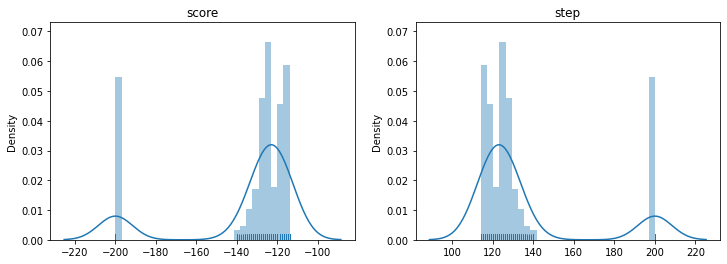

In [ ]:
# score, step 분포 확인
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].set_title('score')
ax[1].set_title('step')
sns.distplot(scores, rug=True, ax=ax[0])
sns.distplot(steps, rug=True, ax=ax[1])

print(np.mean(scores))

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


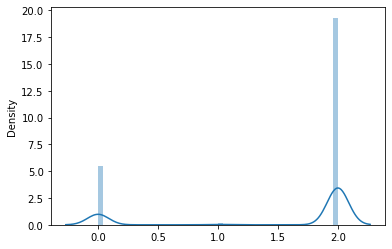

In [ ]:
sns.distplot(actions)

In [ ]:
# 분류 신경망 행동 에이전트 실행 결과 확인
env.close()
env = wrap_env(gym.make('MountainCar-v0'))
env.reset()

score = 0
step = 0
previous_obs = []
while True:
    if len(previous_obs) == 0:
        action = env.action_space.sample()
    else:
        logit = model.predict(np.expand_dims(previous_obs, axis=0))[0]
#         logit = logit.astype(float)
#         logit = logit / logit.sum()
#         prob = np.random.multinomial(1, logit)
#         action = np.argmax(prob)
        action = np.argmax(logit)
    
    obs, reward, done, info = env.step(action)
    previous_obs = obs
    score += reward
    step += 1
    
    if done:
        break

print('score:', score)
print('step:', step)
env.close()
show_video()

score: -125.0
step: 125


### 8.2 큐러닝

In [ ]:
# MountainCarContinuous-v0 환경 만들기
env = gym.make('MountainCarContinuous-v0')

print(env.observation_space)
print(env.observation_space.low)
print(env.observation_space.high)
print()
print(env.action_space)
print(env.action_space.low)
print(env.action_space.high)
print()
print(env._max_episode_steps)

Box(-1.2000000476837158, 0.6000000238418579, (2,), float32)
[-1.2  -0.07]
[0.6  0.07]

Box(-1.0, 1.0, (1,), float32)
[-1.]
[1.]

999


In [ ]:
# 랜덤 행동 에이전트의 환경 실행 결과 확인(200 스텝 제한)
env.reset()
score = 0
step = 0
    
for i in range(200):
    action = env.action_space.sample()
    obs, reward, done, info = env.step(action)

    previous_obs = obs
    score += reward
    step += 1

    if done:
        break
        
print(score, step)

-6.426861835212145 200


In [ ]:
# 랜덤 행동 에이전트의 환경 실행 결과 확인
env.reset()
score = 0
step = 0
    
while True:
    action = env.action_space.sample()
    obs, reward, done, info = env.step(action)

    previous_obs = obs
    score += reward
    step += 1

    if done:
        break
        
print(score, step)

-32.802426652321984 999


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
-199.841
[-184, -194, -176, -194, -170, -188, -184, -148, -180, -180, -162, -176, -186, -186, -178, -196, -176, -182, -156, -166, -190, -162, -196, -168, -180, -186, -168, -186, -184, -184, -164, -166, -180, -170, -194, -172, -186, -192, -170, -170, -170, -182, -188, -164, -176, -192, -172, -184, -190, -182, -176, -196, -162, -190, -184, -176, -192, -186, -194, -174, -186, -192, -164, -166, -166, -190, -186, -150, -168, -192, -182, -158, -190, -182, -186]


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


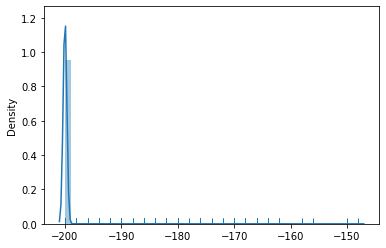

In [ ]:
# 랜덤 행동 에이전트의 환경 실행 결과 확인
scores = []
training_data = []
accepted_scores = []
required_score = -198

for i in range(10000):
    if i % 100 == 0:
        print(i)
    env.reset()
    score = 0
    game_memory = []
    previous_obs = []
    
    for i in range(200):
        action = env.action_space.sample()
        obs, reward, done, info = env.step(action)
        
        if len(previous_obs) > 0:
            game_memory.append([previous_obs, action])
        
        previous_obs = obs
        if obs[0] > -0.2:
            reward = 1
        else:
            reward = -1
        
        score += reward
        
        if done:
            break
        
    scores.append(score)
    if score > required_score:
        accepted_scores.append(score)
        for data in game_memory:
            training_data.append(data)

scores = np.array(scores)
print(scores.mean())
print(accepted_scores)

import seaborn as sns
sns.distplot(scores, rug=True)

In [ ]:
# 관찰 공간과 행동 공간을 격자화
state_grid_count = 10
action_grid_count = 6

q_table = []
for i in range(state_grid_count):
    q_table.append([])
    for j in range(state_grid_count):
        q_table[i].append([])
        for k in range(action_grid_count):
            q_table[i][j].append(1e-4)
            
actions = range(action_grid_count)
actions = np.array(actions).astype(float)
actions *= ((env.action_space.high - env.action_space.low) / (action_grid_count - 1))
actions += env.action_space.low

print(actions)

AttributeError: ignored

In [ ]:
# obs_to_state, softmax 함수 정의
import random
def obs_to_state(env, obs):
    obs = obs.flatten()
    low = env.observation_space.low
    high = env.observation_space.high
    idx = (obs - low) / (high - low) * state_grid_count
    idx = [int(x) for x in idx]
    return idx

def softmax(logits):
    exp_logits = np.exp(logits - np.max(logits))
    sum_exp_logits = np.sum(exp_logits)
    return exp_logits / sum_exp_logits

In [ ]:
# 큐러닝 에이전트 학습
max_episodes = 10000
scores = []
steps = []
select_actions = []

learning_rate = 0.05
gamma = 0.99
epsilon = 1.0
epsilon_min = 0.01

for i in range(max_episodes):
    epsilon *= 0.9
    epsilon = max(epsilon_min, epsilon)
    
    if i % 100 == 0 and i != 0:
        print(i, 'mean score: {}, mean step: {}, epsilon: {}'.format(np.mean(scores[-100:]), np.mean(steps[-100:]), epsilon))
        
    previous_obs = env.reset()
    score = 0
    step = 0
    
    while True:
        state_idx = obs_to_state(env, previous_obs)
        if random.random() < epsilon:
            action_idx = random.randint(0, action_grid_count-1)
            action = actions[action_idx]
        else:
            logits = q_table[state_idx[0]][state_idx[1]]
            action_idx = np.argmax(softmax(logits))
            action = actions[action_idx]
        
        obs, reward, done, info = env.step([action])
        previous_obs = obs
        score += reward
        reward -= 0.05
        step += 1
        
        select_actions.append(action)
        
        new_state_idx = obs_to_state(env, obs)
        
        q_table[state_idx[0]][state_idx[1]][action_idx] = \
            q_table[state_idx[0]][state_idx[1]][action_idx] + \
            learning_rate * (reward + gamma * np.amax(q_table[new_state_idx[0]][new_state_idx[1]]) - q_table[state_idx[0]][state_idx[1]][action_idx])
        
        if done:
            break
    
    scores.append(score)   
    steps.append(step)
    
    if np.mean(scores[-100:]) >= 90:
        print('Solved on episode {}!'.format(i))
        break

/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


ValueError: ignored

In [ ]:
# score, step 분포 확인
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].set_title('score')
ax[1].set_title('step')
sns.distplot(scores, rug=True, ax=ax[0])
sns.distplot(steps, rug=True, ax=ax[1])

print(np.mean(scores))

In [ ]:
# 행동 분포 확인
sns.distplot(select_actions)

In [ ]:
# score 그래프
plt.plot(scores)
plt.xlabel('episodes')
plt.ylabel('score')
plt.show()

In [ ]:
# 큐테이블 시각화
q_values = []
for i in range(state_grid_count):
    q_values.append([])
    for j in range(state_grid_count):
        action_idx = np.argmax(q_table[i][j])
        q_values[i].append(actions[action_idx])

plt.figure(figsize=(8, 6))
ax = sns.heatmap(q_values, annot=True, cmap='BrBG')
ax.set_xlabel('position')
ax.set_ylabel('velocity')
xticks = env.observation_space.low[0] + range(state_grid_count+1) * abs((env.observation_space.high[0] - env.observation_space.low[0]) / state_grid_count)
xticks = [int((xticks[idx] + xticks[idx+1]) / 2 * 100) / 100 for idx, xtick in enumerate(xticks[:-1])]
ax.set_xticklabels(xticks)
yticks = env.observation_space.low[1] + range(state_grid_count+1) * abs((env.observation_space.high[1] - env.observation_space.low[1]) / state_grid_count)
yticks = [int((yticks[idx] + yticks[idx+1]) / 2 * 100) / 100 for idx, ytick in enumerate(yticks[:-1])]
ax.set_yticklabels(yticks)
ax.invert_yaxis()
plt.show()

In [ ]:
# 큐러닝 에이전트 실행 결과 확인
env.close()
env = wrap_env(gym.make('MountainCarContinuous-v0'))

score = 0
step = 0
previous_obs = env.reset()

while True:
    state_idx = obs_to_state(env, previous_obs)
    if random.random() < epsilon:
        action_idx = random.randint(0, action_grid_count-1)
        action = actions[action_idx]
    else:
        logits = q_table[state_idx[0]][state_idx[1]]
        action_idx = np.argmax(softmax(logits))
        action = actions[action_idx]

    obs, reward, done, info = env.step([action])
    previous_obs = obs
    score += reward
    step += 1
    
    if done:
        break

print('score:', score)
print('step:', step)
env.close()
show_video()

### 8.3 딥 큐러닝 네트워크

In [ ]:
# gym_2048 설치
!pip install gym_2048 --no-dependencies

  Created wheel for gym-2048: filename=gym_2048-0.2.6-cp36-none-any.whl size=4683 sha256=aca853cf56e6c09f6a1548d6117d6cc3e3c9acdc11105ce841a3dd27bfa4788f
  Stored in directory: /root/.cache/pip/wheels/ab/11/22/a6c0fb3622f6fad7e8b7f4342a3c64e115bee08a4189bbae18
Successfully built gym-2048


In [ ]:
# gym_2048 환경 확인
import gym_2048
import gym

env = gym.make('2048-v0')
obs = env.reset()

print(obs)
print(env.observation_space)
print(env.action_space)

obs, _, _, _ = env.step(0)
print(obs)

[[2 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 4 0]]
Box(2, 4294967296, (4, 4), int64)
Discrete(4)
[[2 0 0 0]
 [0 0 0 0]
 [2 0 0 0]
 [4 0 0 0]]


/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


In [ ]:
# 랜덤 행동 에이전트의 실행 결과 확인
score = 0
step = 0
obs = env.reset()

while True:
    action = env.action_space.sample()
    obs, reward, done, info = env.step(action)
    
    score += reward
    step += 1
    if done:
        break
        
print('score:', score, 'step:', step)
print(obs)

score: 1292 step: 143
[[  8   4   8   2]
 [128  32   2   4]
 [  2   8  64   8]
 [  4  16   4   2]]


/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


In [ ]:
# 2048 게임 보드의 원-핫 인코딩 함수
layer_count = 12
table = {2**i:i for i in range(layer_count)}
print(table)

def preprocess(obs):    
    x = np.zeros((4, 4, layer_count))
    for i in range(4):
        for j in range(4):
            if obs[i,j] > 0:
                v = min(obs[i,j], 2**(layer_count-1))
                x[i,j,table[v]] = 1
            else:
                x[i,j,0] = 1
    return x

{1: 0, 2: 1, 4: 2, 8: 3, 16: 4, 32: 5, 64: 6, 128: 7, 256: 8, 512: 9, 1024: 10, 2048: 11}


In [ ]:
# 모델 정의 함수
def build_model():
    dense1 = 128
    dense2 = 128

    x = tf.keras.Input(shape=(4, 4, layer_count))

    conv_a = tf.keras.layers.Conv2D(dense1, kernel_size=(2,1), activation='relu')(x)
    conv_b = tf.keras.layers.Conv2D(dense1, kernel_size=(1,2), activation='relu')(x)

    conv_aa = tf.keras.layers.Conv2D(dense2, kernel_size=(2,1), activation='relu')(conv_a)
    conv_ab = tf.keras.layers.Conv2D(dense2, kernel_size=(1,2), activation='relu')(conv_a)
    conv_ba = tf.keras.layers.Conv2D(dense2, kernel_size=(2,1), activation='relu')(conv_b)
    conv_bb = tf.keras.layers.Conv2D(dense2, kernel_size=(1,2), activation='relu')(conv_b)

    flat = [tf.keras.layers.Flatten()(a) for a in [conv_a, conv_b, conv_aa, conv_ab, conv_ba, conv_bb]]

    concat = tf.keras.layers.Concatenate()(flat)
    dense1 = tf.keras.layers.Dense(256, activation='relu')(concat)
    out = tf.keras.layers.Dense(4, activation='linear')(dense1)

    model = tf.keras.Model(inputs=x, outputs=out)
    model.compile(optimizer=tf.optimizers.RMSprop(learning_rate=0.0005), loss='mse')
    # model.summary()
    return model

model = build_model()
target_model = build_model()

In [ ]:
# 학습 함수 정의
gamma = 0.9
batch_size = 512
max_memory = batch_size*8
memory = []

def append_sample(state, action, reward, next_state, done):
    memory.append([state, action, reward, next_state, done])

def train_model():
    np.random.shuffle(memory)

    len = max_memory // batch_size
    for k in range(len):
        mini_batch = memory[k*batch_size:(k+1)*batch_size]

        states = np.zeros((batch_size, 4, 4, layer_count))
        next_states = np.zeros((batch_size, 4, 4, layer_count))
        actions, rewards, dones = [], [], []

        for i in range(batch_size):
            states[i] = mini_batch[i][0]
            actions.append(mini_batch[i][1])
            rewards.append(mini_batch[i][2])
            next_states[i] = mini_batch[i][3]
            dones.append(mini_batch[i][4])

        target = model.predict(states)
        next_target = target_model.predict(next_states)

        for i in range(batch_size):
            if dones[i]:
                target[i][actions[i]] = rewards[i]
            else:
                target[i][actions[i]] = rewards[i] + gamma * np.amax(next_target[i])

        model.fit(states, target, batch_size=batch_size, epochs=1, verbose=0)

In [ ]:
# DQN 학습
import math

def softmax(logits):
    exp_logits = np.exp(logits - np.max(logits))
    sum_exp_logits = np.sum(exp_logits)
    return exp_logits / sum_exp_logits

max_episodes = 10001
epsilon = 0.9
epsilon_min = 0.1

scores = []
steps = []
iteration = 0

train_count = 0

for i in range(max_episodes):
    if i % 100 == 0 and i != 0:
        print('score mean:', np.mean(scores[-100:]), 'step mean:', np.mean(steps[-100:]), 'iteration:', iteration, 'epsilon:', epsilon)

    prev_obs = env.reset()

    score = 0
    step = 0
    not_move_list = np.array([1,1,1,1])
    prev_max = np.max(prev_obs)

    while True:
        iteration += 1

        if random.random() < epsilon:
            action = env.action_space.sample()
        else:
            x = preprocess(prev_obs)
            logits = model.predict(np.expand_dims(x, axis=0))[0]
            prob = softmax(logits)
            prob = prob * not_move_list
            action = np.argmax(prob)

        obs, reward, done, info = env.step(action)

        score += reward
        step += 1

        # not moved situation
        if reward == 0 and np.array_equal(obs, prev_obs):
            not_move_list[action] = 0
            continue
        else:
            not_move_list = np.array([1,1,1,1])

        # custom reward
        now_max = np.max(obs)
        if prev_max < now_max:
            prev_max = now_max
            reward = math.log(now_max, 2) * 0.1
        else:
            reward = 0

        reward += np.count_nonzero(prev_obs) - np.count_nonzero(obs) + 1

        append_sample(preprocess(prev_obs), action, reward, preprocess(obs), done)

        if len(memory) >= max_memory:
            train_model()
            memory = []

            train_count += 1
            if train_count % 4 == 0:
                target_model.set_weights(model.get_weights())

        prev_obs = obs

        if epsilon > 0.01 and iteration % 2500 == 0:
            epsilon = epsilon / 1.005

        if done:
            break

    scores.append(score)
    steps.append(step)

    print(i, 'score:', score, 'step:', step, 'max tile:', np.max(obs), 'memory len:', len(memory))

/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


0 score: 392 step: 69 max tile: 32 memory len: 64
1 score: 552 step: 77 max tile: 64 memory len: 141
2 score: 1292 step: 139 max tile: 128 memory len: 270
3 score: 1664 step: 180 max tile: 128 memory len: 438
4 score: 732 step: 99 max tile: 64 memory len: 532
5 score: 932 step: 121 max tile: 64 memory len: 647
6 score: 752 step: 108 max tile: 64 memory len: 748
7 score: 580 step: 82 max tile: 64 memory len: 827
8 score: 972 step: 104 max tile: 128 memory len: 930
9 score: 352 step: 61 max tile: 32 memory len: 991
10 score: 1180 step: 122 max tile: 128 memory len: 1110
11 score: 1236 step: 131 max tile: 128 memory len: 1238
12 score: 592 step: 83 max tile: 64 memory len: 1317
13 score: 676 step: 96 max tile: 64 memory len: 1408
14 score: 632 step: 86 max tile: 64 memory len: 1494
15 score: 1264 step: 138 max tile: 128 memory len: 1626
16 score: 644 step: 89 max tile: 64 memory len: 1711
17 score: 304 step: 55 max tile: 32 memory len: 1766
18 score: 564 step: 88 max tile: 32 memory len: 

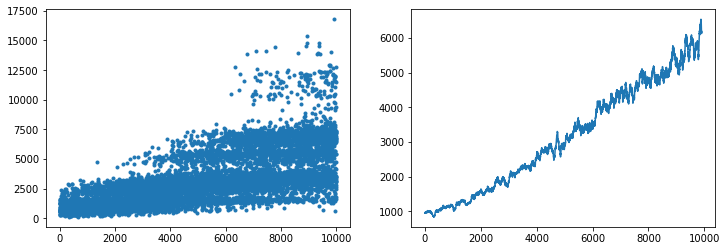

In [ ]:
# 점수 확인
import matplotlib.pyplot as plt

N = 100
rolling_mean = [np.mean(scores[x:x+N]) for x in range(len(scores)-N+1)]

plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.scatter(range(len(scores)), scores, marker='.')
plt.subplot(1, 2, 2)
plt.plot(rolling_mean)
plt.show()

In [ ]:
# 학습 데이터 보강
max_memory = 512*64

action_swap_array = [[0, 0, 2, 2, 1, 3, 1, 3],
                     [1, 3, 1, 3, 0, 0, 2, 2],
                     [2, 2, 0, 0, 3, 1, 3, 1],
                     [3, 1, 3, 1, 2, 2, 0, 0]]

def append_sample(state, action, reward, next_state, done):
    g0 = state
    g1 = g0[::-1,:,:]
    g2 = g0[:,::-1,:]
    g3 = g2[::-1,:,:]
    r0 = state.swapaxes(0,1)
    r1 = r0[::-1,:,:]
    r2 = r0[:,::-1,:]
    r3 = r2[::-1,:,:]

    g00 = next_state
    g10 = g00[::-1,:,:]
    g20 = g00[:,::-1,:]
    g30 = g20[::-1,:,:]
    r00 = next_state.swapaxes(0,1)
    r10 = r00[::-1,:,:]
    r20 = r00[:,::-1,:]
    r30 = r20[::-1,:,:]

    states = [g0, g1, g2, g3, r0, r1, r2, r3]
    next_states = [g00, g10, g20, g30, r00, r10, r20, r30]

    for i in range(8):
        memory.append([
            states[i],
            action_swap_array[action][i],
            reward,
            next_states[i],
            done
        ])

In [ ]:
# DQN 학습 (학습 데이터 보강)
max_episodes = 10001
epsilon = 0.9
epsilon_min = 0.1

scores = []
steps = []
iteration = 0
train_count = 0

for i in range(max_episodes):
    if i % 100 == 0 and i != 0:
        print('score mean:', np.mean(scores[-100:]), 'step mean:', np.mean(steps[-100:]), 'iteration:', iteration, 'epsilon:', epsilon)

    prev_obs = env.reset()

    score = 0
    step = 0
    not_move_list = np.array([1,1,1,1])
    prev_max = np.max(prev_obs)

    while True:
        iteration += 1

        if random.random() < epsilon:
            action = env.action_space.sample()
        else:
            x = preprocess(prev_obs)
            logits = model.predict(np.expand_dims(x, axis=0))[0]
            prob = softmax(logits)
            prob = prob * not_move_list
            action = np.argmax(prob)

        obs, reward, done, info = env.step(action)

        score += reward
        step += 1

        # not moved situation
        if reward == 0 and np.array_equal(obs, prev_obs):
            not_move_list[action] = 0
            continue
        else:
            not_move_list = np.array([1,1,1,1])

        # custom reward
        now_max = np.max(obs)
        if prev_max < now_max:
            prev_max = now_max
            reward = math.log(now_max, 2) * 0.1
        else:
            reward = 0

        reward += np.count_nonzero(prev_obs) - np.count_nonzero(obs) + 1

        append_sample(preprocess(prev_obs), action, reward, preprocess(obs), done)

        if len(memory) >= max_memory:
            train_model()
            memory = []

            train_count += 1
            if train_count % 4 == 0:
                target_model.set_weights(model.get_weights())

        prev_obs = obs

        if epsilon > 0.01 and iteration % 2500 == 0:
            epsilon = epsilon / 1.005

        if done:
            break

    scores.append(score)
    steps.append(step)

    print(i, 'score:', score, 'step:', step, 'max tile:', np.max(obs), 'memory len:', len(memory))

/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


0 score: 684 step: 101 max tile: 64 memory len: 744
1 score: 648 step: 88 max tile: 64 memory len: 1448
2 score: 752 step: 94 max tile: 64 memory len: 2176
3 score: 1324 step: 146 max tile: 128 memory len: 3272
4 score: 1116 step: 128 max tile: 128 memory len: 4216
5 score: 1276 step: 133 max tile: 128 memory len: 5280
6 score: 1224 step: 133 max tile: 128 memory len: 6304
7 score: 880 step: 113 max tile: 64 memory len: 7176
8 score: 916 step: 117 max tile: 64 memory len: 8080
9 score: 532 step: 78 max tile: 64 memory len: 8672
10 score: 612 step: 84 max tile: 64 memory len: 9344
11 score: 2312 step: 206 max tile: 256 memory len: 10912
12 score: 1316 step: 147 max tile: 128 memory len: 12000
13 score: 920 step: 109 max tile: 64 memory len: 12872
14 score: 656 step: 91 max tile: 64 memory len: 13592
15 score: 908 step: 114 max tile: 64 memory len: 14440
16 score: 1316 step: 141 max tile: 128 memory len: 15528
17 score: 1248 step: 123 max tile: 128 memory len: 16512
18 score: 900 step: 1

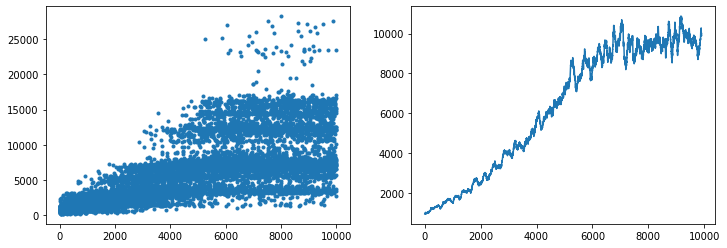

In [ ]:
# 점수 확인
import matplotlib.pyplot as plt

N = 100
rolling_mean = [np.mean(scores[x:x+N]) for x in range(len(scores)-N+1)]

plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.scatter(range(len(scores)), scores, marker='.')
plt.subplot(1, 2, 2)
plt.plot(rolling_mean)
plt.show()

In [ ]:
# 1,000 게임 테스트
test_scores = []
max_tile = {}
iteration = 0
train_count = 0

for i in range(1000):
    if i % 100 == 0 and i != 0:
        print('score mean:', np.mean(scores[-100:]), 'step mean:', np.mean(steps[-100:]), 'iteration:', iteration, 'epsilon:', epsilon)

    prev_obs = env.reset()

    score = 0
    step = 0
    not_move_list = np.array([1,1,1,1])

    while True:
        iteration += 1

        x = preprocess(prev_obs)
        logits = model.predict(np.expand_dims(x, axis=0))[0]
        prob = softmax(logits)
        prob = prob * not_move_list
        action = np.argmax(prob)

        obs, reward, done, info = env.step(action)

        score += reward
        step += 1

        # not moved situation
        if reward == 0 and np.array_equal(obs, prev_obs):
            not_move_list[action] = 0
            continue
        else:
            not_move_list = np.array([1,1,1,1])

        prev_obs = obs

        if done:
            now_max = np.max(obs)
            max_tile[now_max] = max_tile.get(now_max, 0) + 1
            break

    test_scores.append(score)
    print(i, 'score:', score, 'step:', step, 'max tile:', np.max(obs))

print(max_tile)

/usr/local/lib/python3.6/dist-packages/gym_2048/env.py:120: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  board[tile_locs] = tiles


0 score: 12344 step: 745 max tile: 1024 memory len: 14472
1 score: 14452 step: 832 max tile: 1024 memory len: 14472
2 score: 15600 step: 911 max tile: 1024 memory len: 14472
3 score: 7684 step: 528 max tile: 512 memory len: 14472
4 score: 26368 step: 1378 max tile: 2048 memory len: 14472
5 score: 12140 step: 722 max tile: 1024 memory len: 14472
6 score: 16448 step: 972 max tile: 1024 memory len: 14472
7 score: 7196 step: 493 max tile: 512 memory len: 14472
8 score: 16424 step: 974 max tile: 1024 memory len: 14472
9 score: 13464 step: 803 max tile: 1024 memory len: 14472
10 score: 6732 step: 459 max tile: 512 memory len: 14472
11 score: 5568 step: 397 max tile: 512 memory len: 14472
12 score: 12252 step: 730 max tile: 1024 memory len: 14472
13 score: 13244 step: 795 max tile: 1024 memory len: 14472
14 score: 14740 step: 864 max tile: 1024 memory len: 14472
15 score: 7572 step: 521 max tile: 512 memory len: 14472
16 score: 14740 step: 866 max tile: 1024 memory len: 14472
17 score: 7140 s